In [1]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import warnings
from pathlib import Path
from src.config import PROCESSED_DATA_DIR, OUTPUT_DATA_DIR

# Suppress runtime warnings for divisions by zero in empty arrays
warnings.filterwarnings('ignore', category=RuntimeWarning)

# =========================================================
# 1. Metric Calculation Functions
# =========================================================
def calc_nse(obs, sim):
    valid_mask = ~(np.isnan(obs) | np.isnan(sim))
    obs, sim = obs[valid_mask], sim[valid_mask]
    if len(obs) == 0 or np.sum((obs - np.mean(obs))**2) == 0:
        return np.nan
    return 1 - (np.sum((sim - obs)**2) / np.sum((obs - np.mean(obs))**2))

def calc_kge(obs, sim):
    valid_mask = ~(np.isnan(obs) | np.isnan(sim))
    obs, sim = obs[valid_mask], sim[valid_mask]
    if len(obs) < 2 or np.std(obs) == 0:
        return np.nan
    r = np.corrcoef(obs, sim)[0, 1]
    alpha = np.std(sim) / np.std(obs)
    beta = np.mean(sim) / np.mean(obs)
    return 1 - np.sqrt((r - 1)**2 + (alpha - 1)**2 + (beta - 1)**2)

def calc_pbias(obs, sim):
    valid_mask = ~(np.isnan(obs) | np.isnan(sim))
    obs, sim = obs[valid_mask], sim[valid_mask]
    if len(obs) == 0 or np.sum(obs) == 0:
        return np.nan
    return 100 * np.sum(sim - obs) / np.sum(obs)

def calc_melt_metrics(act_df, pred_df):
    """Helper function to calculate correlation, RMSE, MPE, and MdPE for flattened datasets."""
    act = act_df.values.flatten()
    pred = pred_df.values.flatten()
    
    valid = ~(np.isnan(act) | np.isnan(pred))
    act, pred = act[valid], pred[valid]
    
    if len(act) < 2:
        return np.nan, np.nan, np.nan, np.nan, np.nan
        
    r, _ = stats.pearsonr(act, pred)
    rho, _ = stats.spearmanr(act, pred)
    rmse = np.sqrt(np.mean((pred - act)**2))
    
    # Percent Errors (Mask out actual volumes < 0.01 MCM to prevent dividing by zero)
    safe_mask = act > 0.01 
    if np.sum(safe_mask) > 0:
        pct_errors = ((pred[safe_mask] - act[safe_mask]) / act[safe_mask]) * 100
        mpe = np.mean(pct_errors)
        mdpe = np.median(pct_errors)
    else:
        mpe, mdpe = np.nan, np.nan
        
    return r, rho, rmse, mpe, mdpe

# =========================================================
# 2. Setup and Load Static / Index Data
# =========================================================
print("Loading observation data and setting up full dataset indices...")

df_attr = pd.read_csv(PROCESSED_DATA_DIR / "static_attributes.csv", index_col=0)
df_mb = -pd.read_csv(PROCESSED_DATA_DIR / "glacier_volume_change.csv", index_col=0, parse_dates=True) 
df_obs = pd.read_csv(PROCESSED_DATA_DIR / "combined_streamflow.csv", index_col='Date', parse_dates=True)

# Use a raw prediction file as the template to get the ENTIRE dataset timeline
df_eval_template = pd.read_csv(OUTPUT_DATA_DIR / "phase_split" / "phase-split_preds_member_0.csv", index_col=0, parse_dates=True)
eval_dates = df_eval_template.index
eval_stations = df_eval_template.columns
eval_years = np.unique(eval_dates.year)

df_obs_eval = df_obs.loc[eval_dates, eval_stations].copy()

glac_stations = df_attr[df_attr['glacier_pct'] > 0.0].index
common_glac_stations = glac_stations.intersection(eval_stations).intersection(df_mb.columns)
basin_areas = df_attr.loc[common_glac_stations, 'basin_area_km2']

print("Converting ground truth units (m^3/s -> mm/day)...")
for stat in eval_stations:
    area_km2 = df_attr.loc[stat, 'basin_area_km2']
    df_obs_eval[stat] = df_obs_eval[stat] * (86.4 / area_km2)

# Prepare Actual Mass Balance for Aug, JJA, and Annual
df_mb_glac = df_mb[common_glac_stations]

df_act_aug = df_mb_glac[df_mb_glac.index.month == 8].groupby(df_mb_glac[df_mb_glac.index.month == 8].index.year).sum()
df_act_jja = df_mb_glac[df_mb_glac.index.month.isin([6, 7, 8])].groupby(df_mb_glac[df_mb_glac.index.month.isin([6, 7, 8])].index.year).sum()
df_act_ann = df_mb_glac.groupby(df_mb_glac.index.year).sum()

df_act_aug = df_act_aug.loc[df_act_aug.index.intersection(eval_years)]
df_act_jja = df_act_jja.loc[df_act_jja.index.intersection(eval_years)]
df_act_ann = df_act_ann.loc[df_act_ann.index.intersection(eval_years)]

# =========================================================
# 3. Model Evaluation Loop
# =========================================================
models_to_evaluate = ["phase_split", "topographic", "area", "baseline"]

for model in models_to_evaluate:
    print(f"\n{'='*95}")
    print(f"EVALUATING MODEL: {model.upper()}")
    print(f"{'='*95}")
    
    ensemble_dir = OUTPUT_DATA_DIR / model
    prefix = model.replace("_", "-") 
    
    # Streamflow metrics tracking
    ens_mean_nse, ens_med_nse, ens_max_nse, ens_min_nse, ens_nse_below_0 = [], [], [], [], []
    ens_mean_kge, ens_med_kge, ens_max_kge, ens_min_kge, ens_kge_below_0 = [], [], [], [], []
    ens_mean_kge_aug, ens_med_kge_aug = [], []
    ens_mean_kge_glac, ens_med_kge_glac = [], []
    ens_mean_pbias, ens_med_pbias = [], []
    ens_mean_pbias_aug, ens_med_pbias_aug = [], []
    
    # Track raw predictions and both mean/median member scores
    member_preds = []
    member_noglac_preds = [] # NEW: Tracking no-glacier predictions
    member_overall_nse_mean, member_overall_nse_med = [], []
    member_overall_kge_mean, member_overall_kge_med = [], []
    
    # Glacier metrics tracking
    ens_pct_neg_preds, ens_pct_neg_basins = [], []
    
    # Aug, JJA, Ann metrics (r, rho, rmse, mpe, mdpe)
    ens_aug_metrics = {'r': [], 'rho': [], 'rmse': [], 'mpe': [], 'mdpe': []}
    ens_jja_metrics = {'r': [], 'rho': [], 'rmse': [], 'mpe': [], 'mdpe': []}
    ens_ann_metrics = {'r': [], 'rho': [], 'rmse': [], 'mpe': [], 'mdpe': []}

    for i in range(10):
        # -------------------------------------------------
        # A. Streamflow Performance 
        # -------------------------------------------------
        file_path = ensemble_dir / f"{prefix}_preds_member_{i}.csv"
        df_pred = pd.read_csv(file_path, index_col=0, parse_dates=True)
        df_pred_eval = df_pred.loc[eval_dates, eval_stations]
        
        mem_nse_all, mem_kge_all, mem_pbias_all = [], [], []
        mem_kge_aug, mem_pbias_aug, mem_kge_glac = [], [], []
        
        for stat in eval_stations:
            obs, sim = df_obs_eval[stat].values, df_pred_eval[stat].values
            aug_mask = eval_dates.month == 8
            obs_aug, sim_aug = obs[aug_mask], sim[aug_mask]
            
            nse, kge, pbias = calc_nse(obs, sim), calc_kge(obs, sim), calc_pbias(obs, sim)
            kge_aug, pbias_aug = calc_kge(obs_aug, sim_aug), calc_pbias(obs_aug, sim_aug)
            
            mem_nse_all.append(nse)
            mem_kge_all.append(kge)
            mem_pbias_all.append(pbias)
            mem_kge_aug.append(kge_aug)
            mem_pbias_aug.append(pbias_aug)
            if stat in glac_stations: mem_kge_glac.append(kge)
                
        ens_mean_nse.append(np.nanmean(mem_nse_all))
        ens_med_nse.append(np.nanmedian(mem_nse_all))
        ens_max_nse.append(np.nanmax(mem_nse_all))
        ens_min_nse.append(np.nanmin(mem_nse_all))
        ens_nse_below_0.append(np.sum(np.array(mem_nse_all) < 0))
        
        ens_mean_kge.append(np.nanmean(mem_kge_all))
        ens_med_kge.append(np.nanmedian(mem_kge_all))
        ens_max_kge.append(np.nanmax(mem_kge_all))
        ens_min_kge.append(np.nanmin(mem_kge_all))
        ens_kge_below_0.append(np.sum(np.array(mem_kge_all) < 0))
        
        ens_mean_kge_aug.append(np.nanmean(mem_kge_aug))
        ens_med_kge_aug.append(np.nanmedian(mem_kge_aug))
        ens_mean_kge_glac.append(np.nanmean(mem_kge_glac))
        ens_med_kge_glac.append(np.nanmedian(mem_kge_glac))
        
        ens_mean_pbias.append(np.nanmean(mem_pbias_all))
        ens_med_pbias.append(np.nanmedian(mem_pbias_all))
        ens_mean_pbias_aug.append(np.nanmean(mem_pbias_aug))
        ens_med_pbias_aug.append(np.nanmedian(mem_pbias_aug))

        # Track this member's predictions and overall BOTH mean and median score
        member_preds.append(df_pred_eval)
        member_overall_nse_mean.append(np.nanmean(mem_nse_all))
        member_overall_nse_med.append(np.nanmedian(mem_nse_all))
        member_overall_kge_mean.append(np.nanmean(mem_kge_all))
        member_overall_kge_med.append(np.nanmedian(mem_kge_all))

        # -------------------------------------------------
        # B. Glacier Melt Extraction Performance
        # -------------------------------------------------
        noglac_path = ensemble_dir / f"{prefix}_preds_noglacier_member_{i}.csv"
        df_noglac = pd.read_csv(noglac_path, index_col=0, parse_dates=True)
        
        # NEW: Store the counterfactual predictions specifically so we can average them later
        member_noglac_preds.append(df_noglac.loc[eval_dates, eval_stations])
        
        diff_mm = df_pred.loc[eval_dates, common_glac_stations] - df_noglac.loc[eval_dates, common_glac_stations]
        
        # Calculate sums for Aug, JJA, and Annual
        diff_aug = diff_mm[diff_mm.index.month == 8].groupby(diff_mm[diff_mm.index.month == 8].index.year).sum()
        diff_jja = diff_mm[diff_mm.index.month.isin([6, 7, 8])].groupby(diff_mm[diff_mm.index.month.isin([6, 7, 8])].index.year).sum()
        diff_ann = diff_mm.groupby(diff_mm.index.year).sum()
        
        pred_mcm_aug = (diff_aug * basin_areas * 0.001).loc[df_act_aug.index]
        pred_mcm_jja = (diff_jja * basin_areas * 0.001).loc[df_act_jja.index]
        pred_mcm_ann = (diff_ann * basin_areas * 0.001).loc[df_act_ann.index]
        
        # Calculate Negative Melt Percentages
        neg_preds = (pred_mcm_ann < 0).sum().sum()
        total_preds = pred_mcm_ann.notna().sum().sum()
        ens_pct_neg_preds.append((neg_preds / total_preds) * 100 if total_preds > 0 else 0)
        
        neg_basins = (pred_mcm_ann < 0).any(axis=0).sum()
        total_basins = pred_mcm_ann.shape[1]
        ens_pct_neg_basins.append((neg_basins / total_basins) * 100 if total_basins > 0 else 0)
        
        # Calculate Metrics for each time period
        for act, pred, metric_dict in zip(
            [df_act_aug, df_act_jja, df_act_ann], 
            [pred_mcm_aug, pred_mcm_jja, pred_mcm_ann], 
            [ens_aug_metrics, ens_jja_metrics, ens_ann_metrics]
        ):
            r, rho, rmse, mpe, mdpe = calc_melt_metrics(act, pred)
            metric_dict['r'].append(r)
            metric_dict['rho'].append(rho)
            metric_dict['rmse'].append(rmse)
            metric_dict['mpe'].append(mpe)
            metric_dict['mdpe'].append(mdpe)

    # -------------------------------------------------
    # C. Calculate Best 8 and Ensemble Prediction Metrics
    # -------------------------------------------------
    # Find Best Models by sorting indices descending based on MEAN score
    best_nse_idx = np.argsort(member_overall_nse_mean)[::-1]
    best_kge_idx = np.argsort(member_overall_kge_mean)[::-1]
    
    # Calculate Average Scores for Best 8
    best8_nse_mean = np.nanmean([member_overall_nse_mean[idx] for idx in best_nse_idx[:8]])
    best8_nse_med  = np.nanmean([member_overall_nse_med[idx] for idx in best_nse_idx[:8]])
    
    best8_kge_mean = np.nanmean([member_overall_kge_mean[idx] for idx in best_kge_idx[:8]])
    best8_kge_med  = np.nanmean([member_overall_kge_med[idx] for idx in best_kge_idx[:8]])
    
    # Calculate Scores for Best 1
    best1_nse_mean = member_overall_nse_mean[best_nse_idx[0]]
    best1_nse_med  = member_overall_nse_med[best_nse_idx[0]]
    
    best1_kge_mean = member_overall_kge_mean[best_kge_idx[0]]
    best1_kge_med  = member_overall_kge_med[best_kge_idx[0]]
    
    # Build stacked matrices to compute mean/median timeseries (Shape: 10, Time, Stations)
    stacked_preds = np.array([df.values for df in member_preds])
    pred_mean_10 = np.nanmean(stacked_preds, axis=0)
    pred_med_10 = np.nanmedian(stacked_preds, axis=0)
    
    # Stack the predictions for just the top 8 models 
    stacked_preds_best8_nse = np.array([member_preds[idx].values for idx in best_nse_idx[:8]])
    pred_mean_8_nse = np.nanmean(stacked_preds_best8_nse, axis=0)
    
    stacked_preds_best8_kge = np.array([member_preds[idx].values for idx in best_kge_idx[:8]])
    pred_mean_8_kge = np.nanmean(stacked_preds_best8_kge, axis=0)
    
    # NEW: Calculate the average of the counterfactual "no_glacier" predictions for the Best 8 models
    stacked_noglac_best8_kge = np.array([member_noglac_preds[idx].values for idx in best_kge_idx[:8]])
    noglac_mean_8_kge = np.nanmean(stacked_noglac_best8_kge, axis=0)
    
    # NEW: Save the Best 8 predictions to CSVs!
    print(f"Saving Best 8 Mean predictions to {ensemble_dir.name} directory...")
    pd.DataFrame(pred_mean_8_kge, index=eval_dates, columns=eval_stations).to_csv(ensemble_dir / f"{prefix}_preds_best8_mean.csv")
    pd.DataFrame(noglac_mean_8_kge, index=eval_dates, columns=eval_stations).to_csv(ensemble_dir / f"{prefix}_preds_noglacier_best8_mean.csv")
    
    # Helper now returns BOTH the mean and median score across all basins
    def calc_agg_metric(agg_preds, metric_func):
        scores = []
        for j, stat in enumerate(eval_stations):
            obs = df_obs_eval[stat].values
            sim = agg_preds[:, j]
            scores.append(metric_func(obs, sim))
        return np.nanmean(scores), np.nanmedian(scores)
        
    ens_mean_10_nse_mean, ens_mean_10_nse_med = calc_agg_metric(pred_mean_10, calc_nse)
    ens_med_10_nse_mean,  ens_med_10_nse_med  = calc_agg_metric(pred_med_10, calc_nse)
    ens_mean_8_nse_mean,  ens_mean_8_nse_med  = calc_agg_metric(pred_mean_8_nse, calc_nse)
    
    ens_mean_10_kge_mean, ens_mean_10_kge_med = calc_agg_metric(pred_mean_10, calc_kge)
    ens_med_10_kge_mean,  ens_med_10_kge_med  = calc_agg_metric(pred_med_10, calc_kge)
    ens_mean_8_kge_mean,  ens_mean_8_kge_med  = calc_agg_metric(pred_mean_8_kge, calc_kge)

    # -------------------------------------------------
    # D. Print Metrics for Current Model
    # -------------------------------------------------
    def print_stat(name, mean_list, med_list=None, unit=""):
        if med_list is not None:
            print(f"{name:<42}: Mean = {np.mean(mean_list):7.3f}{unit} ± {np.std(mean_list):.3f}  |  Median = {np.mean(med_list):7.3f}{unit} ± {np.std(med_list):.3f}")
        else:
            print(f"{name:<42}: {np.mean(mean_list):7.3f}{unit} ± {np.std(mean_list):.3f}")

    def print_dual(name, mean_val, med_val):
        print(f"{name:<42}: Mean = {mean_val:7.3f}  |  Median = {med_val:7.3f}")

    print("\n--- STREAMFLOW PERFORMANCE (NSE) ---")
    print_stat("Average Score (All 10 Models)", ens_mean_nse, ens_med_nse)
    print_dual("Average Score (Best 8 Models)", best8_nse_mean, best8_nse_med)
    print_dual("Score (Best Single Model)", best1_nse_mean, best1_nse_med)
    print_dual("Score of Ensemble Mean Pred (10 Models)", ens_mean_10_nse_mean, ens_mean_10_nse_med)
    print_dual("Score of Ensemble Median Pred (10 Models)", ens_med_10_nse_mean, ens_med_10_nse_med)
    print_dual("Score of Ensemble Mean Pred (Best 8)", ens_mean_8_nse_mean, ens_mean_8_nse_med)
    
    print("\n--- STREAMFLOW PERFORMANCE (KGE) ---")
    print_stat("Average Score (All 10 Models)", ens_mean_kge, ens_med_kge)
    print_dual("Average Score (Best 8 Models)", best8_kge_mean, best8_kge_med)
    print_dual("Score (Best Single Model)", best1_kge_mean, best1_kge_med)
    print_dual("Score of Ensemble Mean Pred (10 Models)", ens_mean_10_kge_mean, ens_mean_10_kge_med)
    print_dual("Score of Ensemble Median Pred (10 Models)", ens_med_10_kge_mean, ens_med_10_kge_med)
    print_dual("Score of Ensemble Mean Pred (Best 8)", ens_mean_8_kge_mean, ens_mean_8_kge_med)
    
    print("\n--- ADDITIONAL STREAMFLOW KGE ---")
    print_stat("August KGE (All Stations)", ens_mean_kge_aug, ens_med_kge_aug)
    print_stat("Overall KGE (Glaciated Only)", ens_mean_kge_glac, ens_med_kge_glac)
    
    print("\n--- STREAMFLOW BIAS & EXTREMES ---")
    print_stat("Percent Bias (All Stations)", ens_mean_pbias, ens_med_pbias, unit="%")
    print_stat("August Percent Bias (All Stations)", ens_mean_pbias_aug, ens_med_pbias_aug, unit="%")
    print(f"{'Max / Min NSE Achieved':<42}: Max = {np.mean(ens_max_nse):7.3f}  |  Min = {np.mean(ens_min_nse):7.3f}")
    print(f"{'Max / Min KGE Achieved':<42}: Max = {np.mean(ens_max_kge):7.3f}  |  Min = {np.mean(ens_min_kge):7.3f}")
    print(f"{'Stations with NSE < 0 (Count)':<42}: {np.mean(ens_nse_below_0):7.1f} ± {np.std(ens_nse_below_0):.1f}")
    print(f"{'Stations with KGE < 0 (Count)':<42}: {np.mean(ens_kge_below_0):7.1f} ± {np.std(ens_kge_below_0):.1f}")
    
    print("\n--- GLACIER MELT ISOLATION (AUGUST) ---")
    print_stat("Pearson r (Linear Volume)", ens_aug_metrics['r'])
    print_stat("Spearman ρ (Rank Agreement)", ens_aug_metrics['rho'])
    print_stat("RMSE (Volume Error)", ens_aug_metrics['rmse'], unit=" MCM")
    print_stat("Percent Error", ens_aug_metrics['mpe'], ens_aug_metrics['mdpe'], unit="%")

    print("\n--- GLACIER MELT ISOLATION (SUMMER: JJA) ---")
    print_stat("Pearson r (Linear Volume)", ens_jja_metrics['r'])
    print_stat("Spearman ρ (Rank Agreement)", ens_jja_metrics['rho'])
    print_stat("RMSE (Volume Error)", ens_jja_metrics['rmse'], unit=" MCM")
    print_stat("Percent Error", ens_jja_metrics['mpe'], ens_jja_metrics['mdpe'], unit="%")
    
    print("\n--- GLACIER MELT ISOLATION (ANNUAL) ---")
    print_stat("Pearson r (Linear Volume)", ens_ann_metrics['r'])
    print_stat("Spearman ρ (Rank Agreement)", ens_ann_metrics['rho'])
    print_stat("RMSE (Volume Error)", ens_ann_metrics['rmse'], unit=" MCM")
    print_stat("Percent Error", ens_ann_metrics['mpe'], ens_ann_metrics['mdpe'], unit="%")
    print(f"{'% of Predictions with Negative Melt':<42}: {np.mean(ens_pct_neg_preds):7.2f}% ± {np.std(ens_pct_neg_preds):.2f}%")
    print(f"{'% of Basins with a Negative Prediction':<42}: {np.mean(ens_pct_neg_basins):7.2f}% ± {np.std(ens_pct_neg_basins):.2f}%")
    print("-" * 95)

print("\nDone evaluating all models!")

Loading observation data and setting up full dataset indices...
Converting ground truth units (m^3/s -> mm/day)...

EVALUATING MODEL: PHASE_SPLIT
Saving Best 8 Mean predictions to phase_split directory...

--- STREAMFLOW PERFORMANCE (NSE) ---
Average Score (All 10 Models)             : Mean =   0.650 ± 0.039  |  Median =   0.722 ± 0.048
Average Score (Best 8 Models)             : Mean =   0.667  |  Median =   0.743
Score (Best Single Model)                 : Mean =   0.681  |  Median =   0.760
Score of Ensemble Mean Pred (10 Models)   : Mean =   0.691  |  Median =   0.764
Score of Ensemble Median Pred (10 Models) : Mean =   0.690  |  Median =   0.770
Score of Ensemble Mean Pred (Best 8)      : Mean =   0.699  |  Median =   0.781

--- STREAMFLOW PERFORMANCE (KGE) ---
Average Score (All 10 Models)             : Mean =   0.626 ± 0.044  |  Median =   0.700 ± 0.056
Average Score (Best 8 Models)             : Mean =   0.645  |  Median =   0.724
Score (Best Single Model)                 : Mea

In [34]:
import pandas as pd
import numpy as np
import warnings
from pathlib import Path
from src.config import PROCESSED_DATA_DIR, OUTPUT_DATA_DIR

# Suppress runtime warnings for empty slices
warnings.filterwarnings('ignore', category=RuntimeWarning)

# =========================================================
# 1. Metric Function
# =========================================================
def calc_kge(obs, sim):
    valid_mask = ~(np.isnan(obs) | np.isnan(sim))
    obs, sim = obs[valid_mask], sim[valid_mask]
    if len(obs) < 2 or np.std(obs) == 0:
        return np.nan
    r = np.corrcoef(obs, sim)[0, 1]
    alpha = np.std(sim) / np.std(obs)
    beta = np.mean(sim) / np.mean(obs)
    return 1 - np.sqrt((r - 1)**2 + (alpha - 1)**2 + (beta - 1)**2)

# =========================================================
# 2. Setup Data Sources
# =========================================================
print("Loading observation data and setting up indices...")

df_attr = pd.read_csv(PROCESSED_DATA_DIR / "static_attributes.csv", index_col=0)
df_obs = pd.read_csv(PROCESSED_DATA_DIR / "combined_streamflow.csv", index_col='Date', parse_dates=True)

# Use the test template to ensure we match shapes exactly
df_test_template = pd.read_csv(OUTPUT_DATA_DIR / "test_set_predictions.csv", index_col=0, parse_dates=True)
test_dates = df_test_template.index
test_stations = df_test_template.columns

# Prepare observed data in mm/day
df_obs_test = df_obs.loc[test_dates, test_stations].copy()
for stat in test_stations:
    area_km2 = df_attr.loc[stat, 'basin_area_km2']
    df_obs_test[stat] = df_obs_test[stat] * (86.4 / area_km2)

# =========================================================
# 3. Process, Aggregate, and Save
# =========================================================
models_to_evaluate = ["phase_split", "topographic", "area", "baseline"]

for model in models_to_evaluate:
    print(f"\nProcessing {model.upper()}...")
    ensemble_dir = OUTPUT_DATA_DIR / model
    prefix = model.replace("_", "-")
    
    member_median_kges = []

    # --- Step 1: Find the Best 8 based on Median KGE ---
    for i in range(10):
        pred_path = ensemble_dir / f"{prefix}_preds_member_{i}.csv"
        df_pred = pd.read_csv(pred_path, index_col=0, parse_dates=True)
        
        # FIX: Slice the predictions to perfectly match the 3,652 test dates!
        df_pred_test = df_pred.loc[test_dates, test_stations]
        
        mem_kges = []
        for stat in test_stations:
            obs = df_obs_test[stat].values
            sim = df_pred_test[stat].values  # Use the sliced array
            mem_kges.append(calc_kge(obs, sim))
            
        # Record this member's median score across all basins
        member_median_kges.append((i, np.nanmedian(mem_kges)))

    # Sort descending by KGE and slice the top 8
    member_median_kges.sort(key=lambda x: x[1], reverse=True)
    best_8_indices = [x[0] for x in member_median_kges[:8]]
    
    print(f" -> Top 8 Members: {best_8_indices}")
    print(f" -> Top 8 Median KGEs: {[round(x[1], 3) for x in member_median_kges[:8]]}")

    # --- Step 2: Load the data for these specific 8 members ---
    preds_standard = []
    preds_noglacier = []

    for idx in best_8_indices:
        # Load Standard Predictions
        path_std = ensemble_dir / f"{prefix}_preds_member_{idx}.csv"
        # FIX: Slice to test dates here too
        df_std = pd.read_csv(path_std, index_col=0, parse_dates=True).loc[test_dates, test_stations]
        preds_standard.append(df_std.values)
        
        # Load No-Glacier Predictions
        path_ng = ensemble_dir / f"{prefix}_preds_noglacier_member_{idx}.csv"
        # FIX: Slice to test dates here too
        df_ng = pd.read_csv(path_ng, index_col=0, parse_dates=True).loc[test_dates, test_stations]
        preds_noglacier.append(df_ng.values)

    # --- Step 3: Calculate Mean and Std Dev (Shape: 8 x Time x Stations) ---
    arr_std = np.array(preds_standard)
    arr_ng = np.array(preds_noglacier)
    
    std_mean = np.nanmean(arr_std, axis=0)
    std_std = np.nanstd(arr_std, axis=0)
    
    ng_mean = np.nanmean(arr_ng, axis=0)
    ng_std = np.nanstd(arr_ng, axis=0)

    # --- Step 4: Format and Save to CSV ---
    def save_to_csv(data_array, filename_suffix):
        df_out = pd.DataFrame(data_array, index=test_dates, columns=test_stations)
        out_path = ensemble_dir / f"{prefix}_{filename_suffix}.csv"
        df_out.to_csv(out_path)
        print(f"    Saved: {out_path.name}")

    save_to_csv(std_mean, "preds_best8_mean")
    save_to_csv(std_std,  "preds_best8_std")
    save_to_csv(ng_mean,  "preds_noglacier_best8_mean")
    save_to_csv(ng_std,   "preds_noglacier_best8_std")

print("\nSuccessfully generated and saved all aggregated ensemble prediction files!")

Loading observation data and setting up indices...

Processing PHASE_SPLIT...
 -> Top 8 Members: [8, 7, 3, 5, 0, 4, 9, 6]
 -> Top 8 Median KGEs: [np.float64(0.702), np.float64(0.699), np.float64(0.694), np.float64(0.684), np.float64(0.682), np.float64(0.676), np.float64(0.653), np.float64(0.645)]
    Saved: phase-split_preds_best8_mean.csv
    Saved: phase-split_preds_best8_std.csv
    Saved: phase-split_preds_noglacier_best8_mean.csv
    Saved: phase-split_preds_noglacier_best8_std.csv

Processing TOPOGRAPHIC...
 -> Top 8 Members: [3, 4, 8, 7, 6, 2, 1, 0]
 -> Top 8 Median KGEs: [np.float64(0.722), np.float64(0.707), np.float64(0.699), np.float64(0.687), np.float64(0.685), np.float64(0.682), np.float64(0.675), np.float64(0.674)]
    Saved: topographic_preds_best8_mean.csv
    Saved: topographic_preds_best8_std.csv
    Saved: topographic_preds_noglacier_best8_mean.csv
    Saved: topographic_preds_noglacier_best8_std.csv

Processing AREA...
 -> Top 8 Members: [1, 5, 9, 2, 6, 3, 4, 0]
 ->

Loading data and imputing...
Calculating median KGE across 10 ensemble members...
Computing hydrographs and clustering...
Generating Voronoi spatial grid...
Rendering final plot...


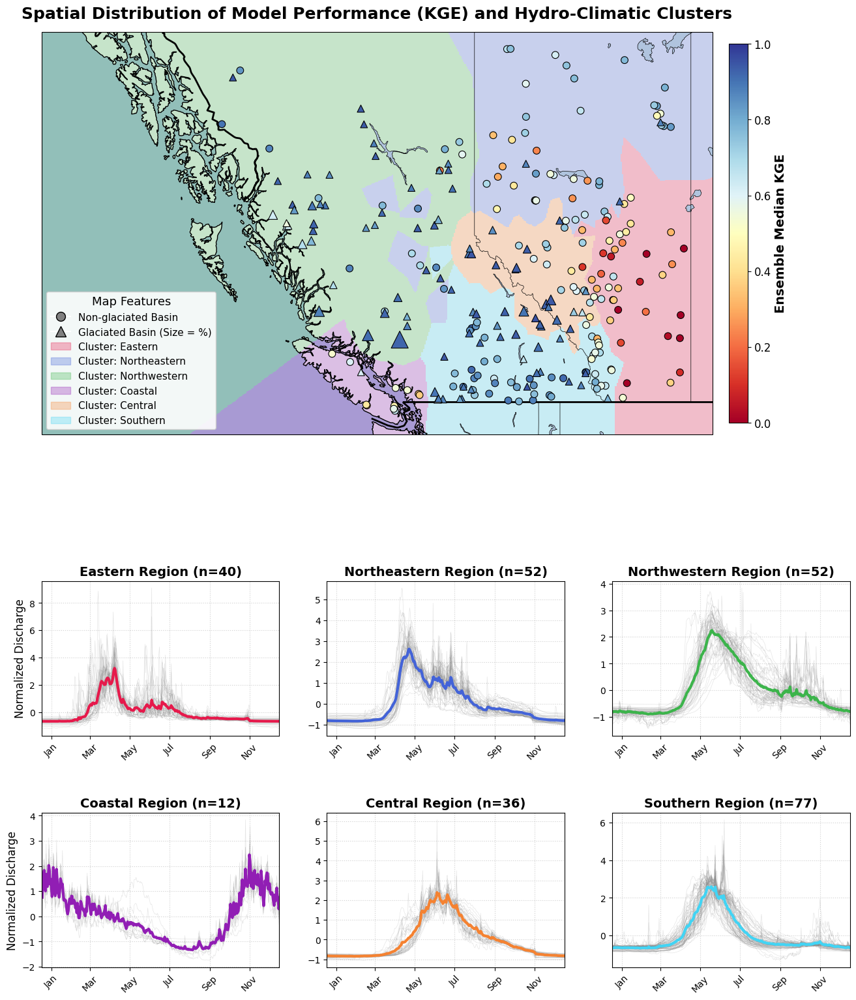

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from scipy.cluster.hierarchy import linkage, fcluster
from sklearn.neighbors import KNeighborsClassifier
from matplotlib.colors import ListedColormap, Normalize
import matplotlib.cm as cm
import warnings
from src.config import PROCESSED_DATA_DIR, RAW_DATA_DIR, OUTPUT_DATA_DIR

warnings.filterwarnings('ignore')

# =========================================================
# 1. Metric Calculation Function
# =========================================================
def calc_kge(obs, sim):
    valid_mask = ~(np.isnan(obs) | np.isnan(sim))
    obs, sim = obs[valid_mask], sim[valid_mask]
    if len(obs) < 2 or np.std(obs) == 0:
        return np.nan
    r = np.corrcoef(obs, sim)[0, 1]
    alpha = np.std(sim) / np.std(obs)
    beta = np.mean(sim) / np.mean(obs)
    return 1 - np.sqrt((r - 1)**2 + (alpha - 1)**2 + (beta - 1)**2)

# =========================================================
# 2. Load Data & Impute
# =========================================================
print("Loading data and imputing...")
df_obs = pd.read_csv(PROCESSED_DATA_DIR / "combined_streamflow.csv", index_col='Date', parse_dates=True)
df_meta = pd.read_csv(RAW_DATA_DIR / "station_metadata.csv", index_col=0) 
df_attr = pd.read_csv(PROCESSED_DATA_DIR / "static_attributes.csv", index_col=0) 

# Convert streamflow to mm/day for KGE calculation
for stat in df_obs.columns:
    if stat in df_attr.index:
        area_km2 = df_attr.loc[stat, 'basin_area_km2']
        df_obs[stat] = df_obs[stat] * (86.4 / area_km2)

# Imputation for Hydrographs
df_obs_imputed = df_obs.interpolate(method='linear', limit=7)
df_obs_imputed = df_obs_imputed.fillna(df_obs_imputed.groupby(df_obs_imputed.index.dayofyear).transform('mean'))
df_obs_imputed = df_obs_imputed.fillna(df_obs_imputed.groupby(df_obs_imputed.index.year).transform('min'))
df_obs_imputed = df_obs_imputed.fillna(df_obs_imputed.min())

# =========================================================
# 3. Calculate KGE across Ensemble
# =========================================================
print("Calculating median KGE across 10 ensemble members...")
ensemble_dir = OUTPUT_DATA_DIR / "phase_split"
all_stations = df_obs.columns
station_kge_lists = {stat: [] for stat in all_stations}

# Read all members and calculate KGE for the available timeseries
for i in range(10):
    df_pred = pd.read_csv(ensemble_dir / f"phase-split_preds_member_{i}.csv", index_col=0, parse_dates=True)
    # Align dates
    common_dates = df_obs.index.intersection(df_pred.index)
    
    for stat in all_stations:
        if stat in df_pred.columns:
            obs_vals = df_obs.loc[common_dates, stat].values
            sim_vals = df_pred.loc[common_dates, stat].values
            station_kge_lists[stat].append(calc_kge(obs_vals, sim_vals))

# Get the median KGE per station, clipped between 0 and 1
station_median_kge = {}
for stat, kge_list in station_kge_lists.items():
    med_kge = np.nanmedian(kge_list)
    station_median_kge[stat] = np.clip(med_kge, 0, 1)

df_kge = pd.DataFrame.from_dict(station_median_kge, orient='index', columns=['KGE'])

# =========================================================
# 4. Clustering
# =========================================================
print("Computing hydrographs and clustering...")
avg_hydrograph = df_obs_imputed.groupby(df_obs_imputed.index.dayofyear).mean()
avg_hydrograph_norm = (avg_hydrograph - avg_hydrograph.mean()) / avg_hydrograph.std()

X_hydro = avg_hydrograph_norm.T
X_merged = X_hydro.join(df_meta[['Latitude', 'Longitude']], how='inner')

hydro_features = X_merged.drop(columns=['Latitude', 'Longitude']).values
lat_norm = (X_merged['Latitude'] - X_merged['Latitude'].mean()) / X_merged['Latitude'].std()
lon_norm = (X_merged['Longitude'] - X_merged['Longitude'].mean()) / X_merged['Longitude'].std()

lat_features = np.tile(lat_norm.values, (182, 1)).T
lon_features = np.tile(lon_norm.values, (182, 1)).T

X_cluster_input = np.hstack((hydro_features, lat_features, lon_features))
Z = linkage(X_cluster_input, method='ward')

cluster_labels = fcluster(Z, t=6, criterion='maxclust') - 1

df_plot = pd.DataFrame({'Cluster': cluster_labels}, index=X_merged.index)
df_plot = df_plot.join(df_meta[['Latitude', 'Longitude']], how='inner')
df_plot = df_plot.join(df_attr[['glacier_pct']], how='left')
df_plot = df_plot.join(df_kge, how='inner')
df_plot['glacier_pct'] = df_plot['glacier_pct'].fillna(0)

cluster_names = {0: "Eastern", 1: "Northeastern", 2: "Northwestern", 3: "Coastal", 4: "Central", 5: "Southern"}
# Colors for the 6 clusters (Voronoi background)
cluster_colors = ['#e6194B', '#4363d8', '#3cb44b', '#911eb4', '#f58231', '#42d4f4']
cmap_clusters = ListedColormap(cluster_colors)

# =========================================================
# 5. Generate Voronoi Grid (KNN Approach)
# =========================================================
print("Generating Voronoi spatial grid...")
# Train KNN on station coordinates and cluster labels
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(df_plot[['Longitude', 'Latitude']], df_plot['Cluster'])

# Create a dense grid over the map area
xx, yy = np.meshgrid(np.linspace(-140, -109, 500), np.linspace(48, 59, 500))
# Predict the cluster for every point in the grid
Z_grid = knn.predict(np.c_[xx.ravel(), yy.ravel()])
Z_grid = Z_grid.reshape(xx.shape)

# =========================================================
# 6. Plotting - Master Layout
# =========================================================
print("Rendering final plot...")
fig = plt.figure(figsize=(16, 20))
# Create a grid: Top half for the map, bottom half for the 6 hydrographs
gs = fig.add_gridspec(4, 3, height_ratios=[1.5, 1.5, 1, 1], hspace=0.4)

# --- PANEL A: The Map ---
ax_map = fig.add_subplot(gs[0:2, :], projection=ccrs.Mercator())
ax_map.set_extent([-140, -109, 48, 59], crs=ccrs.PlateCarree())

res = '10m' 
ax_map.add_feature(cfeature.LAND.with_scale(res), facecolor='whitesmoke', zorder=0)
ax_map.add_feature(cfeature.OCEAN.with_scale(res), facecolor='lightsteelblue', zorder=0)
ax_map.add_feature(cfeature.COASTLINE.with_scale(res), edgecolor='black', zorder=2)
ax_map.add_feature(cfeature.LAKES.with_scale(res), facecolor='lightsteelblue', edgecolor='black', linewidth=0.5, zorder=2)

provinces = cfeature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces_lines', scale=res, facecolor='none')
ax_map.add_feature(provinces, edgecolor='black', linewidth=0.5, zorder=3)
ax_map.add_feature(cfeature.BORDERS.with_scale(res), linestyle='-', edgecolor='black', linewidth=2.0, zorder=3)

# Plot the Voronoi Background (Alpha is low so it acts as shading)
ax_map.pcolormesh(xx, yy, Z_grid, cmap=cmap_clusters, alpha=0.25, transform=ccrs.PlateCarree(), zorder=1)

# Plot the KGE Heatmap Points
# Using 'RdYlBu' where Red = 0 (Bad), Blue = 1 (Good)
sc_non_glac = ax_map.scatter(
    df_plot[df_plot['glacier_pct'] == 0]['Longitude'], 
    df_plot[df_plot['glacier_pct'] == 0]['Latitude'],
    c=df_plot[df_plot['glacier_pct'] == 0]['KGE'],
    cmap='RdYlBu', vmin=0, vmax=1,
    s=60, marker='o', edgecolors='k', linewidths=0.8, transform=ccrs.PlateCarree(), zorder=5
)

sc_glac = ax_map.scatter(
    df_plot[df_plot['glacier_pct'] > 0]['Longitude'], 
    df_plot[df_plot['glacier_pct'] > 0]['Latitude'],
    c=df_plot[df_plot['glacier_pct'] > 0]['KGE'],
    cmap='RdYlBu', vmin=0, vmax=1,
    s=(df_plot[df_plot['glacier_pct'] > 0]['glacier_pct'] * 5) + 60, 
    marker='^', edgecolors='k', linewidths=0.8, transform=ccrs.PlateCarree(), zorder=6
)

# Add Colorbar for KGE
cbar = plt.colorbar(sc_non_glac, ax=ax_map, orientation='vertical', pad=0.02, shrink=0.7)
cbar.set_label('Ensemble Median KGE', fontsize=14, fontweight='bold')
cbar.ax.tick_params(labelsize=12)

# Build Custom Legend
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches

legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', markersize=10, markeredgecolor='k', label='Non-glaciated Basin'),
    Line2D([0], [0], marker='^', color='w', markerfacecolor='gray', markersize=12, markeredgecolor='k', label='Glaciated Basin (Size = %)')
]
# Add cluster colors to legend
for i in range(6):
    legend_elements.append(mpatches.Patch(color=cluster_colors[i], alpha=0.3, label=f'Cluster: {cluster_names[i]}'))

ax_map.legend(handles=legend_elements, loc='lower left', title="Map Features", fontsize=11, title_fontsize=13, framealpha=0.9)
ax_map.set_title('Spatial Distribution of Model Performance (KGE) and Hydro-Climatic Clusters', fontsize=18, fontweight='bold', pad=15)

# --- PANEL B: The Hydrographs ---
month_ticks = [15, 74, 135, 196, 258, 319]
month_labels = ['Jan', 'Mar', 'May', 'Jul', 'Sep', 'Nov']

for cluster_id in range(6):
    # Calculate grid position for hydrographs (Rows 2 and 3 of the gridspec)
    row = 2 + (cluster_id // 3)
    col = cluster_id % 3
    ax = fig.add_subplot(gs[row, col])
    
    station_names = df_plot[df_plot['Cluster'] == cluster_id].index
    cluster_hydro_data = avg_hydrograph_norm[station_names]
    
    # Plot individual faint lines
    ax.plot(cluster_hydro_data.index, cluster_hydro_data.values, color='gray', alpha=0.2, linewidth=0.5)
    
    # Plot thick mean line
    cluster_mean = cluster_hydro_data.mean(axis=1)
    ax.plot(cluster_mean.index, cluster_mean.values, color=cluster_colors[cluster_id], linewidth=3)
    
    ax.set_title(f"{cluster_names[cluster_id]} Region (n={len(station_names)})", fontsize=14, fontweight='bold')
    ax.set_xticks(month_ticks)
    ax.set_xticklabels(month_labels, rotation=45)
    ax.set_xlim(0, 365)
    ax.grid(True, linestyle=':', alpha=0.6)
    
    if col == 0:
        ax.set_ylabel('Normalized Discharge', fontsize=12)

plt.show()

Calculating ensemble statistics...


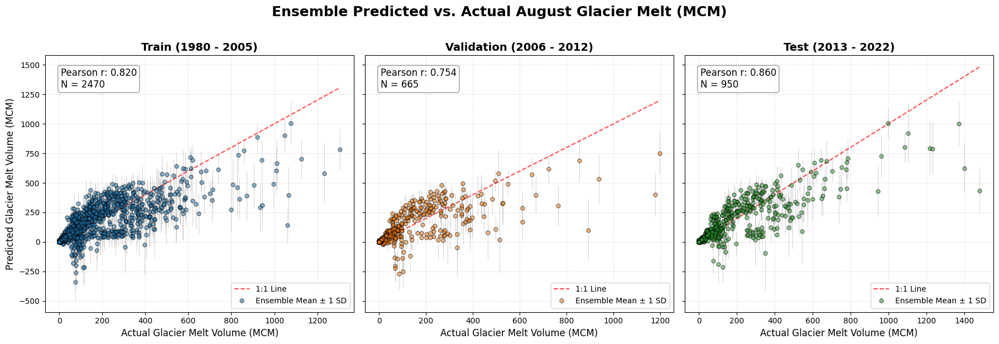

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
from src.config import PROCESSED_DATA_DIR, OUTPUT_DATA_DIR

# =========================================================
# 1. Setup Data Paths & Lists
# =========================================================
ensemble_dir = OUTPUT_DATA_DIR / "phase_split"
num_members = 10

df_attr = pd.read_csv(PROCESSED_DATA_DIR / "static_attributes.csv", index_col=0)
glaciated_stations = df_attr[df_attr['glacier_pct'] > 0].index

df_mb = -pd.read_csv(PROCESSED_DATA_DIR / "glacier_volume_change.csv", index_col=0, parse_dates=True)
common_stations = glaciated_stations.intersection(df_mb.columns)
df_mb = df_mb[common_stations]
basin_areas = df_attr.loc[common_stations, 'basin_area_km2']

# =========================================================
# 2. Calculate Ensemble Mean & Std
# =========================================================
print("Calculating ensemble statistics...")
list_diff_mcm = []

for i in range(num_members):
    df_pred = pd.read_csv(ensemble_dir / f"phase-split_preds_member_{i}.csv", index_col=0, parse_dates=True)[common_stations]
    df_pred_no_glac = pd.read_csv(ensemble_dir / f"phase-split_preds_noglacier_member_{i}.csv", index_col=0, parse_dates=True)[common_stations]
    
    df_diff_mm = df_pred - df_pred_no_glac
    df_diff_aug_mm = df_diff_mm[df_diff_mm.index.month == 8].groupby(df_diff_mm[df_diff_mm.index.month == 8].index.year).sum()
    df_diff_aug_mcm = df_diff_aug_mm * basin_areas * 0.001
    list_diff_mcm.append(df_diff_aug_mcm)

# Stack to 3D array (Member, Year, Station) to compute stats across axis 0
stacked_diffs = np.stack([df.values for df in list_diff_mcm], axis=0)
mean_vals = np.mean(stacked_diffs, axis=0)
std_vals = np.std(stacked_diffs, axis=0)

# Reconstruct into DataFrames
df_pred_mcm_mean = pd.DataFrame(mean_vals, index=list_diff_mcm[0].index, columns=list_diff_mcm[0].columns)
df_pred_mcm_std = pd.DataFrame(std_vals, index=list_diff_mcm[0].index, columns=list_diff_mcm[0].columns)

df_mb_aug_yearly = df_mb[df_mb.index.month == 8].groupby(df_mb[df_mb.index.month == 8].index.year).sum()
common_years = df_mb_aug_yearly.index.intersection(df_pred_mcm_mean.index)

df_actual_mcm = df_mb_aug_yearly.loc[common_years]
df_pred_mcm = df_pred_mcm_mean.loc[common_years]
df_std_mcm = df_pred_mcm_std.loc[common_years]

# =========================================================
# 3. Updated Prep Plotting Function
# =========================================================
def get_clean_flat_data(df_actual, df_pred, df_std, start_yr, end_yr):
    mask = (df_actual.index >= start_yr) & (df_actual.index <= end_yr)
    
    act_slice = df_actual[mask].values.flatten()
    pred_slice = df_pred[mask].values.flatten()
    std_slice = df_std[mask].values.flatten()
    
    valid_mask = ~(np.isnan(act_slice) | np.isnan(pred_slice))
    x_clean = act_slice[valid_mask]
    y_clean = pred_slice[valid_mask]
    yerr_clean = std_slice[valid_mask]
    
    corr, _ = stats.pearsonr(x_clean, y_clean)
    return x_clean, y_clean, yerr_clean, corr

# =========================================================
# 4. Plotting with Error Bars
# =========================================================
periods = {
    'Train (1980 - 2005)': (1980, 2005),
    'Validation (2006 - 2012)': (2006, 2012),
    'Test (2013 - 2022)': (2013, 2022)
}

fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
props = dict(boxstyle='round', facecolor='white', alpha=0.8, edgecolor='gray')
colors = ['tab:blue', 'tab:orange', 'tab:green']

for i, (period_name, (start_yr, end_yr)) in enumerate(periods.items()):
    ax = axes[i]
    x, y, yerr, corr = get_clean_flat_data(df_actual_mcm, df_pred_mcm, df_std_mcm, start_yr, end_yr)
    
    # Using errorbar instead of scatter
    ax.errorbar(x, y, yerr=yerr, fmt='o', color=colors[i], 
                ecolor='gray', elinewidth=0.5, capsize=0, 
                alpha=0.5, markeredgecolor='k', ms=5, label='Ensemble Mean ± 1 SD')
    
    ax.set_title(f'{period_name}', fontsize=14, fontweight='bold')
    ax.set_xlabel('Actual Glacier Melt Volume (MCM)', fontsize=12)
    if i == 0:
        ax.set_ylabel('Predicted Glacier Melt Volume (MCM)', fontsize=12)
        
    ax.text(0.05, 0.95, f'Pearson r: {corr:.3f}\nN = {len(x)}', transform=ax.transAxes, 
            fontsize=12, verticalalignment='top', bbox=props)
            
    # 1:1 Line
    limit = max(x.max(), y.max()) if len(x) > 0 else 10
    ax.plot([0, limit], [0, limit], 'r--', alpha=0.7, label='1:1 Line')
    
    ax.grid(True, linestyle=':', alpha=0.6)
    ax.legend(loc='lower right', fontsize=10)

plt.suptitle('Ensemble Predicted vs. Actual August Glacier Melt (MCM)', fontsize=18, y=1.02, fontweight='bold')
plt.tight_layout()
plt.show()

Loading data and calculating ensemble means...
Calculating KGE and Melt Residuals per Station-Year...


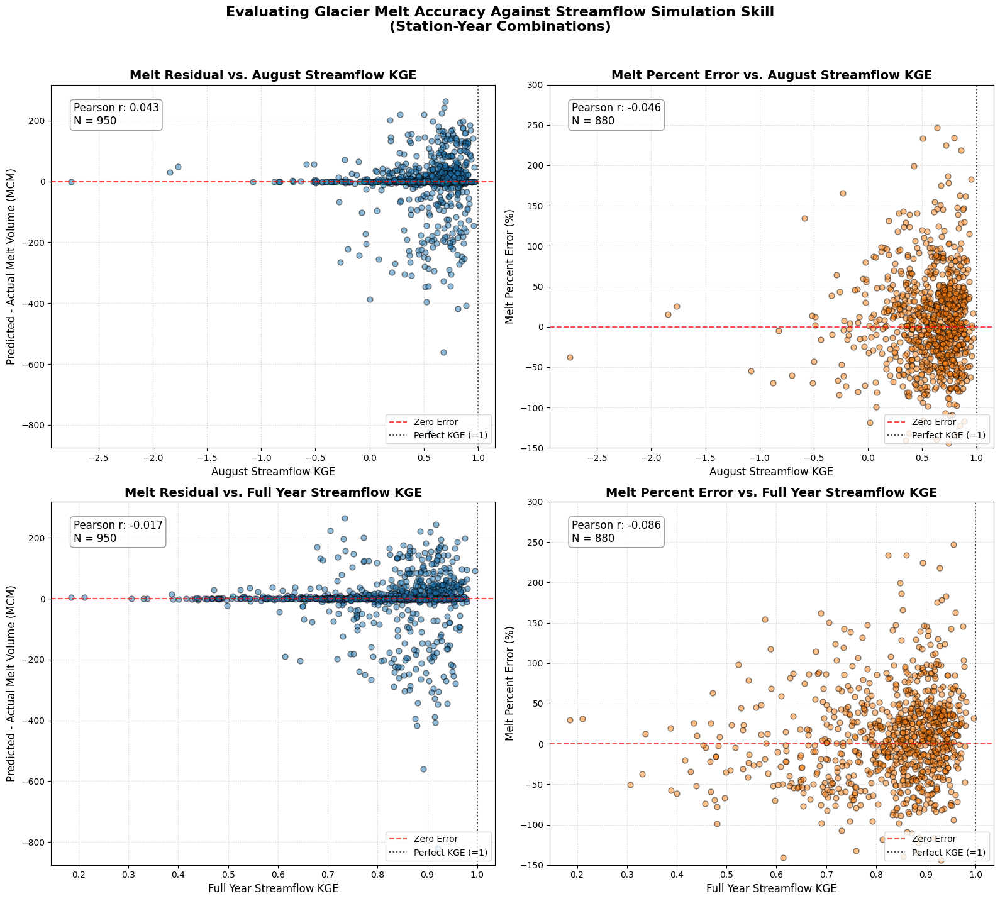

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
import warnings
from src.config import PROCESSED_DATA_DIR, OUTPUT_DATA_DIR

warnings.filterwarnings('ignore', category=RuntimeWarning)

# =========================================================
# 1. KGE Calculation Function
# =========================================================
def calc_kge(obs, sim):
    valid_mask = ~(np.isnan(obs) | np.isnan(sim))
    obs, sim = obs[valid_mask], sim[valid_mask]
    if len(obs) < 2 or np.std(obs) == 0:
        return np.nan
    r = np.corrcoef(obs, sim)[0, 1]
    alpha = np.std(sim) / np.std(obs)
    beta = np.mean(sim) / np.mean(obs)
    return 1 - np.sqrt((r - 1)**2 + (alpha - 1)**2 + (beta - 1)**2)

# =========================================================
# 2. Setup & Load Data
# =========================================================
print("Loading data and calculating ensemble means...")

df_attr = pd.read_csv(PROCESSED_DATA_DIR / "static_attributes.csv", index_col=0)
df_obs = pd.read_csv(PROCESSED_DATA_DIR / "combined_streamflow.csv", index_col='Date', parse_dates=True)
df_mb = -pd.read_csv(PROCESSED_DATA_DIR / "glacier_volume_change.csv", index_col=0, parse_dates=True) # Native MCM

# Get template for test dates/stations
df_test_template = pd.read_csv(OUTPUT_DATA_DIR / "test_set_predictions.csv", index_col=0, parse_dates=True)
test_dates = df_test_template.index

glaciated_stations = df_attr[df_attr['glacier_pct'] > 0].index
common_stations = glaciated_stations.intersection(df_test_template.columns).intersection(df_mb.columns).intersection(df_obs.columns)

df_obs_test = df_obs.loc[test_dates, common_stations].copy()

# --- THE FIX ---
# Since df_mb is monthly, we CANNOT slice it with the daily test_dates index.
# We just isolate the common stations and leave the monthly index intact.
df_mb_test = df_mb[common_stations].copy()

# Convert Obs to mm/day
basin_areas = df_attr.loc[common_stations, 'basin_area_km2']
for stat in common_stations:
    df_obs_test[stat] = df_obs_test[stat] * (86.4 / basin_areas[stat])

# --- Calculate Ensemble Means ---
ensemble_dir = OUTPUT_DATA_DIR / "phase_split"
list_pred, list_noglac = [], []

for i in range(10):
    pred = pd.read_csv(ensemble_dir / f"phase-split_preds_member_{i}.csv", index_col=0, parse_dates=True)
    noglac = pd.read_csv(ensemble_dir / f"phase-split_preds_noglacier_member_{i}.csv", index_col=0, parse_dates=True)
    list_pred.append(pred.loc[test_dates, common_stations])
    list_noglac.append(noglac.loc[test_dates, common_stations])

df_pred_mean = sum(list_pred) / 10
df_noglac_mean = sum(list_noglac) / 10

# =========================================================
# 3. Calculate Station-Yearly Metrics
# =========================================================
print("Calculating KGE and Melt Residuals per Station-Year...")
test_years = np.unique(test_dates.year)
records = []

for y in test_years:
    for s in common_stations:
        # Timeseries slices
        obs_y = df_obs_test.loc[str(y), s].values
        pred_y = df_pred_mean.loc[str(y), s].values
        
        obs_aug = df_obs_test.loc[f"{y}-08", s].values
        pred_aug = df_pred_mean.loc[f"{y}-08", s].values
        
        # Calculate KGEs
        kge_year = calc_kge(obs_y, pred_y)
        kge_aug = calc_kge(obs_aug, pred_aug)
        
        # Calculate Melt Volumes (MCM)
        pred_melt_mm_sum = df_pred_mean.loc[f"{y}-08", s].sum() - df_noglac_mean.loc[f"{y}-08", s].sum()
        pred_melt_mcm = pred_melt_mm_sum * basin_areas[s] * 0.001
        
        # Extract Actual Melt from the monthly dataframe
        act_melt_mcm = df_mb_test.loc[f"{y}-08", s].sum()
        
        # Residuals
        residual_mcm = pred_melt_mcm - act_melt_mcm
        
        # Percent Error (protect against zero-division)
        if act_melt_mcm > 0.0001: 
            pct_error = (residual_mcm / act_melt_mcm) * 100
        else:
            pct_error = np.nan
            
        records.append({
            'Station': s, 'Year': y,
            'KGE_Aug': kge_aug, 'KGE_Year': kge_year,
            'Residual_MCM': residual_mcm, 'Pct_Error': pct_error
        })

df_res = pd.DataFrame(records)

# Clean out infinite values from extreme % error cases
df_res.replace([np.inf, -np.inf], np.nan, inplace=True)

# =========================================================
# 4. Helper for Plotting
# =========================================================
def get_clean_data(df, x_col, y_col):
    mask = ~(df[x_col].isna() | df[y_col].isna())
    clean_df = df[mask]
    x = clean_df[x_col].values
    y = clean_df[y_col].values
    corr, _ = stats.pearsonr(x, y)
    return x, y, corr

# =========================================================
# 5. Plotting (2x2 Grid)
# =========================================================
fig, axes = plt.subplots(2, 2, figsize=(16, 14))
props = dict(boxstyle='round', facecolor='white', alpha=0.8, edgecolor='gray')

def plot_panel(ax, x_col, y_col, title, xlabel, ylabel, color, use_ylim=None):
    x, y, corr = get_clean_data(df_res, x_col, y_col)
    
    ax.scatter(x, y, color=color, alpha=0.5, edgecolor='k', s=40)
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(xlabel, fontsize=12)
    ax.set_ylabel(ylabel, fontsize=12)
    
    # Add correlation text
    ax.text(0.05, 0.95, f'Pearson r: {corr:.3f}\nN = {len(x)}', transform=ax.transAxes, 
            fontsize=12, verticalalignment='top', bbox=props)
            
    # Reference Lines
    ax.axhline(0, color='red', linestyle='--', alpha=0.7, label='Zero Error')
    ax.axvline(1, color='black', linestyle=':', alpha=0.7, label='Perfect KGE (=1)')
    
    if use_ylim:
        ax.set_ylim(use_ylim)
        
    ax.legend(loc='lower right')
    ax.grid(True, linestyle=':', alpha=0.6)

# --- Row 1: August KGE ---
plot_panel(axes[0, 0], 'KGE_Aug', 'Residual_MCM', 
           'Melt Residual vs. August Streamflow KGE', 
           'August Streamflow KGE', 'Predicted - Actual Melt Volume (MCM)', 'tab:blue')

plot_panel(axes[0, 1], 'KGE_Aug', 'Pct_Error', 
           'Melt Percent Error vs. August Streamflow KGE', 
           'August Streamflow KGE', 'Melt Percent Error (%)', 'tab:orange', use_ylim=(-150, 300))

# --- Row 2: Full Year KGE ---
plot_panel(axes[1, 0], 'KGE_Year', 'Residual_MCM', 
           'Melt Residual vs. Full Year Streamflow KGE', 
           'Full Year Streamflow KGE', 'Predicted - Actual Melt Volume (MCM)', 'tab:blue')

plot_panel(axes[1, 1], 'KGE_Year', 'Pct_Error', 
           'Melt Percent Error vs. Full Year Streamflow KGE', 
           'Full Year Streamflow KGE', 'Melt Percent Error (%)', 'tab:orange', use_ylim=(-150, 300))

plt.suptitle('Evaluating Glacier Melt Accuracy Against Streamflow Simulation Skill\n(Station-Year Combinations)', fontsize=16, y=1.02, fontweight='bold')
plt.tight_layout()
plt.show()

Loading data and calculating ensemble means for 1980-2022...
Calculating Yearly Error Metrics...


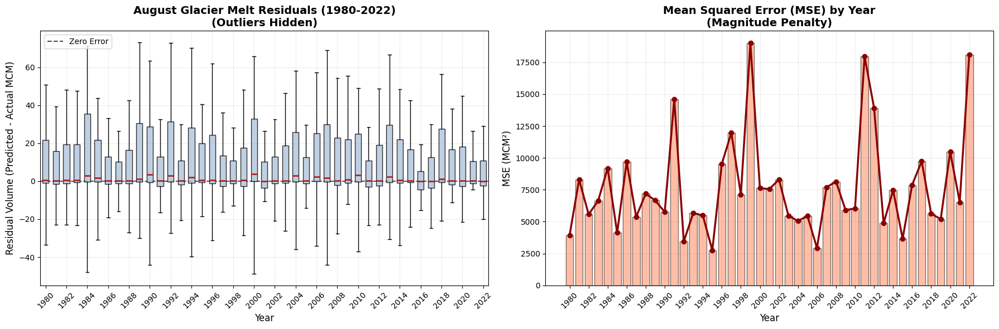

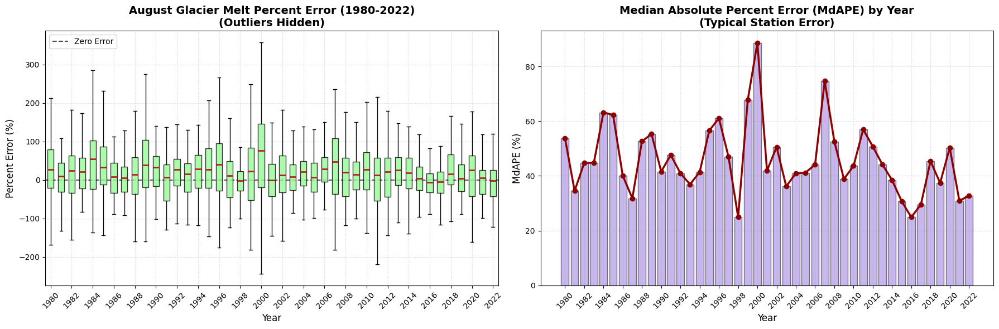

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
from src.config import PROCESSED_DATA_DIR, OUTPUT_DATA_DIR

warnings.filterwarnings('ignore')

# =========================================================
# 1. Setup & Load Data (Full Timeline)
# =========================================================
print("Loading data and calculating ensemble means for 1980-2022...")

df_attr = pd.read_csv(PROCESSED_DATA_DIR / "static_attributes.csv", index_col=0)
df_mb = -pd.read_csv(PROCESSED_DATA_DIR / "glacier_volume_change.csv", index_col=0, parse_dates=True) # Native MCM

# Identify glaciated stations
glaciated_stations = df_attr[df_attr['glacier_pct'] > 0].index

# Load ONE template just to get the columns (stations) available in the predictions
template = pd.read_csv(OUTPUT_DATA_DIR / "phase_split" / "phase-split_preds_member_0.csv", index_col=0, nrows=1)
common_stations = glaciated_stations.intersection(template.columns).intersection(df_mb.columns)

df_mb_full = df_mb[common_stations].copy()
basin_areas = df_attr.loc[common_stations, 'basin_area_km2']

# =========================================================
# 2. Calculate Ensemble Means & Melt Volumes (1980-2022)
# =========================================================
ensemble_dir = OUTPUT_DATA_DIR / "phase_split"
list_pred, list_noglac = [], []

for i in range(10):
    # Load full timeline
    pred = pd.read_csv(ensemble_dir / f"phase-split_preds_member_{i}.csv", index_col=0, parse_dates=True)[common_stations]
    noglac = pd.read_csv(ensemble_dir / f"phase-split_preds_noglacier_member_{i}.csv", index_col=0, parse_dates=True)[common_stations]
    list_pred.append(pred)
    list_noglac.append(noglac)

# Ensemble Mean (mm/day)
df_pred_mean = sum(list_pred) / 10
df_noglac_mean = sum(list_noglac) / 10

# Calculate daily difference (mm/day)
df_diff_mm = df_pred_mean - df_noglac_mean

# Isolate August and calculate monthly sum (mm/month)
df_diff_aug_mm = df_diff_mm[df_diff_mm.index.month == 8].groupby(df_diff_mm[df_diff_mm.index.month == 8].index.year).sum()

# Convert predicted depth to volume (MCM)
df_pred_mcm = df_diff_aug_mm * basin_areas * 0.001

# Extract Actual MCM
df_act_mcm = df_mb_full[df_mb_full.index.month == 8].groupby(df_mb_full[df_mb_full.index.month == 8].index.year).sum()

# Align years strictly to 1980-2022
common_years = df_act_mcm.index.intersection(df_pred_mcm.index)
common_years = common_years[(common_years >= 1980) & (common_years <= 2022)]

df_pred_mcm = df_pred_mcm.loc[common_years]
df_act_mcm = df_act_mcm.loc[common_years]

# =========================================================
# 3. Calculate Errors (Residuals, MSE, Pct Error, MdAPE)
# =========================================================
print("Calculating Yearly Error Metrics...")

years = common_years.tolist()

# --- Absolute Residuals (MCM) ---
df_residual = df_pred_mcm - df_act_mcm
mse_per_year = (df_residual ** 2).mean(axis=1)

# --- Percent Errors (%) ---
# Mask out actual melt values that are too close to zero to prevent infinity/massive spikes
safe_act_mcm = df_act_mcm.copy()
safe_act_mcm[safe_act_mcm < 0.01] = np.nan 

df_pct_error = (df_residual / safe_act_mcm) * 100

# Use Median Absolute Percent Error (MdAPE) because the Mean is too sensitive to outliers
mdape_per_year = df_pct_error.abs().median(axis=1)

# Prepare lists of non-NaN arrays for the boxplots
res_data = [df_residual.loc[y].dropna().values for y in years]
pct_data = [df_pct_error.loc[y].dropna().values for y in years]

# =========================================================
# 4. Plotting Function
# =========================================================
def plot_yearly_metrics(box_data, line_data, years, 
                        box_ylabel, line_ylabel, box_title, line_title, 
                        box_color, line_color, is_percent=False):
    
    fig, axes = plt.subplots(1, 2, figsize=(18, 6))
    
    # --- Boxplot ---
    # showfliers=False removes the outliers from the visualization
    bp = axes[0].boxplot(box_data, positions=years, patch_artist=True, widths=0.6, showfliers=False,
                         boxprops=dict(facecolor=box_color, color='black', alpha=0.8),
                         capprops=dict(color='black'),
                         whiskerprops=dict(color='black'),
                         medianprops=dict(color='firebrick', linewidth=2))

    axes[0].axhline(0, color='black', linestyle='--', linewidth=1.5, alpha=0.7, zorder=0, label='Zero Error')
    axes[0].set_title(box_title, fontsize=14, fontweight='bold')
    axes[0].set_xlabel('Year', fontsize=12)
    axes[0].set_ylabel(box_ylabel, fontsize=12)
    axes[0].set_xticks(years[::2]) # Show every other year to prevent crowding
    axes[0].set_xticklabels(years[::2], rotation=45)
    axes[0].grid(True, linestyle=':', alpha=0.6)
    axes[0].legend(loc='upper left')

    # --- Bar/Line Plot ---
    axes[1].bar(years, line_data.values, color=line_color, alpha=0.5, edgecolor='black', zorder=2)
    axes[1].plot(years, line_data.values, color='darkred', marker='o', linewidth=2.5, markersize=6, zorder=3)
    
    axes[1].set_title(line_title, fontsize=14, fontweight='bold')
    axes[1].set_xlabel('Year', fontsize=12)
    axes[1].set_ylabel(line_ylabel, fontsize=12)
    axes[1].set_xticks(years[::2])
    axes[1].set_xticklabels(years[::2], rotation=45)
    axes[1].grid(True, linestyle=':', alpha=0.6, zorder=0)
    
    plt.tight_layout()
    plt.show()

# =========================================================
# 5. Generate Figures
# =========================================================

# FIGURE 1: Residuals & MSE
plot_yearly_metrics(
    box_data=res_data, line_data=mse_per_year, years=years,
    box_ylabel='Residual Volume (Predicted - Actual MCM)', 
    line_ylabel='MSE (MCM²)',
    box_title='August Glacier Melt Residuals (1980-2022)\n(Outliers Hidden)', 
    line_title='Mean Squared Error (MSE) by Year\n(Magnitude Penalty)',
    box_color='lightsteelblue', line_color='coral'
)

# FIGURE 2: Percent Error & Absolute Percent Error (MdAPE)
plot_yearly_metrics(
    box_data=pct_data, line_data=mdape_per_year, years=years,
    box_ylabel='Percent Error (%)', 
    line_ylabel='MdAPE (%)',
    box_title='August Glacier Melt Percent Error (1980-2022)\n(Outliers Hidden)', 
    line_title='Median Absolute Percent Error (MdAPE) by Year\n(Typical Station Error)',
    box_color='palegreen', line_color='mediumpurple', is_percent=True
)

Interestingly, we have the most error centered around 2000. Would've expected 2000 to be lower. I expect this is probably pretty dependent on seasonality and also how much the glacier area actually changed. Will want to work with a dataset of the actual ice change to see

Loading data for Station 05DA009...
Calculating ensemble predictions and uncertainties...
Generating plots...


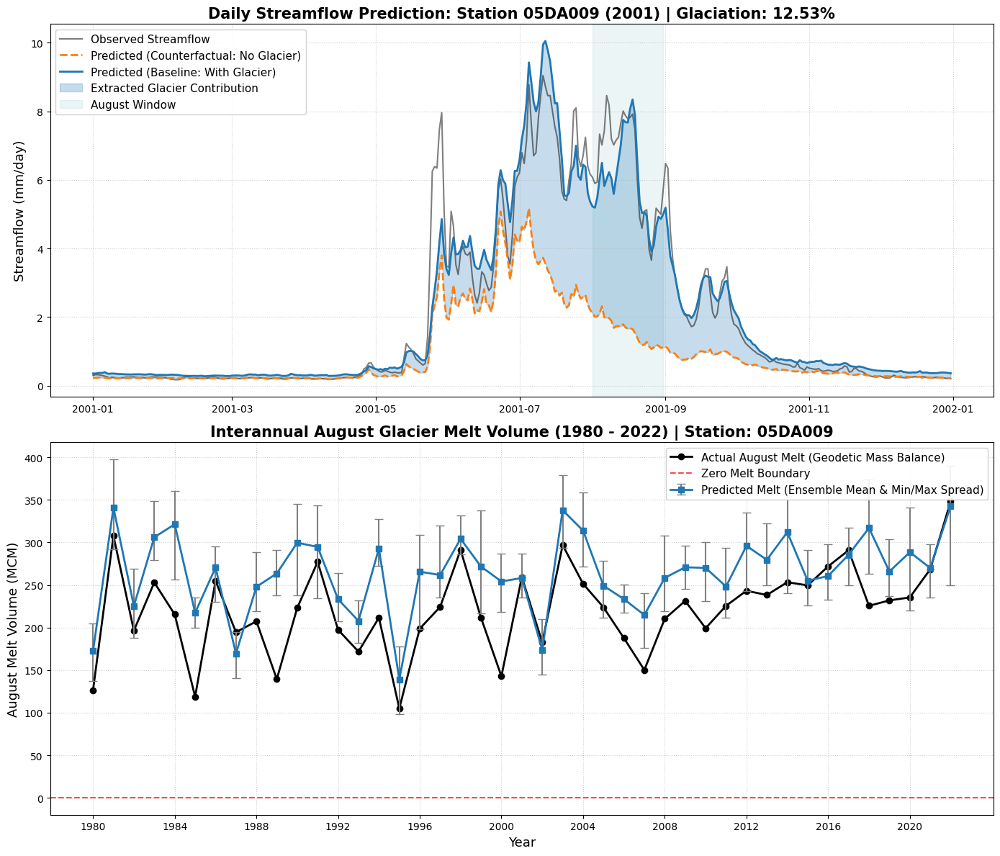

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
from pathlib import Path
from src.config import PROCESSED_DATA_DIR, OUTPUT_DATA_DIR

warnings.filterwarnings('ignore')

# =========================================================
# 1. USER INPUTS
# =========================================================
TARGET_STATION = '05DA009'  # Change to explore different stations
TARGET_YEAR = 2001          # Change to explore different years

# =========================================================
# 2. Load Static Data and Observations
# =========================================================
print(f"Loading data for Station {TARGET_STATION}...")

df_attr = pd.read_csv(PROCESSED_DATA_DIR / "static_attributes.csv", index_col=0)
df_mb = -pd.read_csv(PROCESSED_DATA_DIR / "glacier_volume_change.csv", index_col=0, parse_dates=True) 
df_obs = pd.read_csv(PROCESSED_DATA_DIR / "combined_streamflow.csv", index_col='Date', parse_dates=True)

basin_area = df_attr.loc[TARGET_STATION, 'basin_area_km2']
glac_pct = df_attr.loc[TARGET_STATION, 'glacier_pct']

# Convert observation to mm/day
obs_series = df_obs[TARGET_STATION] * (86.4 / basin_area)

# Extract Actual August MCM for all years (1980-2022)
act_aug_mcm = df_mb[TARGET_STATION][df_mb.index.month == 8].groupby(df_mb[df_mb.index.month == 8].index.year).sum()

# =========================================================
# 3. Process Ensemble Predictions (Phase-Split Model)
# =========================================================
print("Calculating ensemble predictions and uncertainties...")
ensemble_dir = OUTPUT_DATA_DIR / "phase_split"

list_pred_series = []
list_noglac_series = []
list_aug_mcm_yearly = []

for i in range(10):
    # Load specific ensemble members and immediately subset to target station to save RAM
    pred = pd.read_csv(ensemble_dir / f"phase-split_preds_member_{i}.csv", index_col=0, parse_dates=True)[TARGET_STATION]
    noglac = pd.read_csv(ensemble_dir / f"phase-split_preds_noglacier_member_{i}.csv", index_col=0, parse_dates=True)[TARGET_STATION]
    
    list_pred_series.append(pred)
    list_noglac_series.append(noglac)
    
    # Calculate yearly August MCM for THIS specific ensemble member
    diff_mm = pred - noglac
    aug_diff_mm = diff_mm[diff_mm.index.month == 8].groupby(diff_mm[diff_mm.index.month == 8].index.year).sum()
    aug_mcm = aug_diff_mm * basin_area * 0.001
    list_aug_mcm_yearly.append(aug_mcm)

# Aggregate daily streamflow across the ensemble (For Plot 1)
df_pred_daily = pd.concat(list_pred_series, axis=1)
df_noglac_daily = pd.concat(list_noglac_series, axis=1)

mean_pred_daily = df_pred_daily.mean(axis=1)
mean_noglac_daily = df_noglac_daily.mean(axis=1)

# Aggregate yearly August melt across the ensemble (For Plot 2)
df_aug_yearly = pd.concat(list_aug_mcm_yearly, axis=1)

# Ensure years align with actual mass balance
common_years = df_aug_yearly.index.intersection(act_aug_mcm.index)
df_aug_yearly = df_aug_yearly.loc[common_years]
act_aug_mcm = act_aug_mcm.loc[common_years]

# Calculate Mean and Error Bounds
mean_aug_mcm = df_aug_yearly.mean(axis=1)
min_aug_mcm = df_aug_yearly.min(axis=1)
max_aug_mcm = df_aug_yearly.max(axis=1)

# Calculate asymmetric error bars for matplotlib (requires [lower_errors, upper_errors])
err_lower = mean_aug_mcm - min_aug_mcm
err_upper = max_aug_mcm - mean_aug_mcm
yerr = [err_lower.values, err_upper.values]

# =========================================================
# 4. Plotting
# =========================================================
print("Generating plots...")
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 12), gridspec_kw={'height_ratios': [1, 1]})

# ---------------------------------------------------------
# PANEL 1: Daily Hydrograph with Shaded Glacier Contribution
# ---------------------------------------------------------
year_mask = mean_pred_daily.index.year == TARGET_YEAR
dates_yr = mean_pred_daily[year_mask].index

pred_yr = mean_pred_daily[year_mask]
noglac_yr = mean_noglac_daily[year_mask]
obs_yr = obs_series[year_mask]

ax1.plot(dates_yr, obs_yr, color='black', alpha=0.5, label='Observed Streamflow', linewidth=1.5)
ax1.plot(dates_yr, noglac_yr, color='tab:orange', linestyle='--', label='Predicted (Counterfactual: No Glacier)', linewidth=2)
ax1.plot(dates_yr, pred_yr, color='tab:blue', label='Predicted (Baseline: With Glacier)', linewidth=2)

# Shade the area ONLY where With Glacier > Without Glacier
ax1.fill_between(dates_yr, noglac_yr, pred_yr, where=(pred_yr > noglac_yr), 
                 interpolate=True, color='tab:blue', alpha=0.25, label='Extracted Glacier Contribution')

# Highlight August Window
aug_start = pd.to_datetime(f"{TARGET_YEAR}-08-01")
aug_end = pd.to_datetime(f"{TARGET_YEAR}-08-31")
ax1.axvspan(aug_start, aug_end, color='teal', alpha=0.08, label='August Window')

ax1.set_title(f"Daily Streamflow Prediction: Station {TARGET_STATION} ({TARGET_YEAR}) | Glaciation: {glac_pct:.2f}%", fontsize=15, fontweight='bold')
ax1.set_ylabel("Streamflow (mm/day)", fontsize=13)
ax1.grid(True, linestyle=':', alpha=0.6)
ax1.legend(loc='upper left', fontsize=11, framealpha=0.9)

# ---------------------------------------------------------
# PANEL 2: Interannual August Melt Time Series w/ Error Bars
# ---------------------------------------------------------
years = common_years.values

# Plot the Actual Mass Balance (Ground Truth)
ax2.plot(years, act_aug_mcm.values, color='black', marker='o', linestyle='-', linewidth=2, markersize=6, label='Actual August Melt (Geodetic Mass Balance)')

# Plot the Predicted Mean with Ensemble Error Bars
ax2.errorbar(years, mean_aug_mcm.values, yerr=yerr, fmt='s-', color='tab:blue', linewidth=2, capsize=4, 
             ecolor='gray', elinewidth=1.5, markersize=6, label='Predicted Melt (Ensemble Mean & Min/Max Spread)')

ax2.axhline(0, color='red', linestyle='--', alpha=0.7, label='Zero Melt Boundary')

ax2.set_title(f"Interannual August Glacier Melt Volume (1980 - 2022) | Station: {TARGET_STATION}", fontsize=15, fontweight='bold')
ax2.set_ylabel("August Melt Volume (MCM)", fontsize=13)
ax2.set_xlabel("Year", fontsize=13)
ax2.grid(True, linestyle=':', alpha=0.6)
ax2.legend(loc='upper right', fontsize=11, framealpha=0.9)

# Fix x-axis ticks to show round years cleanly
ax2.set_xticks(np.arange(min(years), max(years)+1, 4))

plt.tight_layout()
plt.show()

Loading static attributes, metadata, and valid stations...
Calculating ensemble predictions...
Calculating spatial performance metrics per station...
Aggregating total regional mass balance...
Generating Spatial Plot...


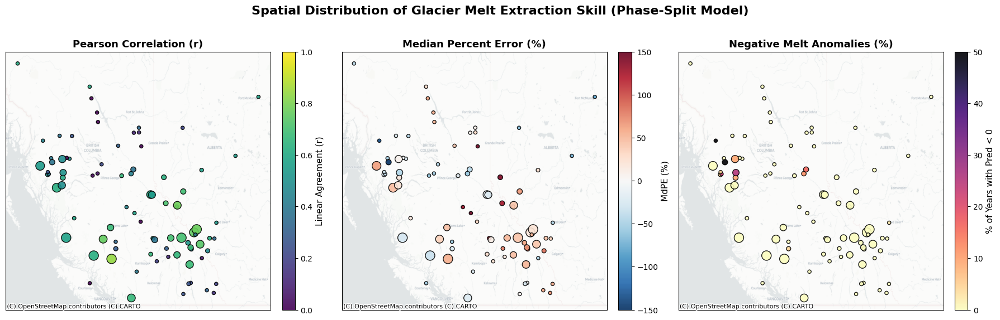

Generating Regional Time Series Plot...


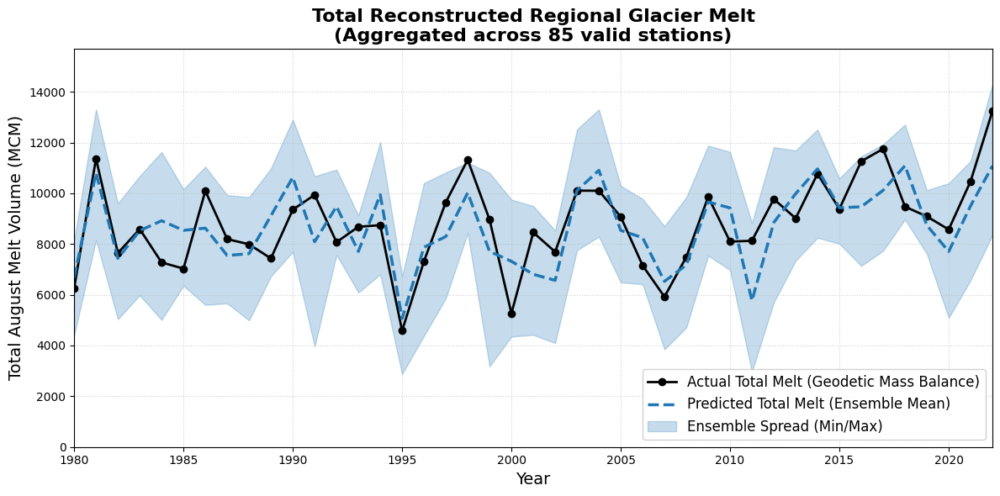

In [12]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import geopandas as gpd
import contextily as cx
import warnings
from pathlib import Path

# Added RAW_DATA_DIR to the import
from src.config import PROCESSED_DATA_DIR, OUTPUT_DATA_DIR, RAW_DATA_DIR

warnings.filterwarnings('ignore')

# =========================================================
# 1. Setup and Load Data
# =========================================================
print("Loading static attributes, metadata, and valid stations...")

# Load valid glaciated stations
with open(PROCESSED_DATA_DIR / "valid_glaciated_stations.txt", "r") as f:
    valid_stations = [line.strip() for line in f.readlines()]

df_attr = pd.read_csv(PROCESSED_DATA_DIR / "static_attributes.csv", index_col=0)
df_mb = -pd.read_csv(PROCESSED_DATA_DIR / "glacier_volume_change.csv", index_col=0, parse_dates=True) 

# Load Geographic Metadata (assuming station ID is the index)
df_meta = pd.read_csv(RAW_DATA_DIR / "station_metadata.csv", index_col=0)

common_stations = df_attr.index.intersection(df_mb.columns).intersection(valid_stations)

df_mb_full = df_mb[common_stations].copy()
basin_areas = df_attr.loc[common_stations, 'basin_area_km2']

# Extract Actual August MCM for the 1980-2022 period
df_act_mcm = df_mb_full[df_mb_full.index.month == 8].groupby(df_mb_full[df_mb_full.index.month == 8].index.year).sum()
df_act_mcm = df_act_mcm[(df_act_mcm.index >= 1980) & (df_act_mcm.index <= 2022)]

# =========================================================
# 2. Extract Ensemble Predictions
# =========================================================
print("Calculating ensemble predictions...")
ensemble_dir = OUTPUT_DATA_DIR / "phase_split"

# Store the yearly August MCM predictions for each ensemble member
ens_pred_mcm_list = []

for i in range(10):
    pred = pd.read_csv(ensemble_dir / f"phase-split_preds_member_{i}.csv", index_col=0, parse_dates=True)[common_stations]
    noglac = pd.read_csv(ensemble_dir / f"phase-split_preds_noglacier_member_{i}.csv", index_col=0, parse_dates=True)[common_stations]
    
    diff_mm = pred - noglac
    diff_aug_mm = diff_mm[diff_mm.index.month == 8].groupby(diff_mm[diff_mm.index.month == 8].index.year).sum()
    
    pred_mcm = diff_aug_mm * basin_areas * 0.001
    pred_mcm = pred_mcm[(pred_mcm.index >= 1980) & (pred_mcm.index <= 2022)]
    ens_pred_mcm_list.append(pred_mcm)

# Calculate the Ensemble Mean Prediction for the Spatial Plots
df_pred_mean_mcm = sum(ens_pred_mcm_list) / 10

# Create a mask so we only evaluate predictions where we have actual ground truth
valid_mask = df_act_mcm.notna()
df_pred_mean_mcm = df_pred_mean_mcm.where(valid_mask)

# =========================================================
# 3. Calculate Spatial Metrics per Station
# =========================================================
print("Calculating spatial performance metrics per station...")

spatial_metrics = []

for stat in common_stations:
    act = df_act_mcm[stat].dropna().values
    pred = df_pred_mean_mcm[stat].dropna().values
    
    if len(act) > 2:
        # Correlation
        r, _ = stats.pearsonr(act, pred)
        
        # Median Percent Error (MdPE)
        safe_mask = act > 0.01
        if np.sum(safe_mask) > 0:
            pct_errs = ((pred[safe_mask] - act[safe_mask]) / act[safe_mask]) * 100
            mdpe = np.median(pct_errs)
        else:
            mdpe = np.nan
            
        # Percentage of Negative Melt Predictions
        pct_neg = (np.sum(pred < 0) / len(pred)) * 100
        
        spatial_metrics.append({
            'Station': stat,
            'Lon': df_meta.loc[stat, 'Longitude'],  
            'Lat': df_meta.loc[stat, 'Latitude'],   
            'Glac_Pct': df_attr.loc[stat, 'glacier_pct'],
            'Pearson_r': r,
            'MdPE': mdpe,
            'Pct_Negative': pct_neg
        })

df_spatial = pd.DataFrame(spatial_metrics).dropna(subset=['Pearson_r'])

# Convert to GeoDataFrame
gdf_spatial = gpd.GeoDataFrame(
    df_spatial, 
    geometry=gpd.points_from_xy(df_spatial['Lon'], df_spatial['Lat']),
    crs="EPSG:4326" # Standard Lat/Lon coordinates
)

# Project to Web Mercator (Required for contextily basemaps)
gdf_spatial = gdf_spatial.to_crs(epsg=3857)

# =========================================================
# 4. Calculate Total Regional Time Series
# =========================================================
print("Aggregating total regional mass balance...")

# Sum the actual melt across all valid stations for each year
total_act_mcm_yearly = df_act_mcm.sum(axis=1)

# Sum the predicted melt across all valid stations for EACH ensemble member
total_pred_mcm_yearly_members = []
for ens_df in ens_pred_mcm_list:
    ens_df_masked = ens_df.where(valid_mask)
    total_pred_mcm_yearly_members.append(ens_df_masked.sum(axis=1))

df_total_preds = pd.concat(total_pred_mcm_yearly_members, axis=1)

# Calculate mean, min, and max for the error bars
total_mean_pred = df_total_preds.mean(axis=1)
total_min_pred = df_total_preds.min(axis=1)
total_max_pred = df_total_preds.max(axis=1)

# =========================================================
# 5. Plotting: Spatial Distribution with Maps
# =========================================================
print("Generating Spatial Plot...")
fig1, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 5.5))
fig1.suptitle('Spatial Distribution of Glacier Melt Extraction Skill (Phase-Split Model)', fontsize=16, fontweight='bold', y=1.02)

# Scatter properties using the projected Web Mercator coordinates
x, y = gdf_spatial.geometry.x, gdf_spatial.geometry.y
sz = np.clip(gdf_spatial['Glac_Pct'] * 15, 20, 150) # Scale dot size by glaciation

# Choose a map style (CartoDB.Positron is clean and grey; OpenTopoMap shows mountains)
map_provider = cx.providers.CartoDB.Positron 

# Plot 1: Pearson Correlation
sc1 = ax1.scatter(x, y, c=gdf_spatial['Pearson_r'], cmap='viridis', s=sz, edgecolor='k', alpha=0.9, vmin=0, vmax=1)
ax1.set_title('Pearson Correlation (r)', fontsize=13, fontweight='bold')
plt.colorbar(sc1, ax=ax1, fraction=0.046, pad=0.04).set_label('Linear Agreement (r)', fontsize=11)
cx.add_basemap(ax1, source=map_provider, alpha=0.7)

# Plot 2: Median Percent Error (MdPE)
v_max = max(abs(gdf_spatial['MdPE'].min()), abs(gdf_spatial['MdPE'].max()))
v_max = np.clip(v_max, 0, 150) 
sc2 = ax2.scatter(x, y, c=gdf_spatial['MdPE'], cmap='RdBu_r', s=sz, edgecolor='k', alpha=0.9, vmin=-v_max, vmax=v_max)
ax2.set_title('Median Percent Error (%)', fontsize=13, fontweight='bold')
plt.colorbar(sc2, ax=ax2, fraction=0.046, pad=0.04).set_label('MdPE (%)', fontsize=11)
cx.add_basemap(ax2, source=map_provider, alpha=0.7)

# Plot 3: Percentage of Negative Melt
sc3 = ax3.scatter(x, y, c=gdf_spatial['Pct_Negative'], cmap='magma_r', s=sz, edgecolor='k', alpha=0.9, vmin=0, vmax=50)
ax3.set_title('Negative Melt Anomalies (%)', fontsize=13, fontweight='bold')
plt.colorbar(sc3, ax=ax3, fraction=0.046, pad=0.04).set_label('% of Years with Pred < 0', fontsize=11)
cx.add_basemap(ax3, source=map_provider, alpha=0.7)

# Clean up axes since Web Mercator coordinate labels are large and unhelpful visually
for ax in [ax1, ax2, ax3]:
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

# =========================================================
# 6. Plotting: Regional Time Series
# =========================================================
print("Generating Regional Time Series Plot...")
fig2, ax = plt.subplots(figsize=(12, 6))

years = total_act_mcm_yearly.index

# Plot Actual Sum
ax.plot(years, total_act_mcm_yearly.values, color='black', marker='o', linestyle='-', linewidth=2, 
        markersize=6, label='Actual Total Melt (Geodetic Mass Balance)')

# Plot Predicted Sum Line
ax.plot(years, total_mean_pred.values, color='tab:blue', linestyle='--', linewidth=2.5, 
        label='Predicted Total Melt (Ensemble Mean)')

# Shaded Error Region for Ensemble Spread
ax.fill_between(years, total_min_pred.values, total_max_pred.values, color='tab:blue', alpha=0.25, 
                label='Ensemble Spread (Min/Max)')

# Formatting
ax.set_title(f'Total Reconstructed Regional Glacier Melt\n(Aggregated across {len(common_stations)} valid stations)', fontsize=16, fontweight='bold')
ax.set_ylabel('Total August Melt Volume (MCM)', fontsize=14)
ax.set_xlabel('Year', fontsize=14)
ax.grid(True, linestyle=':', alpha=0.6)
ax.legend(loc='lower right', fontsize=12, framealpha=0.9)
ax.set_xlim(years.min(), years.max())
ax.set_ylim(0, max(total_act_mcm_yearly.max(), total_max_pred.max()) * 1.1)

ax.set_xticks(np.arange(min(years), max(years)+1, 5))

plt.tight_layout()
plt.show()

Loading data and calculating metrics...
Generating Plots...


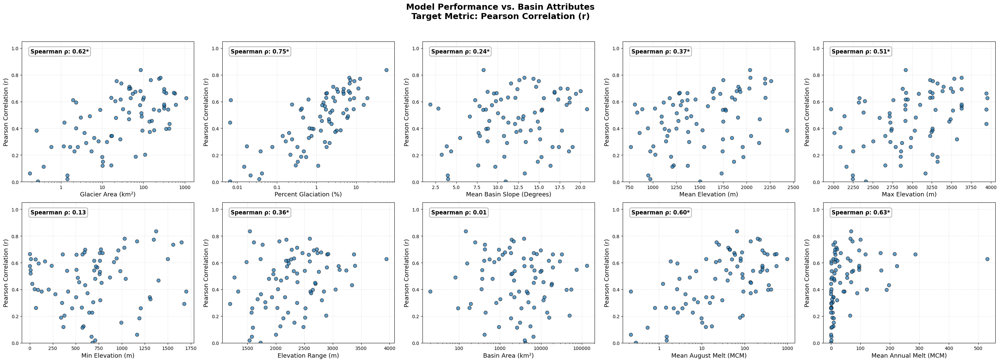

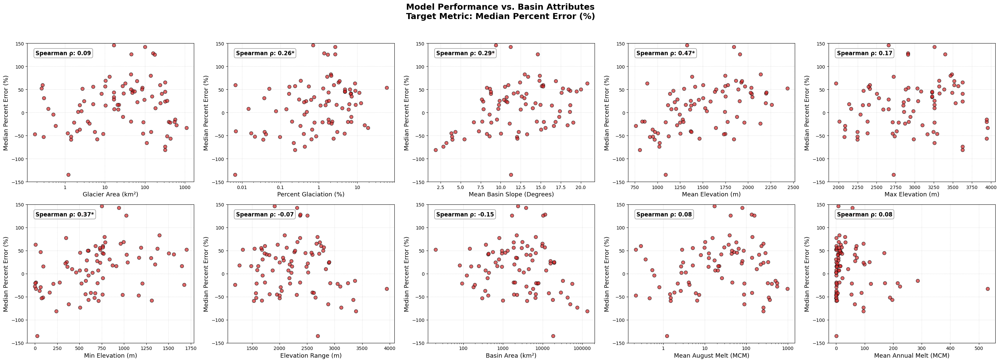

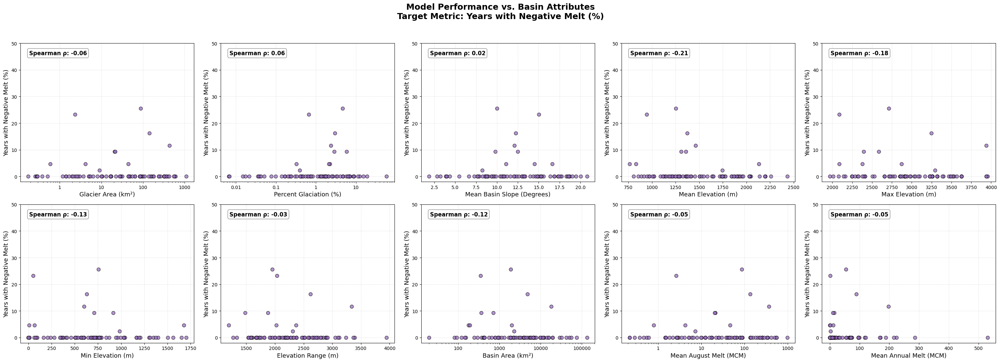

In [4]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import warnings
from pathlib import Path

from src.config import PROCESSED_DATA_DIR, OUTPUT_DATA_DIR

warnings.filterwarnings('ignore')

# =========================================================
# 1. Setup, Load Data, and Calculate Metrics
# =========================================================
print("Loading data and calculating metrics...")

# Load valid stations and attributes
with open(PROCESSED_DATA_DIR / "valid_glaciated_stations.txt", "r") as f:
    valid_stations = [line.strip() for line in f.readlines()]

df_attr = pd.read_csv(PROCESSED_DATA_DIR / "static_attributes.csv", index_col=0)
df_mb = -pd.read_csv(PROCESSED_DATA_DIR / "glacier_volume_change.csv", index_col=0, parse_dates=True) 

common_stations = df_attr.index.intersection(df_mb.columns).intersection(valid_stations)

df_mb_full = df_mb[common_stations].copy()
basin_areas = df_attr.loc[common_stations, 'basin_area_km2']

# Extract Actual August MCM (1980-2022)
df_act_mcm = df_mb_full[df_mb_full.index.month == 8].groupby(df_mb_full[df_mb_full.index.month == 8].index.year).sum()
df_act_mcm = df_act_mcm[(df_act_mcm.index >= 1980) & (df_act_mcm.index <= 2022)]

# Extract Actual Annual Mass Balance MCM (1980-2022) <-- NEW
df_ann_mcm = df_mb_full.groupby(df_mb_full.index.year).sum()
df_ann_mcm = df_ann_mcm[(df_ann_mcm.index >= 1980) & (df_ann_mcm.index <= 2022)]

# Extract Ensemble Predictions
ensemble_dir = OUTPUT_DATA_DIR / "phase_split"
ens_pred_mcm_list = []

for i in range(10):
    pred = pd.read_csv(ensemble_dir / f"phase-split_preds_member_{i}.csv", index_col=0, parse_dates=True)[common_stations]
    noglac = pd.read_csv(ensemble_dir / f"phase-split_preds_noglacier_member_{i}.csv", index_col=0, parse_dates=True)[common_stations]
    
    diff_mm = pred - noglac
    diff_aug_mm = diff_mm[diff_mm.index.month == 8].groupby(diff_mm[diff_mm.index.month == 8].index.year).sum()
    
    pred_mcm = diff_aug_mm * basin_areas * 0.001
    pred_mcm = pred_mcm[(pred_mcm.index >= 1980) & (pred_mcm.index <= 2022)]
    ens_pred_mcm_list.append(pred_mcm)

df_pred_mean_mcm = sum(ens_pred_mcm_list) / 10
valid_mask = df_act_mcm.notna()
df_pred_mean_mcm = df_pred_mean_mcm.where(valid_mask)

# Calculate Station Metrics
metrics = []
for stat in common_stations:
    act = df_act_mcm[stat].dropna().values
    pred = df_pred_mean_mcm[stat].dropna().values
    
    # Calculate the mean ground truth volumes for this station <-- NEW
    mean_aug_mcm = df_act_mcm[stat].mean()
    mean_ann_mcm = df_ann_mcm[stat].mean()
    
    if len(act) > 2:
        r, _ = stats.pearsonr(act, pred)
        safe_mask = act > 0.01
        mdpe = np.median(((pred[safe_mask] - act[safe_mask]) / act[safe_mask]) * 100) if np.sum(safe_mask) > 0 else np.nan
        pct_neg = (np.sum(pred < 0) / len(pred)) * 100
        
        metrics.append({
            'Station': stat,
            'Pearson_r': r,
            'MdPE': mdpe,
            'Pct_Negative': pct_neg,
            'glacier_area_km2': df_attr.loc[stat, 'glacier_area_km2'],
            'glacier_pct': df_attr.loc[stat, 'glacier_pct'],
            'mean_slope': df_attr.loc[stat, 'mean_slope'],
            'mean_elev': df_attr.loc[stat, 'mean_elev'],
            'max_elev': df_attr.loc[stat, 'max_elev'],
            'min_elev': df_attr.loc[stat, 'min_elev'],
            'elev_range': df_attr.loc[stat, 'elev_range'],
            'basin_area_km2': df_attr.loc[stat, 'basin_area_km2'],
            'mean_aug_mcm': mean_aug_mcm,    # <-- NEW
            'mean_ann_mcm': mean_ann_mcm     # <-- NEW
        })

df_plot = pd.DataFrame(metrics).dropna(subset=['Pearson_r', 'MdPE'])

# =========================================================
# 2. Plotting Configuration
# =========================================================
print("Generating Plots...")

# Define the 10 attributes we want to plot against
attributes = [
    ('glacier_area_km2', 'Glacier Area (km²)', True),    
    ('glacier_pct', 'Percent Glaciation (%)', True),
    ('mean_slope', 'Mean Basin Slope (Degrees)', False),
    ('mean_elev', 'Mean Elevation (m)', False),
    ('max_elev', 'Max Elevation (m)', False),            
    ('min_elev', 'Min Elevation (m)', False),            
    ('elev_range', 'Elevation Range (m)', False),
    ('basin_area_km2', 'Basin Area (km²)', True),
    ('mean_aug_mcm', 'Mean August Melt (MCM)', True),    # <-- NEW
    ('mean_ann_mcm', 'Mean Annual Melt (MCM)', False)    # <-- NEW
]

# Define the 3 metrics we are evaluating
target_metrics = [
    ('Pearson_r', 'Pearson Correlation (r)', 'Linear Agreement (Higher is Better)', 'tab:blue', (0, 1.05)),
    ('MdPE', 'Median Percent Error (%)', 'Volume Error (Closer to 0 is Better)', 'tab:red', (-150, 150)),
    ('Pct_Negative', 'Years with Negative Melt (%)', 'Physical Plausibility (Lower is Better)', 'tab:purple', (-2, 50))
]

# =========================================================
# 3. Generate 3 Separate Figures
# =========================================================
for metric_col, metric_title, metric_desc, color, ylims in target_metrics:
    # Expanded grid to 2x5 and widened the figure to 30 inches to fit the new plots
    fig, axes = plt.subplots(2, 5, figsize=(30, 11))
    fig.suptitle(f'Model Performance vs. Basin Attributes\nTarget Metric: {metric_title}', fontsize=18, fontweight='bold', y=0.98)
    
    axes = axes.flatten()
    
    for ax, (attr_col, attr_name, use_log) in zip(axes, attributes):
        x = df_plot[attr_col]
        y = df_plot[metric_col]
        
        # Scatter Plot
        ax.scatter(x, y, color=color, alpha=0.7, edgecolor='k', s=55)
        
        # Calculate Spearman correlation to see if the attribute DRIVES the error
        rho, p_val = stats.spearmanr(x, y)
        sig_flag = "*" if p_val < 0.05 else "" 
        
        # Formatting
        ax.set_xlabel(attr_name, fontsize=13)
        ax.set_ylabel(metric_title, fontsize=13)
        ax.set_ylim(ylims)
        ax.grid(True, linestyle=':', alpha=0.6)
        
        if use_log:
            ax.set_xscale('log')
            import matplotlib.ticker as ticker
            ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda val, pos: f"{val:g}"))
            
        # Add correlation text box
        text_str = f"Spearman ρ: {rho:.2f}{sig_flag}"
        props = dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='gray')
        ax.text(0.05, 0.95, text_str, transform=ax.transAxes, fontsize=12, 
                verticalalignment='top', bbox=props, fontweight='bold')
        
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

Loading ground truth mass balance data...
Aggregating temporal subsets...
Generating plot...


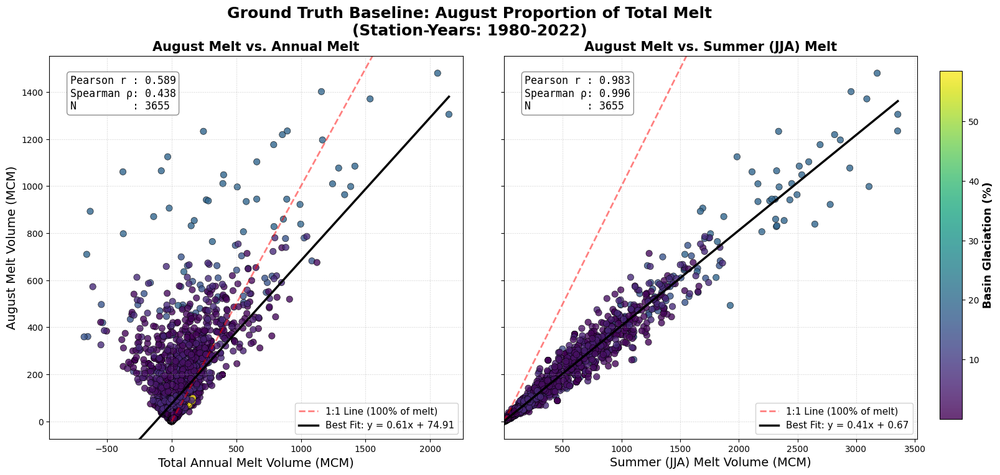

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
import warnings
from src.config import PROCESSED_DATA_DIR

warnings.filterwarnings('ignore')

# =========================================================
# 1. Load Ground Truth Data
# =========================================================
print("Loading ground truth mass balance data...")

# Load valid stations
with open(PROCESSED_DATA_DIR / "valid_glaciated_stations.txt", "r") as f:
    valid_stations = [line.strip() for line in f.readlines()]

df_attr = pd.read_csv(PROCESSED_DATA_DIR / "static_attributes.csv", index_col=0)

# Negative values represent volume loss (melt), so we invert it to treat melt as positive
df_mb = -pd.read_csv(PROCESSED_DATA_DIR / "glacier_volume_change.csv", index_col=0, parse_dates=True)

common_stations = df_attr.index.intersection(df_mb.columns).intersection(valid_stations)
df_mb_full = df_mb[common_stations]
glac_pct = df_attr.loc[common_stations, 'glacier_pct']

# =========================================================
# 2. Extract Temporal Subsets
# =========================================================
print("Aggregating temporal subsets...")

df_aug = df_mb_full[df_mb_full.index.month == 8].groupby(df_mb_full[df_mb_full.index.month == 8].index.year).sum()
df_jja = df_mb_full[df_mb_full.index.month.isin([6, 7, 8])].groupby(df_mb_full[df_mb_full.index.month.isin([6, 7, 8])].index.year).sum()
df_ann = df_mb_full.groupby(df_mb_full.index.year).sum()

# Limit to our study period
df_aug = df_aug[(df_aug.index >= 1980) & (df_aug.index <= 2022)]
df_jja = df_jja[(df_jja.index >= 1980) & (df_jja.index <= 2022)]
df_ann = df_ann[(df_ann.index >= 1980) & (df_ann.index <= 2022)]

# Helper function to align and flatten any two subsets
def align_and_flatten(df_y, df_x):
    y_vals, x_vals, glac_vals = [], [], []
    for stat in common_stations:
        y_stat = df_y[stat].dropna()
        x_stat = df_x[stat].dropna()
        
        common_years = y_stat.index.intersection(x_stat.index)
        
        y_vals.extend(y_stat.loc[common_years].values)
        x_vals.extend(x_stat.loc[common_years].values)
        glac_vals.extend([glac_pct[stat]] * len(common_years))
        
    return np.array(y_vals), np.array(x_vals), np.array(glac_vals)

# Extract for Plot 1 (Y=August, X=Annual)
aug_vals_1, ann_vals, glac_vals_1 = align_and_flatten(df_aug, df_ann)

# Extract for Plot 2 (Y=August, X=JJA)
aug_vals_2, jja_vals, glac_vals_2 = align_and_flatten(df_aug, df_jja)

# =========================================================
# 3. Calculate Correlation Metrics
# =========================================================
# Panel 1 Metrics (August vs Annual)
r_ann, _ = stats.pearsonr(ann_vals, aug_vals_1)
rho_ann, _ = stats.spearmanr(ann_vals, aug_vals_1)
m_ann, b_ann = np.polyfit(ann_vals, aug_vals_1, 1)

# Panel 2 Metrics (August vs JJA)
r_jja, _ = stats.pearsonr(jja_vals, aug_vals_2)
rho_jja, _ = stats.spearmanr(jja_vals, aug_vals_2)
m_jja, b_jja = np.polyfit(jja_vals, aug_vals_2, 1)

# =========================================================
# 4. Plotting
# =========================================================
print("Generating plot...")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8), sharey=True)
fig.suptitle("Ground Truth Baseline: August Proportion of Total Melt\n(Station-Years: 1980-2022)", fontsize=18, fontweight='bold', y=0.98)

# Calculate global Y limits to keep both plots aligned
min_y = min(aug_vals_1.min(), aug_vals_2.min())
max_y = max(aug_vals_1.max(), aug_vals_2.max())

# --- PANEL 1: August vs Annual ---
sc1 = ax1.scatter(ann_vals, aug_vals_1, c=glac_vals_1, cmap='viridis', s=55, alpha=0.8, edgecolor='k', linewidth=0.5)

# 1:1 Line (If August accounted for 100% of the Annual Melt)
max_x_ann = ann_vals.max()
ax1.plot([min_y, max_x_ann], [min_y, max_x_ann], 'r--', alpha=0.5, linewidth=2, label='1:1 Line (100% of melt)')

x_line_ann = np.array([ann_vals.min(), max_x_ann])
ax1.plot(x_line_ann, m_ann*x_line_ann + b_ann, color='black', linewidth=2.5, label=f'Best Fit: y = {m_ann:.2f}x + {b_ann:.2f}')

ax1.set_title("August Melt vs. Annual Melt", fontsize=15, fontweight='bold')
ax1.set_xlabel("Total Annual Melt Volume (MCM)", fontsize=14)
ax1.set_ylabel("August Melt Volume (MCM)", fontsize=14)
ax1.grid(True, linestyle=':', alpha=0.6)
ax1.legend(loc='lower right', fontsize=11, framealpha=0.9)

text_ann = (f"Pearson r : {r_ann:.3f}\n"
            f"Spearman ρ: {rho_ann:.3f}\n"
            f"N         : {len(aug_vals_1)}")
ax1.text(0.05, 0.95, text_ann, transform=ax1.transAxes, fontsize=12, family='monospace',
         verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='gray'))

# --- PANEL 2: August vs JJA ---
sc2 = ax2.scatter(jja_vals, aug_vals_2, c=glac_vals_2, cmap='viridis', s=55, alpha=0.8, edgecolor='k', linewidth=0.5)

# 1:1 Line (If August accounted for 100% of the Summer Melt)
max_x_jja = jja_vals.max()
ax2.plot([min_y, max_x_jja], [min_y, max_x_jja], 'r--', alpha=0.5, linewidth=2, label='1:1 Line (100% of melt)')

x_line_jja = np.array([jja_vals.min(), max_x_jja])
ax2.plot(x_line_jja, m_jja*x_line_jja + b_jja, color='black', linewidth=2.5, label=f'Best Fit: y = {m_jja:.2f}x + {b_jja:.2f}')

ax2.set_title("August Melt vs. Summer (JJA) Melt", fontsize=15, fontweight='bold')
ax2.set_xlabel("Summer (JJA) Melt Volume (MCM)", fontsize=14)
ax2.grid(True, linestyle=':', alpha=0.6)
ax2.legend(loc='lower right', fontsize=11, framealpha=0.9)

text_jja = (f"Pearson r : {r_jja:.3f}\n"
            f"Spearman ρ: {rho_jja:.3f}\n"
            f"N         : {len(aug_vals_2)}")
ax2.text(0.05, 0.95, text_jja, transform=ax2.transAxes, fontsize=12, family='monospace',
         verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='gray'))

# Axis limit cleanups
ax1.set_xlim(ann_vals.min() * 0.9, max_x_ann * 1.05)
ax2.set_xlim(jja_vals.min() * 0.9, max_x_jja * 1.05)
ax1.set_ylim(min_y - (max_y*0.05), max_y * 1.05)

# Shared Colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
cbar = fig.colorbar(sc1, cax=cbar_ax)
cbar.set_label("Basin Glaciation (%)", fontsize=13, fontweight='bold')

plt.subplots_adjust(right=0.9, wspace=0.1)
plt.show()

Loading datasets...
Filtering modeled data for August...
Aligning datasets via relational merge...
Successfully aligned 548,680 valid Glacier-Year pairs.
Generating density plot...


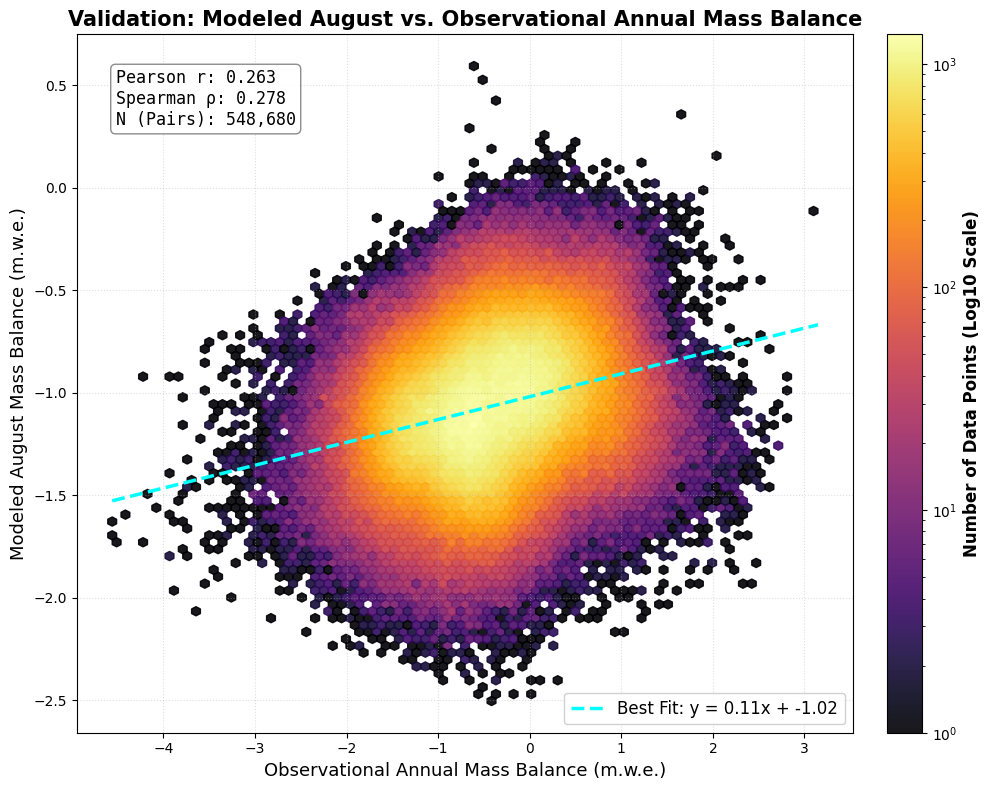

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
import warnings

from src.config import RAW_DATA_DIR 

warnings.filterwarnings('ignore')

# =========================================================
# 1. Setup and Load Data
# =========================================================
print("Loading datasets...")

monthly_path = RAW_DATA_DIR / "mass_balance" / "ts_monthly_const_area_lstm.csv"
yearly_path = RAW_DATA_DIR / "mass_balance" / "WNA_mwe.csv"

# Load data
df_monthly = pd.read_csv(monthly_path, index_col=0)
df_yearly = pd.read_csv(yearly_path, index_col=0)

# =========================================================
# 2. Parse Dates and Filter for August
# =========================================================
print("Filtering modeled data for August...")

df_monthly.columns = pd.to_datetime(df_monthly.columns, errors='coerce')
df_monthly = df_monthly.loc[:, df_monthly.columns.notna()]

df_aug = df_monthly.loc[:, df_monthly.columns.month == 8]
df_aug.columns = df_aug.columns.year.astype(str)

df_yearly.columns = df_yearly.columns.astype(str)

# =========================================================
# 3. Stack and Merge (The Bulletproof Alignment)
# =========================================================
print("Aligning datasets via relational merge...")

df_aug.index.name = 'RGIId'
df_yearly.index.name = 'RGIId'

df_aug_long = df_aug.stack().reset_index()
df_aug_long.columns = ['RGIId', 'Year', 'Aug_MB']

df_yearly_long = df_yearly.stack().reset_index()
df_yearly_long.columns = ['RGIId', 'Year', 'Annual_MB']

df_merged = pd.merge(df_aug_long, df_yearly_long, on=['RGIId', 'Year'], how='inner')
df_merged = df_merged.dropna()
df_merged = df_merged.groupby(['RGIId', 'Year']).mean().reset_index()

print(f"Successfully aligned {len(df_merged):,} valid Glacier-Year pairs.")

aug_clean = df_merged['Aug_MB'].values
year_clean = df_merged['Annual_MB'].values

# =========================================================
# 4. Compute Correlation
# =========================================================
r, _ = stats.pearsonr(year_clean, aug_clean)
rho, _ = stats.spearmanr(year_clean, aug_clean)
m, b = np.polyfit(year_clean, aug_clean, 1)

# =========================================================
# 5. Plotting (Density Hexbin)
# =========================================================
print("Generating density plot...")
fig, ax = plt.subplots(figsize=(10, 8))

# 2D Hexagonal Binning (Log scale for massive datasets)
# gridsize determines the size of the hexagons (higher = smaller hexes)
hb = ax.hexbin(year_clean, aug_clean, gridsize=80, cmap='inferno', mincnt=1, bins='log', alpha=0.9)

# Add a colorbar to explain the density
cb = fig.colorbar(hb, ax=ax, fraction=0.046, pad=0.04)
cb.set_label('Number of Data Points (Log10 Scale)', fontsize=12, fontweight='bold')

# Line of best fit
x_line = np.array([year_clean.min(), year_clean.max()])
ax.plot(x_line, m*x_line + b, color='cyan', linewidth=2.5, linestyle='--', label=f'Best Fit: y = {m:.2f}x + {b:.2f}')

# Formatting
ax.set_title("Validation: Modeled August vs. Observational Annual Mass Balance", fontsize=15, fontweight='bold')
ax.set_xlabel("Observational Annual Mass Balance (m.w.e.)", fontsize=13)
ax.set_ylabel("Modeled August Mass Balance (m.w.e.)", fontsize=13)
ax.grid(True, linestyle=':', alpha=0.4)

# Stats Text Box
text_str = (
    f"Pearson r: {r:.3f}\n"
    f"Spearman ρ: {rho:.3f}\n"
    f"N (Pairs): {len(year_clean):,}"
)
props = dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='gray')
ax.text(0.05, 0.95, text_str, transform=ax.transAxes, fontsize=12, family='monospace',
        verticalalignment='top', bbox=props)

ax.legend(loc='lower right', fontsize=12, framealpha=0.9, facecolor='white')

plt.tight_layout()
plt.show()

Loading datasets...
Aggregating modeled monthly data into Glaciological Years...
Aligning datasets via relational merge and filtering for >= 2000...
Successfully aligned 286,810 valid Glacier-Year pairs (Year >= 2000).
Generating density plot...


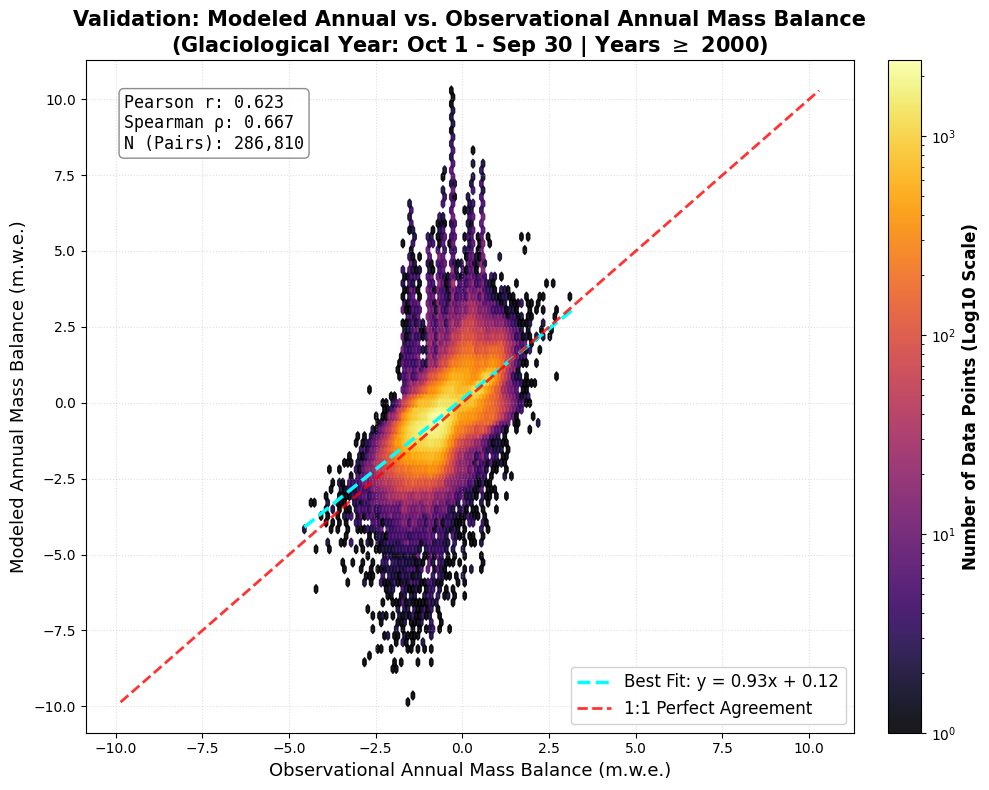

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
import warnings

from src.config import RAW_DATA_DIR 

warnings.filterwarnings('ignore')

# =========================================================
# 1. Setup and Load Data
# =========================================================
print("Loading datasets...")

monthly_path = RAW_DATA_DIR / "mass_balance" / "ts_monthly_const_area_lstm.csv"
yearly_path = RAW_DATA_DIR / "mass_balance" / "WNA_mwe.csv"

# Load data
df_monthly = pd.read_csv(monthly_path, index_col=0)
df_yearly = pd.read_csv(yearly_path, index_col=0)

# =========================================================
# 2. Compute Glaciological Year (Oct 1 - Sep 30)
# =========================================================
print("Aggregating modeled monthly data into Glaciological Years...")

# Convert columns to datetime and drop invalid/metadata columns
dates = pd.to_datetime(df_monthly.columns, errors='coerce')
valid_dates_mask = dates.notna()

df_monthly = df_monthly.loc[:, valid_dates_mask]
valid_dates = dates[valid_dates_mask]

# Define Glaciological Year: If month >= 10, it belongs to NEXT year's sum.
glac_years = valid_dates.year + (valid_dates.month >= 10).astype(int)

# --- EDGE CASE FIX: Filter out incomplete years ---
# Count how many months are assigned to each Glaciological Year
year_month_counts = pd.Series(glac_years).value_counts()

# Identify ONLY the years that have a complete 12-month record
complete_years = year_month_counts[year_month_counts == 12].index

# Group, sum, and then filter to keep only the complete years
df_modeled_annual = df_monthly.groupby(glac_years, axis=1).sum()
df_modeled_annual = df_modeled_annual.loc[:, complete_years]
# --------------------------------------------------

# Ensure columns are strings for safe relational merging
df_modeled_annual.columns = df_modeled_annual.columns.astype(str)
df_yearly.columns = df_yearly.columns.astype(str)

# =========================================================
# 3. Stack, Merge, and Filter (>= 2000)
# =========================================================
print("Aligning datasets via relational merge and filtering for >= 2000...")

df_modeled_annual.index.name = 'RGIId'
df_yearly.index.name = 'RGIId'

df_mod_long = df_modeled_annual.stack().reset_index()
df_mod_long.columns = ['RGIId', 'Year', 'Modeled_Annual_MB']

df_obs_long = df_yearly.stack().reset_index()
df_obs_long.columns = ['RGIId', 'Year', 'Observed_Annual_MB']

# Relational merge ensures strict 1-to-1 matching
df_merged = pd.merge(df_mod_long, df_obs_long, on=['RGIId', 'Year'], how='inner')
df_merged = df_merged.dropna()

# Convert Year to integer and filter
df_merged['Year'] = df_merged['Year'].astype(int)
df_merged = df_merged[df_merged['Year'] >= 2000]

# Safety net for duplicates
df_merged = df_merged.groupby(['RGIId', 'Year']).mean().reset_index()

print(f"Successfully aligned {len(df_merged):,} valid Glacier-Year pairs (Year >= 2000).")

mod_clean = df_merged['Modeled_Annual_MB'].values
obs_clean = df_merged['Observed_Annual_MB'].values

if len(obs_clean) < 2:
    raise ValueError("Not enough overlapping valid data points to calculate correlation.")

# =========================================================
# 4. Compute Correlation
# =========================================================
r, _ = stats.pearsonr(obs_clean, mod_clean)
rho, _ = stats.spearmanr(obs_clean, mod_clean)
m, b = np.polyfit(obs_clean, mod_clean, 1)

# =========================================================
# 5. Plotting (Density Hexbin)
# =========================================================
print("Generating density plot...")
fig, ax = plt.subplots(figsize=(10, 8))

# 2D Hexagonal Binning (Log scale)
hb = ax.hexbin(obs_clean, mod_clean, gridsize=80, cmap='inferno', mincnt=1, bins='log', alpha=0.9)

# Colorbar
cb = fig.colorbar(hb, ax=ax, fraction=0.046, pad=0.04)
cb.set_label('Number of Data Points (Log10 Scale)', fontsize=12, fontweight='bold')

# Line of best fit
x_line = np.array([obs_clean.min(), obs_clean.max()])
ax.plot(x_line, m*x_line + b, color='cyan', linewidth=2.5, linestyle='--', label=f'Best Fit: y = {m:.2f}x + {b:.2f}')

# 1:1 Reference Line 
min_val = min(obs_clean.min(), mod_clean.min())
max_val = max(obs_clean.max(), mod_clean.max())
ax.plot([min_val, max_val], [min_val, max_val], 'r--', alpha=0.8, linewidth=2, label='1:1 Perfect Agreement')

# Formatting
ax.set_title("Validation: Modeled Annual vs. Observational Annual Mass Balance\n(Glaciological Year: Oct 1 - Sep 30 | Years $\geq$ 2000)", fontsize=15, fontweight='bold')
ax.set_xlabel("Observational Annual Mass Balance (m.w.e.)", fontsize=13)
ax.set_ylabel("Modeled Annual Mass Balance (m.w.e.)", fontsize=13)
ax.grid(True, linestyle=':', alpha=0.4)

# Stats Text Box
text_str = (
    f"Pearson r: {r:.3f}\n"
    f"Spearman ρ: {rho:.3f}\n"
    f"N (Pairs): {len(obs_clean):,}"
)
props = dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='gray')
ax.text(0.05, 0.95, text_str, transform=ax.transAxes, fontsize=12, family='monospace',
        verticalalignment='top', bbox=props)

ax.legend(loc='lower right', fontsize=12, framealpha=0.9, facecolor='white')

plt.tight_layout()
plt.show()

Loading datasets...
Aggregating modeled monthly data into Glaciological Years...
Aligning datasets via relational merge and filtering for >= 2000...
Successfully aligned 286,810 valid Glacier-Year pairs (Year >= 2000).
Calculating Mean Squared Error per glacier...
Prepared 12,474 unique glaciers for plotting.
Generating 2D histogram plot...


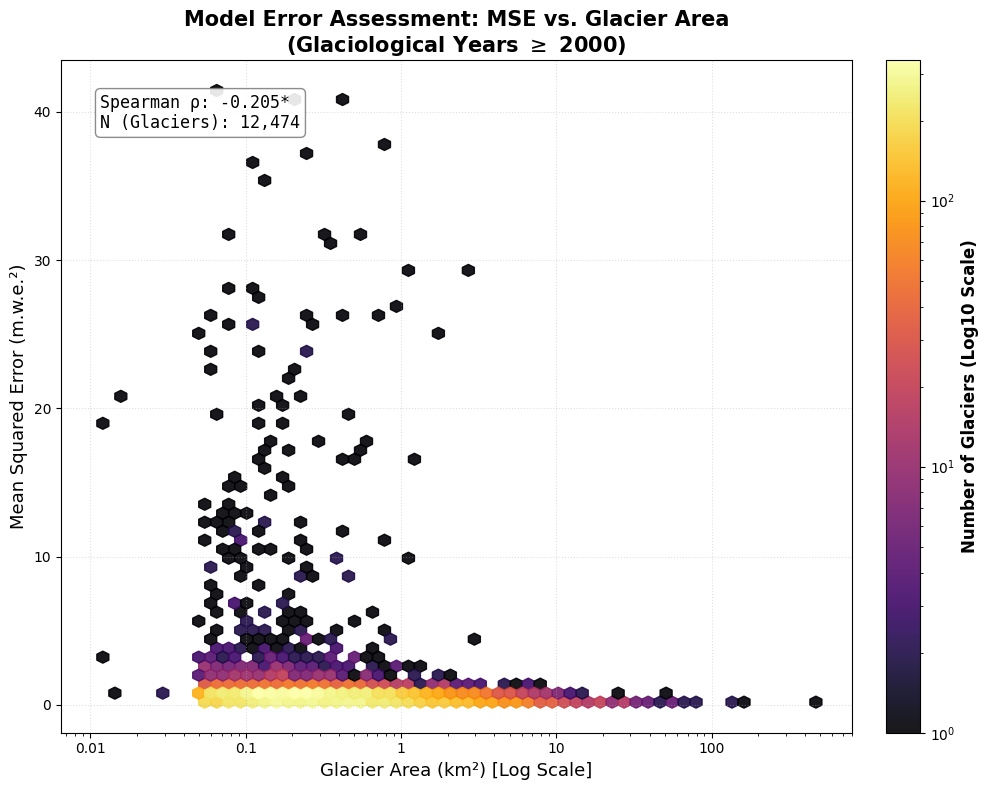

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
import warnings

from src.config import RAW_DATA_DIR 

warnings.filterwarnings('ignore')

# =========================================================
# 1. Setup and Load Data
# =========================================================
print("Loading datasets...")

monthly_path = RAW_DATA_DIR / "mass_balance" / "ts_monthly_const_area_lstm.csv"
yearly_path = RAW_DATA_DIR / "mass_balance" / "WNA_mwe.csv"
meta_path = RAW_DATA_DIR / "mass_balance" / "WNA_metadata.csv"

# Load data
df_monthly = pd.read_csv(monthly_path, index_col=0)
df_yearly = pd.read_csv(yearly_path, index_col=0)
df_meta = pd.read_csv(meta_path, index_col=0)

# =========================================================
# 2. Compute Glaciological Year (Oct 1 - Sep 30)
# =========================================================
print("Aggregating modeled monthly data into Glaciological Years...")

dates = pd.to_datetime(df_monthly.columns, errors='coerce')
valid_dates_mask = dates.notna()

df_monthly = df_monthly.loc[:, valid_dates_mask]
valid_dates = dates[valid_dates_mask]

glac_years = valid_dates.year + (valid_dates.month >= 10).astype(int)

year_month_counts = pd.Series(glac_years).value_counts()
complete_years = year_month_counts[year_month_counts == 12].index

df_modeled_annual = df_monthly.groupby(glac_years, axis=1).sum()
df_modeled_annual = df_modeled_annual.loc[:, complete_years]

df_modeled_annual.columns = df_modeled_annual.columns.astype(str)
df_yearly.columns = df_yearly.columns.astype(str)

# =========================================================
# 3. Stack, Merge, and Filter (>= 2000)
# =========================================================
print("Aligning datasets via relational merge and filtering for >= 2000...")

df_modeled_annual.index.name = 'RGIId'
df_yearly.index.name = 'RGIId'

df_mod_long = df_modeled_annual.stack().reset_index()
df_mod_long.columns = ['RGIId', 'Year', 'Modeled_Annual_MB']

df_obs_long = df_yearly.stack().reset_index()
df_obs_long.columns = ['RGIId', 'Year', 'Observed_Annual_MB']

df_merged = pd.merge(df_mod_long, df_obs_long, on=['RGIId', 'Year'], how='inner')
df_merged = df_merged.dropna()

df_merged['Year'] = df_merged['Year'].astype(int)
df_merged = df_merged[df_merged['Year'] >= 2000]

df_merged = df_merged.groupby(['RGIId', 'Year']).mean().reset_index()

print(f"Successfully aligned {len(df_merged):,} valid Glacier-Year pairs (Year >= 2000).")

# =========================================================
# 4. Calculate MSE per Glacier & Merge with Area
# =========================================================
print("Calculating Mean Squared Error per glacier...")

# Calculate the squared error for each year
df_merged['Squared_Error'] = (df_merged['Modeled_Annual_MB'] - df_merged['Observed_Annual_MB'])**2

# Group by RGIId to get the Mean Squared Error across all years for each glacier
df_mse = df_merged.groupby('RGIId')['Squared_Error'].mean().reset_index()
df_mse.rename(columns={'Squared_Error': 'MSE'}, inplace=True)

# Ensure the metadata index is named for merging
df_meta.index.name = 'RGIId'

# Merge the MSE with the Area from the metadata
df_plot = pd.merge(df_mse, df_meta[['area_km2']], on='RGIId', how='inner')
df_plot = df_plot.dropna(subset=['area_km2', 'MSE'])

print(f"Prepared {len(df_plot):,} unique glaciers for plotting.")

# Calculate correlation (Spearman is best here because Area is highly skewed)
rho, p_val = stats.spearmanr(df_plot['area_km2'], df_plot['MSE'])

# =========================================================
# 5. Plotting (2D Histogram / Hexbin)
# =========================================================
print("Generating 2D histogram plot...")
fig, ax = plt.subplots(figsize=(10, 8))

x = df_plot['area_km2']
y = df_plot['MSE']

# 2D Hexagonal Binning (Log scale for X-axis because of area distribution)
hb = ax.hexbin(x, y, gridsize=60, cmap='inferno', mincnt=1, xscale='log', bins='log', alpha=0.9)

# Colorbar
cb = fig.colorbar(hb, ax=ax, fraction=0.046, pad=0.04)
cb.set_label('Number of Glaciers (Log10 Scale)', fontsize=12, fontweight='bold')

# Formatting
ax.set_title("Model Error Assessment: MSE vs. Glacier Area\n(Glaciological Years $\geq$ 2000)", fontsize=15, fontweight='bold')
ax.set_xlabel("Glacier Area (km²) [Log Scale]", fontsize=13)
ax.set_ylabel("Mean Squared Error (m.w.e.²)", fontsize=13)
ax.grid(True, linestyle=':', alpha=0.4)

# Ensure x-axis ticks show up nicely as plain numbers rather than scientific notation
import matplotlib.ticker as ticker
ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda val, pos: f"{val:g}"))

# Stats Text Box
sig_flag = "*" if p_val < 0.05 else ""
text_str = (
    f"Spearman ρ: {rho:.3f}{sig_flag}\n"
    f"N (Glaciers): {len(df_plot):,}"
)
props = dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='gray')
ax.text(0.05, 0.95, text_str, transform=ax.transAxes, fontsize=12, family='monospace',
        verticalalignment='top', bbox=props)

plt.tight_layout()
plt.show()

Loading mass balance datasets...
Aggregating glacier data to basin-level averages...
Converting monthly data to Glaciological Years...
Aligning datasets via relational merge...
Successfully aligned 17,158 valid Basin-Year pairs.
Generating side-by-side density plots...


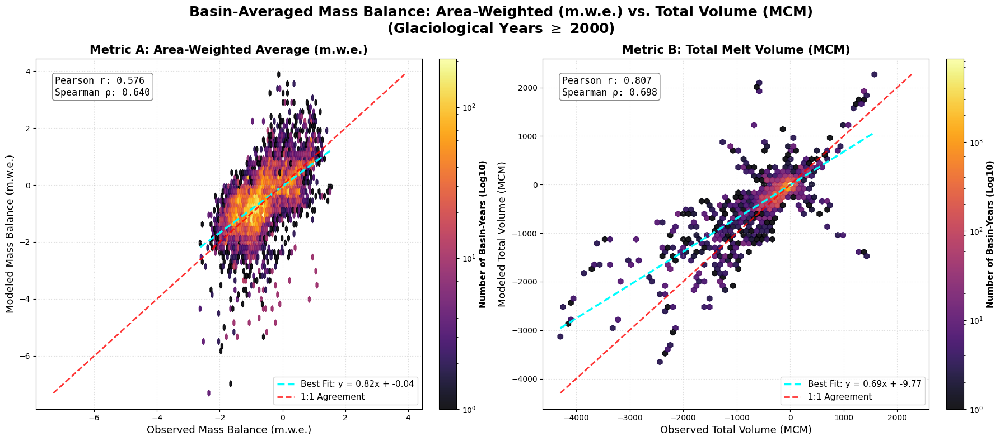

In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
import geopandas as gpd
import warnings

from src.config import (
    RAW_DATA_DIR, 
    PROCESSED_DATA_DIR,
    DRAINAGE_FILES, 
    GLACIER_SHP_PATH
)

warnings.filterwarnings('ignore')

CANADA_ALBERS_CRS = "+proj=aea +lat_1=50 +lat_2=70 +lat_0=40 +lon_0=-96 +x_0=0 +y_0=0 +datum=NAD83 +units=m +no_defs"

# =========================================================
# 1. Spatial Mapping (The 5-Second Centroid Hack)
# =========================================================
def get_or_create_area_matrix():
    matrix_path = PROCESSED_DATA_DIR / "glacier_basin_area_matrix_fast.csv"
    if matrix_path.exists():
        return pd.read_csv(matrix_path, index_col=0)
        
    print("Computing fast centroid intersection...")
    basins_list = []
    for path in DRAINAGE_FILES:
        try:
            gdf = gpd.read_file(path, layer='DrainageBasin_BassinDeDrainage')
            id_col = next((c for c in gdf.columns if c.lower() in ['stationnum', 'id', 'station_id']), None)
            if id_col:
                gdf = gdf[[id_col, 'geometry']].rename(columns={id_col: 'station_id'})
                basins_list.append(gdf)
        except Exception:
            pass
            
    gdf_basins = pd.concat(basins_list, ignore_index=True)
    gdf_basins['station_id'] = gdf_basins['station_id'].astype(str).str.strip()
    gdf_basins = gdf_basins.to_crs(CANADA_ALBERS_CRS)
    
    gdf_glaciers = gpd.read_file(GLACIER_SHP_PATH)
    rgi_col = next((c for c in gdf_glaciers.columns if 'rgiid' in c.lower()), 'RGIId')
    gdf_glaciers = gdf_glaciers.rename(columns={rgi_col: 'RGIId'})
    gdf_glaciers = gdf_glaciers.to_crs(CANADA_ALBERS_CRS)
    
    gdf_glaciers['glacier_area_km2'] = gdf_glaciers.geometry.area / 1e6
    gdf_glaciers['geometry'] = gdf_glaciers.geometry.centroid
    
    intersection = gpd.sjoin(
        gdf_glaciers[['RGIId', 'glacier_area_km2', 'geometry']], 
        gdf_basins[['station_id', 'geometry']], 
        how='inner', predicate='within'
    )
    
    area_matrix = intersection.pivot_table(
        index='RGIId', columns='station_id', values='glacier_area_km2', 
        aggfunc='sum', fill_value=0
    )
    
    area_matrix.to_csv(matrix_path)
    return area_matrix

# =========================================================
# 2. Load Data & Compute BOTH Metrics (MCM & m.w.e.)
# =========================================================
print("Loading mass balance datasets...")
area_matrix = get_or_create_area_matrix()

monthly_path = RAW_DATA_DIR / "mass_balance" / "ts_monthly_const_area_lstm.csv"
yearly_path = RAW_DATA_DIR / "mass_balance" / "WNA_mwe.csv"

df_monthly = pd.read_csv(monthly_path, index_col=0)
df_yearly = pd.read_csv(yearly_path, index_col=0)

df_monthly = df_monthly[~df_monthly.index.duplicated()]
df_yearly = df_yearly[~df_yearly.index.duplicated()]
area_matrix = area_matrix[~area_matrix.index.duplicated()]

print("Aggregating glacier data to basin-level averages...")
common_glac = area_matrix.index.intersection(df_monthly.index).intersection(df_yearly.index)

area_common = area_matrix.loc[common_glac]
total_basin_glacier_area = area_common.sum(axis=0).replace(0, np.nan) 

# --- Metric 1: Total Volume in MCM ---
basin_monthly_mcm = df_monthly.loc[common_glac].T.dot(area_common).T
basin_yearly_mcm = df_yearly.loc[common_glac].T.dot(area_common).T

# --- THE FIX: Use .div(axis=0) instead of standard division ---
# Metric 2: Area-Weighted Average m.w.e.
basin_monthly_mwe = basin_monthly_mcm.div(total_basin_glacier_area, axis=0)
basin_yearly_mwe = basin_yearly_mcm.div(total_basin_glacier_area, axis=0)

# =========================================================
# 3. Compute Glaciological Year (Oct 1 - Sep 30)
# =========================================================
print("Converting monthly data to Glaciological Years...")

dates = pd.to_datetime(basin_monthly_mcm.columns, errors='coerce')
valid_dates_mask = dates.notna()

basin_monthly_mwe = basin_monthly_mwe.loc[:, valid_dates_mask]
basin_monthly_mcm = basin_monthly_mcm.loc[:, valid_dates_mask]
valid_dates = dates[valid_dates_mask]

glac_years = valid_dates.year + (valid_dates.month >= 10).astype(int)
year_month_counts = pd.Series(glac_years).value_counts()
complete_years = year_month_counts[year_month_counts == 12].index

mod_annual_mwe = basin_monthly_mwe.groupby(glac_years, axis=1).sum().loc[:, complete_years]
mod_annual_mcm = basin_monthly_mcm.groupby(glac_years, axis=1).sum().loc[:, complete_years]

# =========================================================
# 4. Stack, Merge, and Filter (>= 2000)
# =========================================================
print("Aligning datasets via relational merge...")

def prep_df(df_mod, df_obs, val_name):
    df_mod.index.name = 'StationId'
    df_obs.index.name = 'StationId'
    df_mod.columns = df_mod.columns.astype(str)
    df_obs.columns = df_obs.columns.astype(str)
    
    mod_long = df_mod.stack().reset_index()
    mod_long.columns = ['StationId', 'Year', f'Mod_{val_name}']
    
    obs_long = df_obs.stack().reset_index()
    obs_long.columns = ['StationId', 'Year', f'Obs_{val_name}']
    
    merged = pd.merge(mod_long, obs_long, on=['StationId', 'Year'], how='inner')
    merged['Year'] = merged['Year'].astype(int)
    merged = merged[merged['Year'] >= 2000]
    return merged.groupby(['StationId', 'Year']).mean().reset_index()

df_mwe = prep_df(mod_annual_mwe, basin_yearly_mwe, 'mwe')
df_mcm = prep_df(mod_annual_mcm, basin_yearly_mcm, 'mcm')

df_final = pd.merge(df_mwe, df_mcm, on=['StationId', 'Year'], how='inner')
print(f"Successfully aligned {len(df_final):,} valid Basin-Year pairs.")

obs_mwe, mod_mwe = df_final['Obs_mwe'].values, df_final['Mod_mwe'].values
obs_mcm, mod_mcm = df_final['Obs_mcm'].values, df_final['Mod_mcm'].values

# =========================================================
# 5. Compute Correlation & Plot (Side-by-Side)
# =========================================================
r_mwe, _ = stats.pearsonr(obs_mwe, mod_mwe)
rho_mwe, _ = stats.spearmanr(obs_mwe, mod_mwe)
m_mwe, b_mwe = np.polyfit(obs_mwe, mod_mwe, 1)

r_mcm, _ = stats.pearsonr(obs_mcm, mod_mcm)
rho_mcm, _ = stats.spearmanr(obs_mcm, mod_mcm)
m_mcm, b_mcm = np.polyfit(obs_mcm, mod_mcm, 1)

print("Generating side-by-side density plots...")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))
fig.suptitle("Basin-Averaged Mass Balance: Area-Weighted (m.w.e.) vs. Total Volume (MCM)\n(Glaciological Years $\geq$ 2000)", fontsize=18, fontweight='bold', y=0.98)

# --- PANEL 1: m.w.e. ---
hb1 = ax1.hexbin(obs_mwe, mod_mwe, gridsize=60, cmap='inferno', mincnt=1, bins='log', alpha=0.9)
cb1 = fig.colorbar(hb1, ax=ax1, fraction=0.046, pad=0.04)
cb1.set_label('Number of Basin-Years (Log10)', fontsize=11, fontweight='bold')

x_line1 = np.array([obs_mwe.min(), obs_mwe.max()])
ax1.plot(x_line1, m_mwe*x_line1 + b_mwe, color='cyan', linewidth=2.5, linestyle='--', label=f'Best Fit: y = {m_mwe:.2f}x + {b_mwe:.2f}')

min1 = min(obs_mwe.min(), mod_mwe.min())
max1 = max(obs_mwe.max(), mod_mwe.max())
ax1.plot([min1, max1], [min1, max1], 'r--', alpha=0.8, linewidth=2, label='1:1 Agreement')

ax1.set_title("Metric A: Area-Weighted Average (m.w.e.)", fontsize=15, fontweight='bold')
ax1.set_xlabel("Observed Mass Balance (m.w.e.)", fontsize=13)
ax1.set_ylabel("Modeled Mass Balance (m.w.e.)", fontsize=13)
ax1.grid(True, linestyle=':', alpha=0.4)

props = dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='gray')
ax1.text(0.05, 0.95, f"Pearson r: {r_mwe:.3f}\nSpearman ρ: {rho_mwe:.3f}", transform=ax1.transAxes, fontsize=12, family='monospace', verticalalignment='top', bbox=props)
ax1.legend(loc='lower right', fontsize=11, facecolor='white')

# --- PANEL 2: MCM ---
hb2 = ax2.hexbin(obs_mcm, mod_mcm, gridsize=60, cmap='inferno', mincnt=1, bins='log', alpha=0.9)
cb2 = fig.colorbar(hb2, ax=ax2, fraction=0.046, pad=0.04)
cb2.set_label('Number of Basin-Years (Log10)', fontsize=11, fontweight='bold')

x_line2 = np.array([obs_mcm.min(), obs_mcm.max()])
ax2.plot(x_line2, m_mcm*x_line2 + b_mcm, color='cyan', linewidth=2.5, linestyle='--', label=f'Best Fit: y = {m_mcm:.2f}x + {b_mcm:.2f}')

min2 = min(obs_mcm.min(), mod_mcm.min())
max2 = max(obs_mcm.max(), mod_mcm.max())
ax2.plot([min2, max2], [min2, max2], 'r--', alpha=0.8, linewidth=2, label='1:1 Agreement')

ax2.set_title("Metric B: Total Melt Volume (MCM)", fontsize=15, fontweight='bold')
ax2.set_xlabel("Observed Total Volume (MCM)", fontsize=13)
ax2.set_ylabel("Modeled Total Volume (MCM)", fontsize=13)
ax2.grid(True, linestyle=':', alpha=0.4)

ax2.text(0.05, 0.95, f"Pearson r: {r_mcm:.3f}\nSpearman ρ: {rho_mcm:.3f}", transform=ax2.transAxes, fontsize=12, family='monospace', verticalalignment='top', bbox=props)
ax2.legend(loc='lower right', fontsize=11, facecolor='white')

plt.tight_layout()
plt.show()

Loading data and calculating ensemble means...
Building concatenated Station-Year matrix...
Running K-Means clustering (k=4)...
Generating cluster plots...


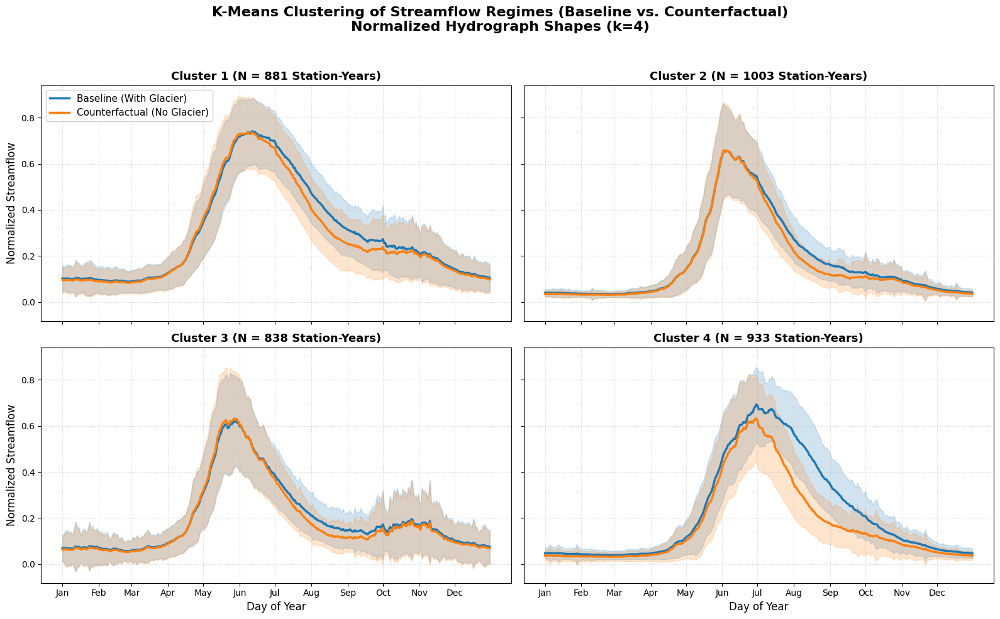

In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import warnings

from src.config import OUTPUT_DATA_DIR, PROCESSED_DATA_DIR

warnings.filterwarnings('ignore')

# =========================================================
# 1. Load Data & Calculate Ensemble Means
# =========================================================
print("Loading data and calculating ensemble means...")

# Load valid glaciated stations
with open(PROCESSED_DATA_DIR / "valid_glaciated_stations.txt", "r") as f:
    glac_stations = [line.strip() for line in f.readlines()]

ensemble_dir = OUTPUT_DATA_DIR / "phase_split"

# Read one file to get the datetime index structure
template = pd.read_csv(ensemble_dir / "phase-split_preds_member_0.csv", index_col=0, parse_dates=True)
test_dates = template.index
glac_stations = [s for s in glac_stations if s in template.columns]

# Aggregate the 10 members into a single Ensemble Mean for both scenarios
pred_list, noglac_list = [], []
for i in range(10):
    pred_list.append(pd.read_csv(ensemble_dir / f"phase-split_preds_member_{i}.csv", index_col=0, parse_dates=True)[glac_stations])
    noglac_list.append(pd.read_csv(ensemble_dir / f"phase-split_preds_noglacier_member_{i}.csv", index_col=0, parse_dates=True)[glac_stations])

df_pred = sum(pred_list) / 10
df_noglac = sum(noglac_list) / 10

# =========================================================
# 2. Build the Concatenated Dataset
# =========================================================
print("Building concatenated Station-Year matrix...")

years = np.unique(test_dates.year)
X_raw = []
metadata = []

for year in years:
    # Filter data for the specific calendar year
    mask = test_dates.year == year
    pred_year = df_pred[mask]
    noglac_year = df_noglac[mask]
    
    for stat in glac_stations:
        p_vals = pred_year[stat].values
        n_vals = noglac_year[stat].values
        
        # Leap year handling: truncate 366-day years to 365 to keep matrix dimensions uniform
        if len(p_vals) == 366: p_vals = p_vals[:-1]
        if len(n_vals) == 366: n_vals = n_vals[:-1]
            
        # Only append if we have a full year of data
        if len(p_vals) == 365 and len(n_vals) == 365:
            # Concatenate into a single 730-element array
            concat_ts = np.concatenate([p_vals, n_vals])
            
            # Avoid entirely dead station-years
            if np.nansum(concat_ts) > 0:
                X_raw.append(concat_ts)
                metadata.append({'Station': stat, 'Year': year})

X = np.array(X_raw)

# Row-wise Normalization: Scale each Station-Year by its own maximum flow
# This forces K-Means to cluster by *shape/timing* rather than basin magnitude
X_max = X.max(axis=1, keepdims=True)
X_scaled = X / X_max

# =========================================================
# 3. K-Means Clustering
# =========================================================
k = 4
print(f"Running K-Means clustering (k={k})...")

kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
labels = kmeans.fit_predict(X_scaled)

# =========================================================
# 4. Plotting
# =========================================================
print("Generating cluster plots...")

fig, axes = plt.subplots(2, 2, figsize=(16, 10), sharex=True, sharey=True)
axes = axes.flatten()
fig.suptitle(f"K-Means Clustering of Streamflow Regimes (Baseline vs. Counterfactual)\nNormalized Hydrograph Shapes (k={k})", fontsize=16, fontweight='bold', y=0.98)

x_days = np.arange(1, 366)

for i in range(k):
    ax = axes[i]
    
    # Extract raw data for this cluster (we plot raw data, not scaled, to see actual magnitudes)
    # Alternatively, you can plot X_scaled to see the pure regime shapes. 
    # Here, we plot the scaled data so the variance bounds aren't blown out by massive rivers.
    cluster_data = X_scaled[labels == i]
    n_samples = len(cluster_data)
    
    # Calculate Mean and Std Dev across the cluster
    cluster_mean = np.mean(cluster_data, axis=0)
    cluster_std = np.std(cluster_data, axis=0)
    
    # Disconnect the concatenated array back into Baseline (0-365) and Counterfactual (365-730)
    pred_mean = cluster_mean[0:365]
    pred_std  = cluster_std[0:365]
    
    noglac_mean = cluster_mean[365:730]
    noglac_std  = cluster_std[365:730]
    
    # Plot Baseline (Predicted)
    ax.plot(x_days, pred_mean, color='tab:blue', linewidth=2.5, label='Baseline (With Glacier)')
    ax.fill_between(x_days, pred_mean - pred_std, pred_mean + pred_std, color='tab:blue', alpha=0.2)
    
    # Plot Counterfactual (No Glacier)
    ax.plot(x_days, noglac_mean, color='tab:orange', linewidth=2.5, label='Counterfactual (No Glacier)')
    ax.fill_between(x_days, noglac_mean - noglac_std, noglac_mean + noglac_std, color='tab:orange', alpha=0.2)
    
    # Formatting
    ax.set_title(f"Cluster {i+1} (N = {n_samples} Station-Years)", fontsize=13, fontweight='bold')
    ax.grid(True, linestyle=':', alpha=0.6)
    
    # Set x-ticks to approximate months
    ax.set_xticks([1, 32, 60, 91, 121, 152, 182, 213, 244, 274, 305, 335])
    ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

# Global labels and legend
for ax in axes[2:]:
    ax.set_xlabel("Day of Year", fontsize=12)
for ax in [axes[0], axes[2]]:
    ax.set_ylabel("Normalized Streamflow", fontsize=12)

axes[0].legend(loc='upper left', fontsize=11, framealpha=0.9)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# Optional: Print out which stations belong to which cluster
# df_meta = pd.DataFrame(metadata)
# df_meta['Cluster'] = labels
# df_meta.to_csv(PROCESSED_DATA_DIR / "station_year_clusters.csv", index=False)

Loading data and calculating ensemble means...
Building concatenated Station-Year matrix...
Running SOM clustering (2x2 grid)...
Generating cluster plots...


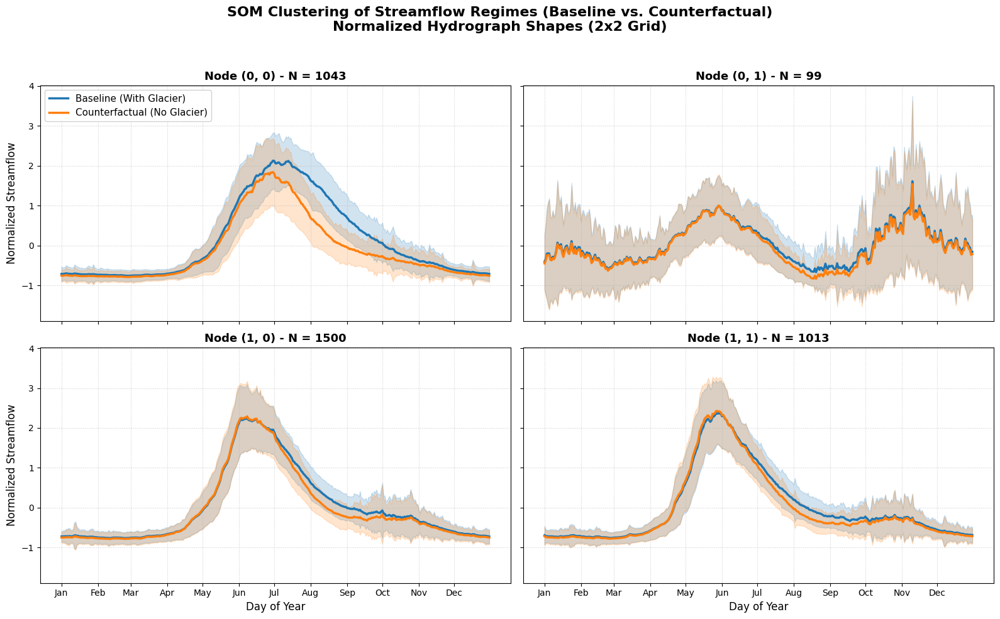

In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from minisom import MiniSom
import warnings

from src.config import OUTPUT_DATA_DIR, PROCESSED_DATA_DIR

warnings.filterwarnings('ignore')

# =========================================================
# 1. Load Data & Calculate Ensemble Means
# =========================================================
print("Loading data and calculating ensemble means...")

with open(PROCESSED_DATA_DIR / "valid_glaciated_stations.txt", "r") as f:
    glac_stations = [line.strip() for line in f.readlines()]

ensemble_dir = OUTPUT_DATA_DIR / "phase_split"

template = pd.read_csv(ensemble_dir / "phase-split_preds_member_0.csv", index_col=0, parse_dates=True)
test_dates = template.index
glac_stations = [s for s in glac_stations if s in template.columns]

pred_list, noglac_list = [], []
for i in range(10):
    pred_list.append(pd.read_csv(ensemble_dir / f"phase-split_preds_member_{i}.csv", index_col=0, parse_dates=True)[glac_stations])
    noglac_list.append(pd.read_csv(ensemble_dir / f"phase-split_preds_noglacier_member_{i}.csv", index_col=0, parse_dates=True)[glac_stations])

df_pred = sum(pred_list) / 10
df_noglac = sum(noglac_list) / 10

# =========================================================
# 2. Build the Concatenated Dataset
# =========================================================
print("Building concatenated Station-Year matrix...")

years = np.unique(test_dates.year)
X_raw = []
metadata = []

for year in years:
    mask = test_dates.year == year
    pred_year = df_pred[mask]
    noglac_year = df_noglac[mask]
    
    for stat in glac_stations:
        p_vals = pred_year[stat].values
        n_vals = noglac_year[stat].values
        
        if len(p_vals) == 366: p_vals = p_vals[:-1]
        if len(n_vals) == 366: n_vals = n_vals[:-1]
            
        if len(p_vals) == 365 and len(n_vals) == 365:
            concat_ts = np.concatenate([p_vals, n_vals])
            
            if np.nansum(concat_ts) > 0:
                X_raw.append(concat_ts)
                metadata.append({'Station': stat, 'Year': year})

X = np.array(X_raw)

# Row-wise Normalization
X_mean = X.mean(axis=1, keepdims=True)
X_std = X.std(axis=1, keepdims=True)
X_scaled = (X - X_mean) / X_std

# =========================================================
# 3. Self-Organizing Map (SOM) Clustering
# =========================================================
grid_x, grid_y = 2, 2  # 2x2 grid = 4 clusters
k = grid_x * grid_y

print(f"Running SOM clustering ({grid_x}x{grid_y} grid)...")

# Initialize and train the SOM
som = MiniSom(x=grid_x, y=grid_y, input_len=X_scaled.shape[1], sigma=1.0, learning_rate=0.5, random_seed=42)
som.pca_weights_init(X_scaled)
som.train_random(X_scaled, num_iteration=2000)

# Get the "winning" node coordinates for each station-year
winner_coords = np.array([som.winner(x) for x in X_scaled])

# Convert the 2D (x, y) grid coordinates into a flat 1D label (0, 1, 2, 3) for easy plotting
labels = winner_coords[:, 0] * grid_y + winner_coords[:, 1]

# =========================================================
# 4. Plotting
# =========================================================
print("Generating cluster plots...")

fig, axes = plt.subplots(grid_x, grid_y, figsize=(16, 10), sharex=True, sharey=True)
axes = axes.flatten()
fig.suptitle(f"SOM Clustering of Streamflow Regimes (Baseline vs. Counterfactual)\nNormalized Hydrograph Shapes ({grid_x}x{grid_y} Grid)", fontsize=16, fontweight='bold', y=0.98)

x_days = np.arange(1, 366)

for i in range(k):
    ax = axes[i]
    
    # Calculate the original 2D grid coordinates for the title (to show topology)
    qx = i // grid_y
    qy = i % grid_y
    
    cluster_data = X_scaled[labels == i]
    n_samples = len(cluster_data)
    
    # Handle empty clusters (SOMs occasionally leave a node empty if it represents an extreme edge case)
    if n_samples == 0:
        ax.set_title(f"Node ({qx}, {qy}) - Empty Cluster", fontsize=13, fontweight='bold')
        ax.grid(True, linestyle=':', alpha=0.6)
        continue
    
    cluster_mean = np.mean(cluster_data, axis=0)
    cluster_std = np.std(cluster_data, axis=0)
    
    pred_mean = cluster_mean[0:365]
    pred_std  = cluster_std[0:365]
    
    noglac_mean = cluster_mean[365:730]
    noglac_std  = cluster_std[365:730]
    
    # Plot Baseline
    ax.plot(x_days, pred_mean, color='tab:blue', linewidth=2.5, label='Baseline (With Glacier)')
    ax.fill_between(x_days, pred_mean - pred_std, pred_mean + pred_std, color='tab:blue', alpha=0.2)
    
    # Plot Counterfactual
    ax.plot(x_days, noglac_mean, color='tab:orange', linewidth=2.5, label='Counterfactual (No Glacier)')
    ax.fill_between(x_days, noglac_mean - noglac_std, noglac_mean + noglac_std, color='tab:orange', alpha=0.2)
    
    # Formatting
    ax.set_title(f"Node ({qx}, {qy}) - N = {n_samples}", fontsize=13, fontweight='bold')
    ax.grid(True, linestyle=':', alpha=0.6)
    
    ax.set_xticks([1, 32, 60, 91, 121, 152, 182, 213, 244, 274, 305, 335])
    ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

# Global labels and legend
for ax in axes[2:]:
    ax.set_xlabel("Day of Year", fontsize=12)
for ax in [axes[0], axes[2]]:
    ax.set_ylabel("Normalized Streamflow", fontsize=12)

axes[0].legend(loc='upper left', fontsize=11, framealpha=0.9)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

Loading data and calculating ensemble means...
Calculating specific glacier yield and standardizing factuals...
Running SOM clustering (2x2 grid)...
Generating topological cluster plots...


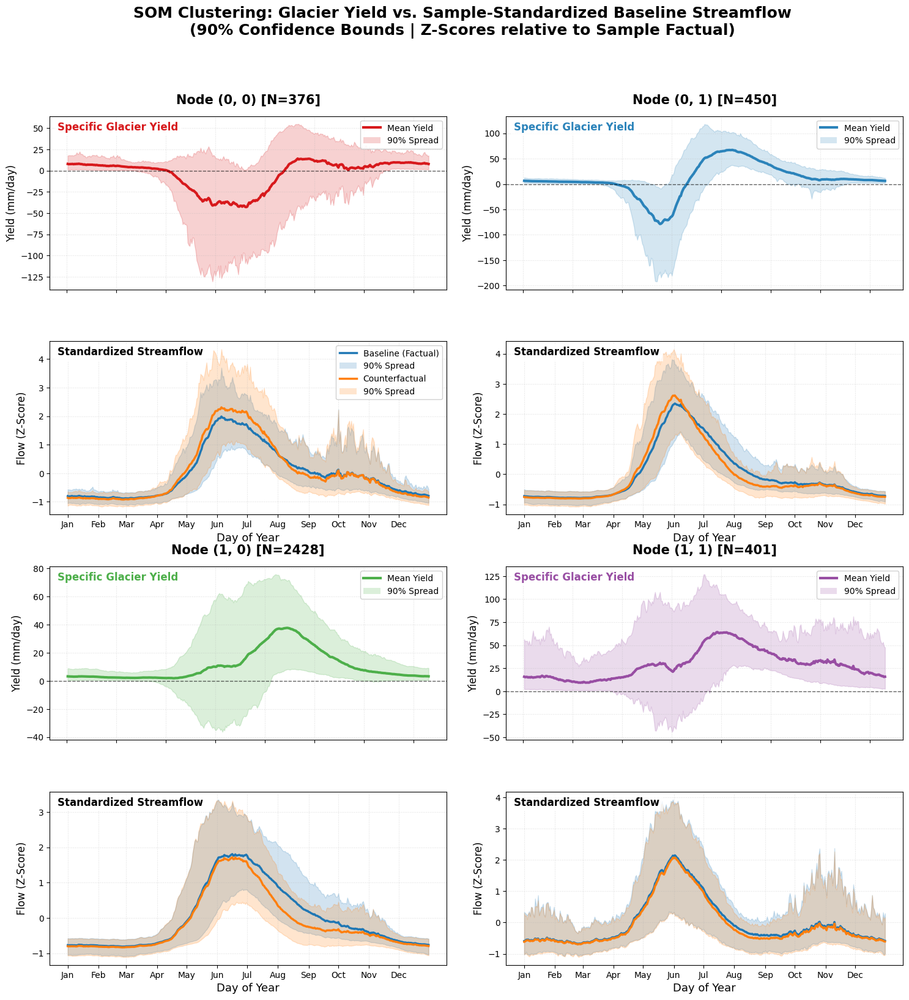


Loading Glacier Volume Change data and generating comparison plots...

--- Correlation Report (Pearson r) ---
Overall Dataset: MCM r = -0.814 | mm r = -0.227
Cluster 0 (Node 0,0): MCM r = -0.582 | mm r = -0.174
Cluster 1 (Node 0,1): MCM r = -0.902 | mm r = -0.050
Cluster 2 (Node 1,0): MCM r = -0.848 | mm r = -0.274
Cluster 3 (Node 1,1): MCM r = -0.954 | mm r = 0.222


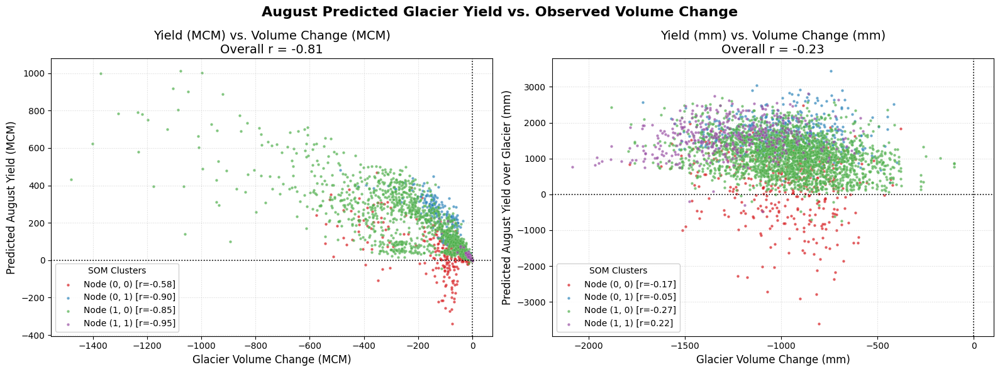

In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from minisom import MiniSom
import warnings
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

from src.config import OUTPUT_DATA_DIR, PROCESSED_DATA_DIR

warnings.filterwarnings('ignore')

# =========================================================
# 1. Load Data & Calculate Ensemble Means
# =========================================================
print("Loading data and calculating ensemble means...")

with open(PROCESSED_DATA_DIR / "valid_glaciated_stations.txt", "r") as f:
    glac_stations = [line.strip() for line in f.readlines()]

ensemble_dir = OUTPUT_DATA_DIR / "phase-split"

# Load static attributes to get the glacier AND basin areas
df_attr = pd.read_csv(PROCESSED_DATA_DIR / "static_attributes.csv", index_col=0)

template = pd.read_csv(ensemble_dir / "phase-split_preds_member_0.csv", index_col=0, parse_dates=True)
test_dates = template.index
glac_stations = [s for s in glac_stations if s in template.columns]

pred_list, noglac_list = [], []
for i in range(10):
    pred_list.append(pd.read_csv(ensemble_dir / f"phase-split_preds_member_{i}.csv", index_col=0, parse_dates=True)[glac_stations])
    noglac_list.append(pd.read_csv(ensemble_dir / f"phase-split_preds_noglacier_member_{i}.csv", index_col=0, parse_dates=True)[glac_stations])

df_pred = sum(pred_list) / 10
df_noglac = sum(noglac_list) / 10

# =========================================================
# 2. Build Datasets (Physical Units & Sample Standardization)
# =========================================================
print("Calculating specific glacier yield and standardizing factuals...")

years = np.unique(test_dates.year)
X_raw = [] # Specific Glacier Yield (Difference)
P_raw = [] # Baseline Basin Streamflow (Factual)
N_raw = [] # Counterfactual Basin Streamflow
metadata = []

for year in years:
    mask = test_dates.year == year
    pred_year = df_pred[mask]
    noglac_year = df_noglac[mask]
    
    for stat in glac_stations:
        if stat not in df_attr.index: continue
        basin_area = df_attr.loc[stat, 'basin_area_km2']
        glac_area = df_attr.loc[stat, 'glacier_area_km2']
        
        if pd.isna(glac_area) or glac_area <= 0 or pd.isna(basin_area) or basin_area <= 0: 
            continue
            
        p_vals = pred_year[stat].values
        n_vals = noglac_year[stat].values
        
        if len(p_vals) == 366: p_vals = p_vals[:-1]
        if len(n_vals) == 366: n_vals = n_vals[:-1]
            
        if len(p_vals) == 365 and len(n_vals) == 365:
            # Calculate specific yield of the ice
            diff_glac_avg = (p_vals - n_vals) * (basin_area / glac_area)
            
            if np.nanmax(diff_glac_avg) > 0.01:
                X_raw.append(diff_glac_avg)
                P_raw.append(p_vals)
                N_raw.append(n_vals)
                # ADDED: Store the glacier area so we can use it to calculate MCM later
                metadata.append({'Station': stat, 'Year': year, 'glacier_area_km2': glac_area})

X = np.array(X_raw)
P = np.array(P_raw)
N = np.array(N_raw)

# --- PER-SAMPLE STANDARDIZATION ---
P_mean = np.mean(P, axis=1, keepdims=True)
P_std = np.std(P, axis=1, keepdims=True)
P_std[P_std == 0] = 1e-6 # Prevent division by zero

P_scaled = (P - P_mean) / P_std
N_scaled = (N - P_mean) / P_std

# =========================================================
# 3. Global Standardization & SOM Clustering
# =========================================================
X_global_scaled = (X - np.mean(X)) / np.std(X)

grid_x, grid_y = 2, 2
k = grid_x * grid_y

print(f"Running SOM clustering ({grid_x}x{grid_y} grid)...")

som = MiniSom(x=grid_x, y=grid_y, input_len=X_global_scaled.shape[1], sigma=1.0, learning_rate=0.5, random_seed=42)
som.pca_weights_init(X_global_scaled)
som.train_random(X_global_scaled, num_iteration=2000)

winner_coords = np.array([som.winner(x) for x in X_global_scaled])
labels = winner_coords[:, 0] * grid_y + winner_coords[:, 1]

# =========================================================
# 4. Plotting (Mapped Topological 2x2 Layout)
# =========================================================
print("Generating topological cluster plots...")

cluster_colors = {
    0: '#d7191c',  # Red
    1: '#2b83ba',  # Blue
    2: '#4daf4a',  # Green
    3: '#984ea3'   # Purple
}

# Create a 4x2 grid to stack the plots while maintaining the 2x2 SOM topology
fig, axes = plt.subplots(4, 2, figsize=(18, 18))
fig.suptitle("SOM Clustering: Glacier Yield vs. Sample-Standardized Baseline Streamflow\n(90% Confidence Bounds | Z-Scores relative to Sample Factual)", fontsize=18, fontweight='bold', y=0.98)

x_days = np.arange(1, 366)

for i in range(k):
    qx = i // grid_y
    qy = i % grid_y
    
    row_yield = qx * 2
    row_str   = qx * 2 + 1
    col       = qy
    
    ax_diff = axes[row_yield, col]
    ax_abs  = axes[row_str, col]
    
    diff_data = X[labels == i]          # Physical Yield units
    p_data    = P_scaled[labels == i]   # Sample-standardized Factual
    n_data    = N_scaled[labels == i]   # Sample-standardized Counterfactual
    n_samples = len(diff_data)
    
    # Grab the color specific to this cluster
    c_color = cluster_colors[i]
    
    if n_samples == 0:
        ax_diff.set_title(f"Node ({qx}, {qy}) - Empty Cluster", fontsize=13)
        ax_abs.axis('off')
        continue
    
    # --- TOP PLOT: Specific Glacier Yield (Physical Units) ---
    diff_mean = np.mean(diff_data, axis=0)
    diff_lower, diff_upper = np.percentile(diff_data, [5, 95], axis=0)
    
    # Apply dynamic cluster colors here
    ax_diff.fill_between(x_days, diff_lower, diff_upper, color=c_color, alpha=0.2)
    ax_diff.plot(x_days, diff_mean, color=c_color, linewidth=3, label='Mean Glacier Yield')
    ax_diff.axhline(0, color='black', linewidth=1, linestyle='--', alpha=0.6)
    
    ax_diff.set_title(f"Node ({qx}, {qy}) [N={n_samples}]", fontsize=15, fontweight='bold', pad=15)
    ax_diff.text(0.02, 0.92, "Specific Glacier Yield", transform=ax_diff.transAxes, fontsize=12, fontweight='bold', color=c_color, bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))
    
    ax_diff.grid(True, linestyle=':', alpha=0.4)
    ax_diff.set_ylabel("Yield (mm/day)", fontsize=12)
    ax_diff.set_xticklabels([])
    
    # Legend specifically for the colored yield plot
    custom_diff = [Line2D([0], [0], color=c_color, lw=3), Patch(facecolor=c_color, alpha=0.2)]
    ax_diff.legend(custom_diff, ['Mean Yield', '90% Spread'], loc='upper right', framealpha=0.9)
    
    # --- BOTTOM PLOT: Standardized Streamflow ---
    p_mean = np.mean(p_data, axis=0)
    n_mean = np.mean(n_data, axis=0)
    
    p_lower, p_upper = np.percentile(p_data, [5, 95], axis=0)
    n_lower, n_upper = np.percentile(n_data, [5, 95], axis=0)
    
    ax_abs.fill_between(x_days, p_lower, p_upper, color='tab:blue', alpha=0.2)
    ax_abs.plot(x_days, p_mean, color='tab:blue', linewidth=2.5, label='Baseline Mean')
    
    ax_abs.fill_between(x_days, n_lower, n_upper, color='tab:orange', alpha=0.2)
    ax_abs.plot(x_days, n_mean, color='tab:orange', linewidth=2.5, label='Counterfactual Mean')
    
    ax_abs.text(0.02, 0.92, "Standardized Streamflow", transform=ax_abs.transAxes, fontsize=12, fontweight='bold', color='black', bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))
    
    ax_abs.grid(True, linestyle=':', alpha=0.4)
    ax_abs.set_ylabel("Flow (Z-Score)", fontsize=12)
    
    ax_abs.set_xticks([1, 32, 60, 91, 121, 152, 182, 213, 244, 274, 305, 335])
    ax_abs.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    ax_abs.set_xlabel("Day of Year", fontsize=13)
    
    # Place unified legend only on the first Streamflow block
    if i == 0: 
        custom_abs = [
            Line2D([0], [0], color='tab:blue', lw=2.5), Patch(facecolor='tab:blue', alpha=0.2),
            Line2D([0], [0], color='tab:orange', lw=2.5), Patch(facecolor='tab:orange', alpha=0.2)
        ]
        ax_abs.legend(custom_abs, ['Baseline (Factual)', '90% Spread', 'Counterfactual', '90% Spread'], loc='upper right', framealpha=0.9)

plt.subplots_adjust(hspace=0.3, wspace=0.15)
plt.show()

# Export cluster labels
df_meta = pd.DataFrame(metadata)
df_meta['Cluster'] = labels
df_meta.to_csv(PROCESSED_DATA_DIR / "som_bias_clusters_final.csv", index=False)

# =========================================================
# 5. Glacier Volume Change Comparison
# =========================================================
print("\nLoading Glacier Volume Change data and generating comparison plots...")

# 1. Calculate Predicted August Yield (mm) & Volume (MCM)
aug_start, aug_end = 212, 243
df_meta['aug_yield_mm'] = np.sum(X[:, aug_start:aug_end], axis=1)

# Conversion: Volume (MCM) = Yield (mm) * Area (km²) / 1000
df_meta['aug_yield_mcm'] = (df_meta['aug_yield_mm'] * df_meta['glacier_area_km2']) / 1000.0

# 2. Load Volume Change Data
vol_change_path = PROCESSED_DATA_DIR / "glacier_volume_change.csv"
if vol_change_path.exists():
    # Read wide-format CSV: Dates as index, Stations as columns
    df_vol = pd.read_csv(vol_change_path, index_col=0, parse_dates=True)
    
    # Filter only for the August observations to match our August predicted yield
    df_vol_aug = df_vol[df_vol.index.month == 8]
    
    # Stack the dataframe: from wide (columns=Stations) to long format
    df_vol_long = df_vol_aug.stack().reset_index()
    df_vol_long.columns = ['Date', 'Station', 'Observed_Volume_Change_MCM']
    
    # Extract Year and clean Station names for merging
    df_vol_long['Year'] = df_vol_long['Date'].dt.year
    df_vol_long['Station'] = df_vol_long['Station'].astype(str).str.strip().str.upper()
    df_meta['Station'] = df_meta['Station'].astype(str).str.strip().str.upper()
    
    # Merge on Station and Year
    plot_df = pd.merge(df_meta, df_vol_long, on=['Station', 'Year'], how='inner')
    
    # CALCULATE OBSERVED VOLUME CHANGE IN MM
    plot_df['Observed_Volume_Change_mm'] = (plot_df['Observed_Volume_Change_MCM'] / plot_df['glacier_area_km2']) * 1000.0
    
    if not plot_df.empty:
        # Calculate Total Correlations (Pearson r)
        total_corr_mcm = plot_df['Observed_Volume_Change_MCM'].corr(plot_df['aug_yield_mcm'])
        total_corr_mm = plot_df['Observed_Volume_Change_mm'].corr(plot_df['aug_yield_mm'])

        fig, axes = plt.subplots(1, 2, figsize=(16, 6))
        fig.suptitle("August Predicted Glacier Yield vs. Observed Volume Change", fontsize=16, fontweight='bold')
        
        print("\n--- Correlation Report (Pearson r) ---")
        print(f"Overall Dataset: MCM r = {total_corr_mcm:.3f} | mm r = {total_corr_mm:.3f}")
        
        for i in range(4):
            subset = plot_df[plot_df['Cluster'] == i]
            qx, qy = i // 2, i % 2
            
            # Calculate Cluster-Specific Correlations
            if len(subset) > 1:
                r_mcm = subset['Observed_Volume_Change_MCM'].corr(subset['aug_yield_mcm'])
                r_mm = subset['Observed_Volume_Change_mm'].corr(subset['aug_yield_mm'])
                label_mcm = f'Node ({qx}, {qy}) [r={r_mcm:.2f}]'
                label_mm = f'Node ({qx}, {qy}) [r={r_mm:.2f}]'
                print(f"Cluster {i} (Node {qx},{qy}): MCM r = {r_mcm:.3f} | mm r = {r_mm:.3f}")
            else:
                label_mcm = f'Node ({qx}, {qy}) [N={len(subset)}]'
                label_mm = f'Node ({qx}, {qy}) [N={len(subset)}]'
                print(f"Cluster {i} (Node {qx},{qy}): Not enough data points to calculate correlation.")
            
            # Plot A: MCM vs MCM
            axes[0].scatter(
                subset['Observed_Volume_Change_MCM'], subset['aug_yield_mcm'], 
                color=cluster_colors[i], alpha=0.7, edgecolors='white', linewidths=0.1, s=10,
                label=label_mcm
            )
            
            # Plot B: mm vs mm
            axes[1].scatter(
                subset['Observed_Volume_Change_mm'], subset['aug_yield_mm'], 
                color=cluster_colors[i], alpha=0.7, edgecolors='white', linewidths=0.1, s=10,
                label=label_mm
            )
        
        # Formatting & Appending Overall Correlation to Titles
        axes[0].set_title(f"Yield (MCM) vs. Volume Change (MCM)\nOverall r = {total_corr_mcm:.2f}", fontsize=14)
        axes[0].set_ylabel("Predicted August Yield (MCM)", fontsize=12)
        axes[0].set_xlabel("Glacier Volume Change (MCM)", fontsize=12)
        
        axes[1].set_title(f"Yield (mm) vs. Volume Change (mm)\nOverall r = {total_corr_mm:.2f}", fontsize=14)
        axes[1].set_ylabel("Predicted August Yield over Glacier (mm)", fontsize=12)
        axes[1].set_xlabel("Glacier Volume Change (mm)", fontsize=12)
        
        for ax in axes:
            ax.axhline(0, color='black', linestyle=':', linewidth=1.2)
            ax.axvline(0, color='black', linestyle=':', linewidth=1.2)
            ax.grid(True, linestyle=':', alpha=0.5)
            # Ensure legends are on both plots so the specific correlations are visible
            ax.legend(title="SOM Clusters", loc='best', framealpha=0.9)
            
        plt.tight_layout()
        plt.show()
    else:
        print("Merge resulted in 0 rows. Please verify that the Station formats match between files.")
else:
    print(f"Warning: Could not locate {vol_change_path}")

Loading data for residual analysis...
Calculating August residuals (Predicted - Actual)...
Successfully calculated residuals for 3655 station-years.
Generating Scatter Plots...


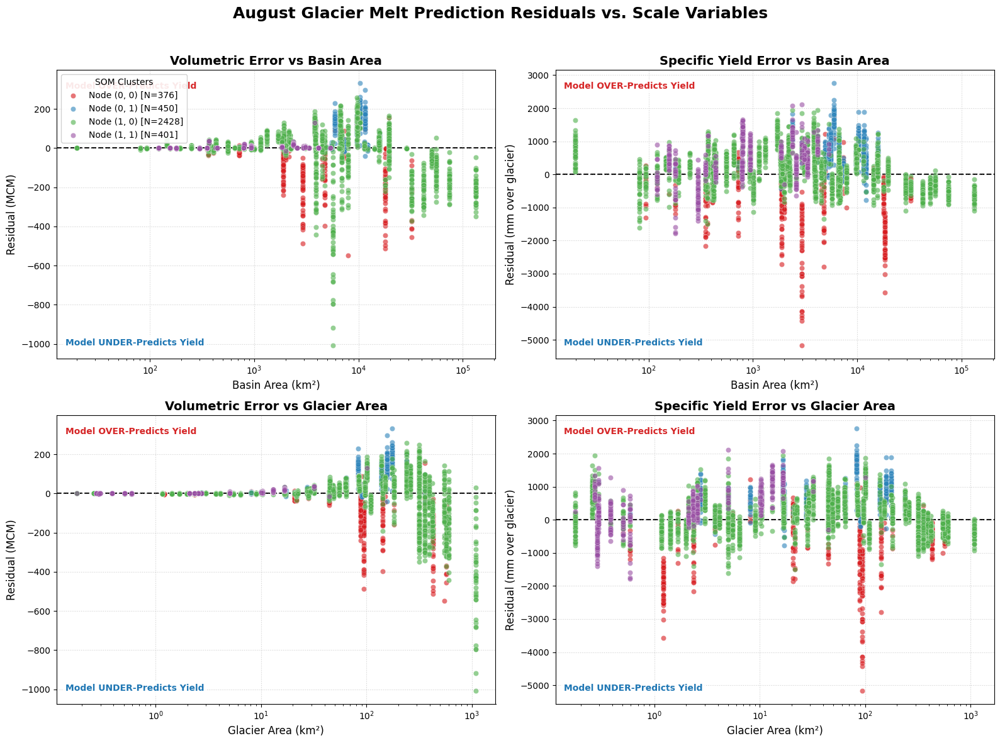

In [115]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings

from src.config import OUTPUT_DATA_DIR, PROCESSED_DATA_DIR

warnings.filterwarnings('ignore')

# =========================================================
# 1. Load Data
# =========================================================
print("Loading data for residual analysis...")

# Load Static Attributes (Needed for Basin Area and Glacier Area)
df_attr = pd.read_csv(PROCESSED_DATA_DIR / "static_attributes.csv", index_col=0)
df_attr.index = df_attr.index.astype(str).str.strip().str.upper()

# Load SOM Clusters
df_meta = pd.read_csv(PROCESSED_DATA_DIR / "som_bias_clusters_final.csv")
df_meta['Station'] = df_meta['Station'].astype(str).str.strip().str.upper()

# Load Predictions (Data is in mm/day)
pred_dir = OUTPUT_DATA_DIR / "phase_split"
df_pred = pd.read_csv(pred_dir / "phase-split_preds_best8_mean.csv", index_col=0, parse_dates=True)
df_noglac = pd.read_csv(pred_dir / "phase-split_preds_noglacier_best8_mean.csv", index_col=0, parse_dates=True)

# Load Actual Mass Balance (MCM)
df_vol = pd.read_csv(PROCESSED_DATA_DIR / "glacier_volume_change.csv", index_col=0, parse_dates=True)
df_vol.columns = df_vol.columns.astype(str).str.strip().str.upper()

# =========================================================
# 2. Calculate August Predictions, Actuals, and Residuals
# =========================================================
print("Calculating August residuals (Predicted - Actual)...")

records = []
years = df_meta['Year'].unique()

for year in years:
    # 1. Slice data for August of the current year
    aug_mask = (df_pred.index.year == year) & (df_pred.index.month == 8)
    if not aug_mask.any(): continue
    
    # Sum the mm/day to get total mm for August
    pred_aug = df_pred[aug_mask].sum()
    noglac_aug = df_noglac[aug_mask].sum()
    
    # Get observed August volume change
    vol_mask = (df_vol.index.year == year) & (df_vol.index.month == 8)
    if not vol_mask.any(): continue
    vol_aug = df_vol[vol_mask].sum() 
    
    # Loop through the specific stations clustered for this year
    stats_this_year = df_meta[df_meta['Year'] == year]['Station'].unique()
    
    for stat in stats_this_year:
        if stat not in df_attr.index or stat not in vol_aug.index or pd.isna(vol_aug[stat]):
            continue
            
        basin_area = df_attr.loc[stat, 'basin_area_km2']
        glac_area = df_attr.loc[stat, 'glacier_area_km2']
        
        if pd.isna(basin_area) or pd.isna(glac_area) or glac_area <= 0:
            continue
        
        # --- A. Predicted Yield ---
        aug_yield_mm = (pred_aug[stat] - noglac_aug[stat]) * (basin_area / glac_area)
        aug_yield_mcm = (aug_yield_mm * glac_area) / 1000.0
        
        # --- B. Observed Yield ---
        obs_mcm = vol_aug[stat]
        obs_mm = (obs_mcm / glac_area) * 1000.0
        
        # --- C. Residuals (Predicted - Actual) ---
        res_mcm = aug_yield_mcm - np.abs(obs_mcm)
        res_mm = aug_yield_mm - np.abs(obs_mm)
        
        # --- D. Attach Metadata ---
        cluster = df_meta[(df_meta['Year'] == year) & (df_meta['Station'] == stat)]['Cluster'].values[0]
        
        records.append({
            'Station': stat,
            'Year': year,
            'Cluster': cluster,
            'basin_area_km2': basin_area,
            'glacier_area_km2': glac_area, # <--- NEW: Tracked for the new plots
            'glacier_pct': df_attr.loc[stat, 'glacier_pct'],
            'res_mcm': res_mcm,
            'res_mm': res_mm
        })

df_res = pd.DataFrame(records)
print(f"Successfully calculated residuals for {len(df_res)} station-years.")

# =========================================================
# 3. Plotting Residuals vs. Basin & Glacier Area
# =========================================================
print("Generating Scatter Plots...")

# Increased figure height to comfortably fit 2 rows
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle("August Glacier Melt Prediction Residuals vs. Scale Variables", fontsize=18, fontweight='bold', y=0.98)

cluster_colors = {
    0: '#d7191c',  # Node (0, 0)
    1: '#2b83ba',  # Node (0, 1)
    2: '#4daf4a',  # Node (1, 0)
    3: '#984ea3'   # Node (1, 1)
}

# Define the four plots (mapping coordinates in the 2x2 grid)
plots = [
    # Row 1: vs Basin Area
    {'ax': axes[0, 0], 'x_col': 'basin_area_km2', 'y_col': 'res_mcm', 'title': 'Volumetric Error vs Basin Area', 'xlabel': 'Basin Area (km²)', 'ylabel': 'Residual (MCM)'},
    {'ax': axes[0, 1], 'x_col': 'basin_area_km2', 'y_col': 'res_mm', 'title': 'Specific Yield Error vs Basin Area', 'xlabel': 'Basin Area (km²)', 'ylabel': 'Residual (mm over glacier)'},
    
    # Row 2: vs Glacier Area
    {'ax': axes[1, 0], 'x_col': 'glacier_area_km2', 'y_col': 'res_mcm', 'title': 'Volumetric Error vs Glacier Area', 'xlabel': 'Glacier Area (km²)', 'ylabel': 'Residual (MCM)'},
    {'ax': axes[1, 1], 'x_col': 'glacier_area_km2', 'y_col': 'res_mm', 'title': 'Specific Yield Error vs Glacier Area', 'xlabel': 'Glacier Area (km²)', 'ylabel': 'Residual (mm over glacier)'}
]

for p in plots:
    ax = p['ax']
    
    for i in range(4):
        subset = df_res[df_res['Cluster'] == i]
        qx, qy = i // 2, i % 2
        
        if not subset.empty:
            ax.scatter(
                subset[p['x_col']], # Dynamically pull X variable 
                subset[p['y_col']], # Dynamically pull Y variable
                color=cluster_colors[i], 
                alpha=0.6, 
                edgecolors='white', 
                linewidths=0.3, 
                s=35,
                label=f'Node ({qx}, {qy}) [N={len(subset)}]'
            )
            
    # Add a bold line at 0 (Perfect Prediction)
    ax.axhline(0, color='black', linewidth=1.5, linestyle='--', zorder=0)
    
    # Interpretive text boxes
    props = dict(boxstyle='square,pad=0.3', facecolor='white', alpha=0.8, edgecolor='none')
    ax.text(0.02, 0.96, 'Model OVER-Predicts Yield', transform=ax.transAxes, fontsize=10, fontweight='bold', color='tab:red', va='top', bbox=props)
    ax.text(0.02, 0.04, 'Model UNDER-Predicts Yield', transform=ax.transAxes, fontsize=10, fontweight='bold', color='tab:blue', va='bottom', bbox=props)

    # Formatting
    ax.set_title(p['title'], fontsize=14, fontweight='bold')
    ax.set_xlabel(p['xlabel'], fontsize=12)
    ax.set_ylabel(p['ylabel'], fontsize=12)
    
    # Use Log Scale for Areas
    ax.set_xscale('log')
    ax.grid(True, linestyle=':', alpha=0.6)
    
    # Add legend ONLY to the top-left plot to keep things clean
    if p['ax'] == axes[0, 0]:
        ax.legend(title="SOM Clusters", loc='upper left', framealpha=0.9, fontsize=10)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

Loading predictions, ground truth, mass balance, and attributes...
Converting streamflow to mm/day and mass balance to mm...
Calculating August volumetric fractions...
Merging with SOM clusters and calculating correlations...

--- Correlation Report (Pearson r) ---
Overall Dataset: r = 0.796 (N=3639)
--------------------------------------------------

Generating Scatter Plot...
Cluster 0 (Node 0,0): r = 0.461 (N=363)
Cluster 1 (Node 0,1): r = 0.854 (N=449)
Cluster 2 (Node 1,0): r = 0.838 (N=2426)
Cluster 3 (Node 1,1): r = 0.912 (N=401)


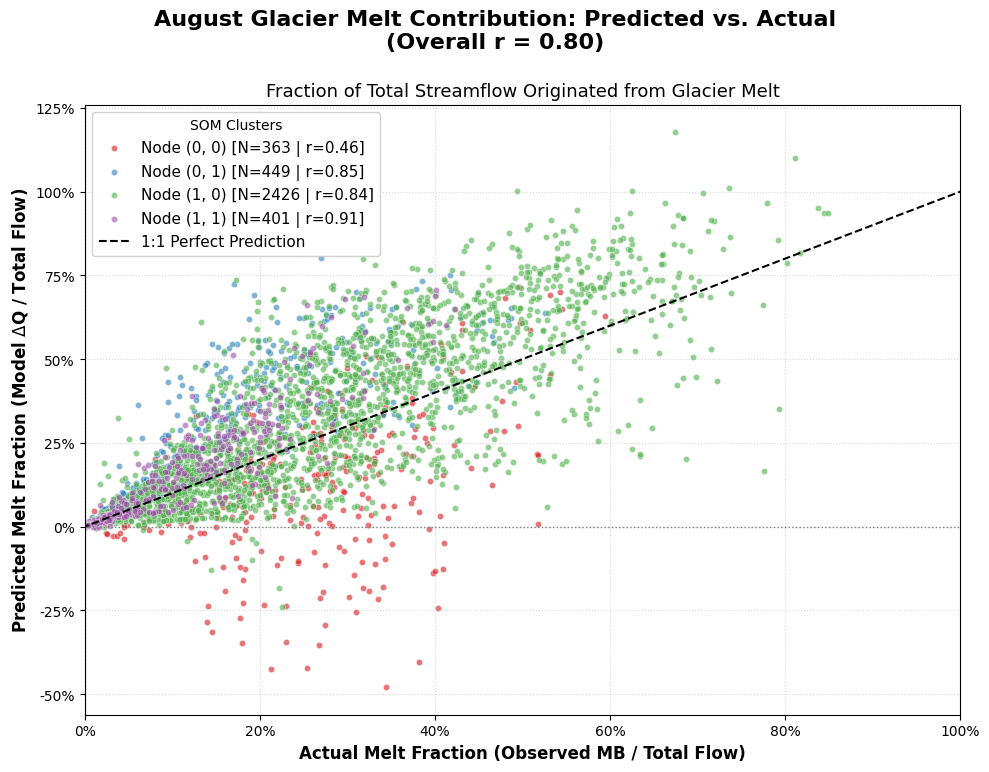

In [44]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings

from src.config import OUTPUT_DATA_DIR, PROCESSED_DATA_DIR

warnings.filterwarnings('ignore')

# =========================================================
# 1. Load Streamflow, Mass Balance, and Topo Data
# =========================================================
print("Loading predictions, ground truth, mass balance, and attributes...")

q_factual = pd.read_csv(OUTPUT_DATA_DIR / "phase-split/phase-split_preds_ensemble.csv", index_col=0, parse_dates=True)
q_counterfactual = pd.read_csv(OUTPUT_DATA_DIR / "phase-split" / "phase-split_preds_noglacier_ensemble.csv", index_col=0, parse_dates=True)
q_ground_truth = pd.read_csv(PROCESSED_DATA_DIR / "combined_streamflow.csv", index_col=0, parse_dates=True)
mb_contribution = -pd.read_csv(PROCESSED_DATA_DIR / "glacier_volume_change.csv", index_col=0, parse_dates=True)

df_attr = pd.read_csv(PROCESSED_DATA_DIR / "static_attributes.csv", index_col=0)
df_attr.index = df_attr.index.astype(str).str.strip().str.upper()

# Calculate predicted melt contribution (Q - Q_noglacier)
delta_q = q_factual - q_counterfactual

# Filter to valid glaciated stations
with open(PROCESSED_DATA_DIR / "valid_glaciated_stations.txt", "r") as f:
    valid_stations = [line.strip().upper() for line in f.readlines()]

# Ensure we only keep columns that exist in all dataframes
common_cols = [s for s in valid_stations if s in q_factual.columns and s in q_ground_truth.columns and s in mb_contribution.columns and s in df_attr.index]

q_ground_truth = q_ground_truth[common_cols]
delta_q = delta_q[common_cols]
mb_contribution = mb_contribution[common_cols]

# =========================================================
# 2. Convert Units to mm over the Basin
# =========================================================
print("Converting streamflow to mm/day and mass balance to mm...")

for stat in common_cols:
    basin_area = df_attr.loc[stat, 'basin_area_km2']
    
    if basin_area > 0:
        # Convert m^3/s to mm/day
        q_ground_truth[stat] = q_ground_truth[stat] * (86.4 / basin_area)
        
        # Convert MCM to mm equivalent over the ENTIRE basin area 
        mb_contribution[stat] = (mb_contribution[stat] * 1000.0) / basin_area

# =========================================================
# 3. Calculate August Melt Fractions (Yearly Aggregation)
# =========================================================
print("Calculating August volumetric fractions...")

aug_mask_daily = (delta_q.index.month == 8)
aug_mask_monthly = (mb_contribution.index.month == 8)

delta_q_aug_sum = delta_q[aug_mask_daily].groupby(delta_q[aug_mask_daily].index.year).sum()
q_gt_aug_sum = q_ground_truth[aug_mask_daily].groupby(q_ground_truth[aug_mask_daily].index.year).sum()
mb_aug_sum = mb_contribution[aug_mask_monthly].groupby(mb_contribution[aug_mask_monthly].index.year).sum()

common_years = delta_q_aug_sum.index.intersection(mb_aug_sum.index).intersection(q_gt_aug_sum.index)

delta_q_aug_sum = delta_q_aug_sum.loc[common_years]
mb_aug_sum = mb_aug_sum.loc[common_years]
q_gt_aug_sum = q_gt_aug_sum.loc[common_years]

q_gt_aug_sum = q_gt_aug_sum.replace(0, np.nan)

pred_fraction = delta_q_aug_sum / q_gt_aug_sum
act_fraction = np.abs(mb_aug_sum) / q_gt_aug_sum

df_pred = pred_fraction.stack().reset_index()
df_pred.columns = ['Year', 'Station', 'Predicted_Fraction']

df_act = act_fraction.stack().reset_index()
df_act.columns = ['Year', 'Station', 'Actual_Fraction']

plot_df = pd.merge(df_pred, df_act, on=['Year', 'Station'], how='inner')
plot_df['Station'] = plot_df['Station'].astype(str).str.strip().str.upper()

# =========================================================
# 4. Merge with SOM Clusters & Calculate Correlations
# =========================================================
print("Merging with SOM clusters and calculating correlations...")

df_meta = pd.read_csv(PROCESSED_DATA_DIR / "som_bias_clusters_final.csv")
df_meta['Station'] = df_meta['Station'].astype(str).str.strip().str.upper()

plot_df = pd.merge(plot_df, df_meta[['Year', 'Station', 'Cluster']], on=['Year', 'Station'], how='inner')

# Drop outliers for plotting/correlation sanity
plot_df = plot_df.replace([np.inf, -np.inf], np.nan).dropna()
plot_df = plot_df[(plot_df['Predicted_Fraction'] >= -0.5) & (plot_df['Predicted_Fraction'] <= 1.5)]
plot_df = plot_df[(plot_df['Actual_Fraction'] >= -0.5) & (plot_df['Actual_Fraction'] <= 1.5)]

# Calculate Overall Correlation
overall_corr = plot_df['Actual_Fraction'].corr(plot_df['Predicted_Fraction'])

print("\n" + "="*50)
print("--- Correlation Report (Pearson r) ---")
print(f"Overall Dataset: r = {overall_corr:.3f} (N={len(plot_df)})")
print("-" * 50)

# =========================================================
# 5. Plotting: Predicted vs Actual Fraction
# =========================================================
print("\nGenerating Scatter Plot...")

fig, ax = plt.subplots(figsize=(10, 8))
fig.suptitle(f"August Glacier Melt Contribution: Predicted vs. Actual\n(Overall r = {overall_corr:.2f})", fontsize=16, fontweight='bold', y=0.96)

cluster_colors = {
    0: '#d7191c',  # Node (0, 0)
    1: '#2b83ba',  # Node (0, 1)
    2: '#4daf4a',  # Node (1, 0)
    3: '#984ea3'   # Node (1, 1)
}

# Plot each cluster and calculate cluster-specific correlations
for cluster_id in range(4):
    subset = plot_df[plot_df['Cluster'] == cluster_id]
    
    qx = cluster_id // 2
    qy = cluster_id % 2
    
    if len(subset) > 1:
        cluster_corr = subset['Actual_Fraction'].corr(subset['Predicted_Fraction'])
        print(f"Cluster {cluster_id} (Node {qx},{qy}): r = {cluster_corr:.3f} (N={len(subset)})")
        label_text = f'Node ({qx}, {qy}) [N={len(subset)} | r={cluster_corr:.2f}]'
    elif len(subset) == 1:
        print(f"Cluster {cluster_id} (Node {qx},{qy}): Not enough data to calculate correlation (N=1)")
        label_text = f'Node ({qx}, {qy}) [N=1]'
    else:
        continue
        
    ax.scatter(
        subset['Actual_Fraction'], 
        subset['Predicted_Fraction'], 
        color=cluster_colors[cluster_id], 
        alpha=0.6, 
        edgecolors='white', 
        linewidths=0.4, 
        s=20, # Reduced size slightly to handle overlap
        label=label_text
    )

print("="*50)

# Add 1:1 Perfect Prediction Line
min_val = min(plot_df['Actual_Fraction'].min(), plot_df['Predicted_Fraction'].min())
max_val = max(plot_df['Actual_Fraction'].max(), plot_df['Predicted_Fraction'].max())

ax.plot([min_val, max_val], [min_val, max_val], color='black', linestyle='--', linewidth=1.5, label='1:1 Perfect Prediction')

# Add 0 lines for reference
ax.axhline(0, color='gray', linestyle=':', linewidth=1)
ax.axvline(0, color='gray', linestyle=':', linewidth=1)

# Formatting
ax.set_title("Fraction of Total Streamflow Originated from Glacier Melt", fontsize=13)
ax.set_xlabel("Actual Melt Fraction (Observed MB / Total Flow)", fontsize=12, fontweight='bold')
ax.set_ylabel("Predicted Melt Fraction (Model $\Delta$Q / Total Flow)", fontsize=12, fontweight='bold')

# Format axes as percentages
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x*100:.0f}%'))
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y*100:.0f}%'))

ax.grid(True, linestyle=':', alpha=0.5)
ax.legend(title="SOM Clusters", loc='best', framealpha=0.9, fontsize=11)
ax.set_xlim(-0, 1)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

Generating Actual Melt Fraction vs. Glacier Percentage Plot...


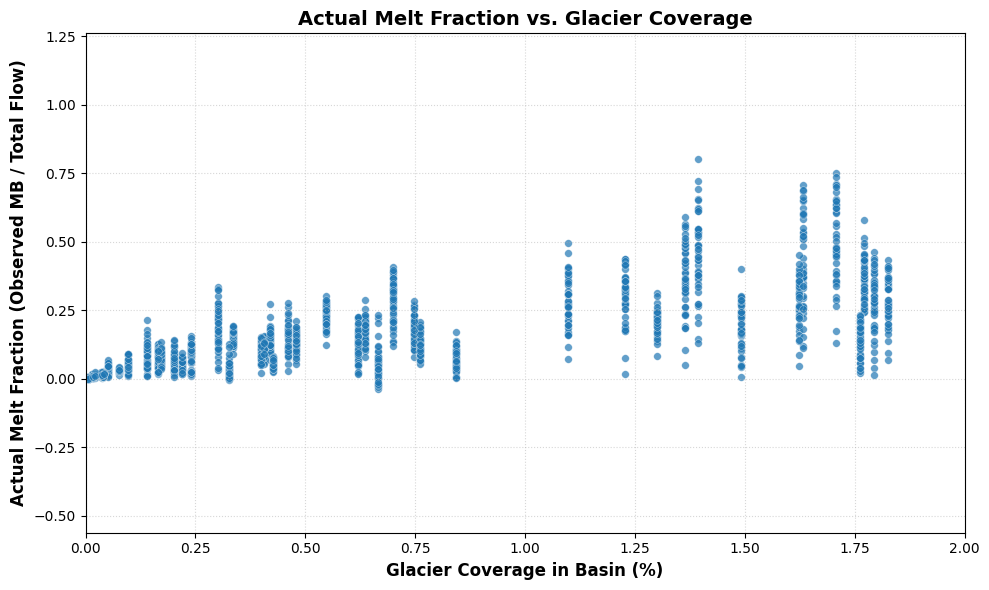

In [45]:
# make quick plot of actual melt fraction vs glacier percentage
print("Generating Actual Melt Fraction vs. Glacier Percentage Plot...")
fig, ax = plt.subplots(figsize=(10, 6))
plot_df = plot_df.merge(df_attr[['glacier_pct']], left_on='Station', right_index=True, how='left')
ax.scatter(plot_df['glacier_pct'], plot_df['Predicted_Fraction'], color='tab:blue', alpha=0.7, edgecolors='white', linewidths=0.3, s=30)
ax.set_xlabel("Glacier Coverage in Basin (%)", fontsize=12, fontweight='bold')
ax.set_ylabel("Actual Melt Fraction (Observed MB / Total Flow)", fontsize=12, fontweight='bold')
ax.set_title("Actual Melt Fraction vs. Glacier Coverage", fontsize=14, fontweight='bold')
ax.grid(True, linestyle=':', alpha=0.5)
ax.set_xlim(0, 2)
plt.tight_layout()
plt.show()

Loading SOM cluster assignments and spatial metadata...
Successfully mapped 85 distinct glaciated stations.
Calculating volume, timing biases, and total flows...
Generating Volume vs. Timing Scatter Plot...


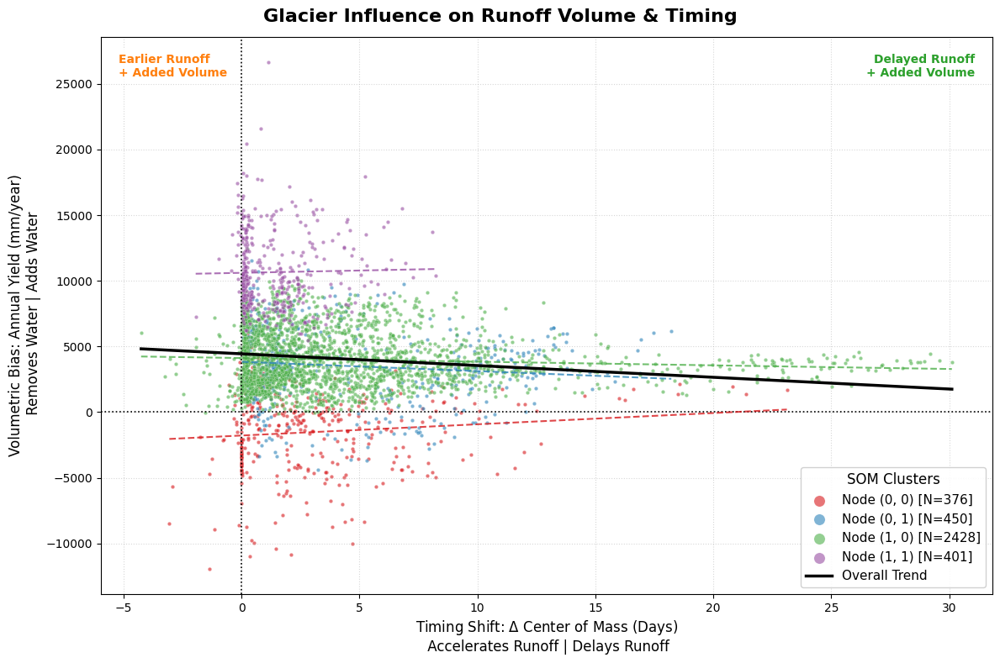

Generating Flow vs. Volumetric Bias plots...


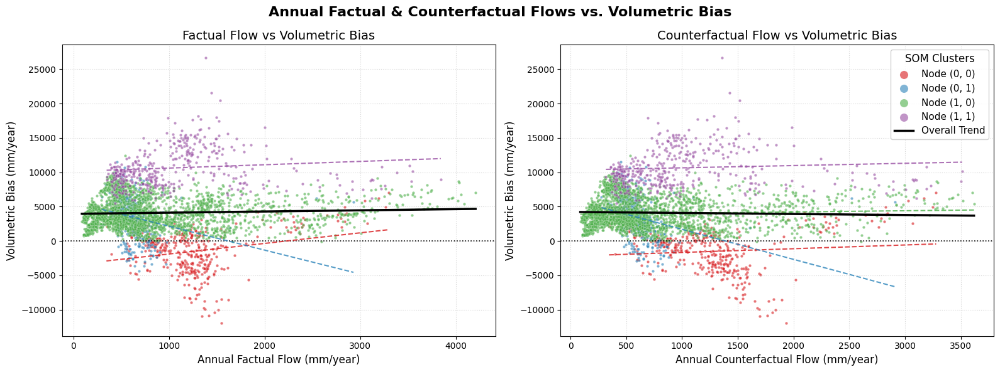


Loading climate data and calculating yearly metrics...
Successfully matched climate data for 3655 station-years.
Generating Volumetric Bias vs Climate scatter plots...


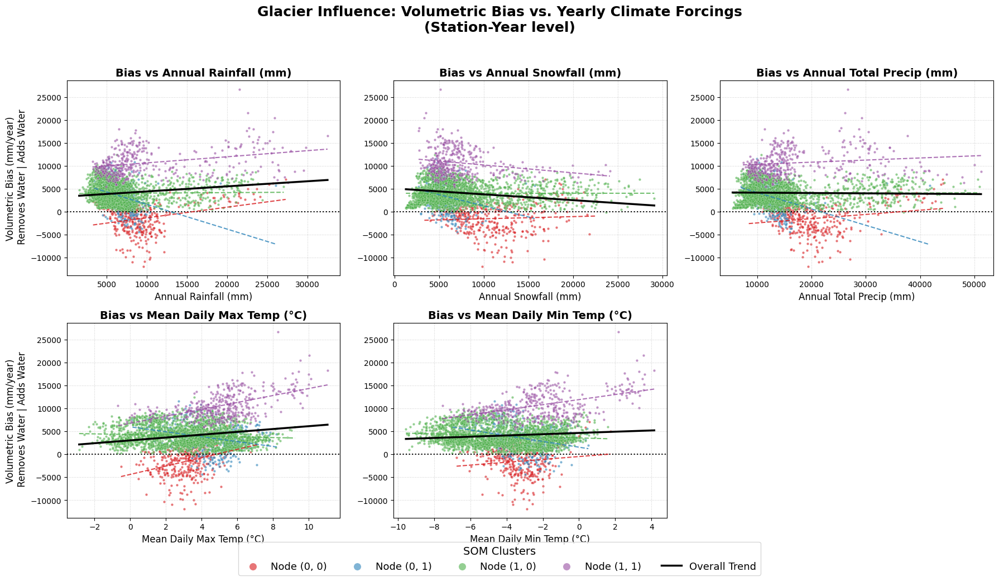

Generating Flow minus Precipitation vs. Volumetric Bias plots...


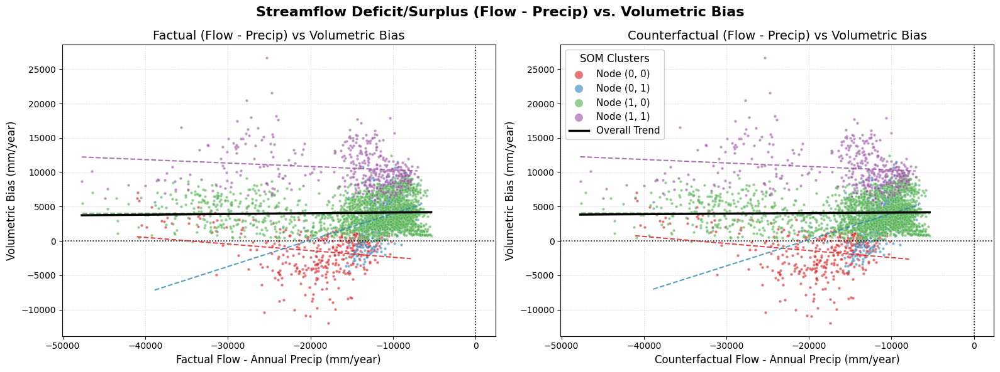

In [100]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings

from src.config import PROCESSED_DATA_DIR, RAW_DATA_DIR, CLIMATE_OUTPUT_DIR

warnings.filterwarnings('ignore')

# =========================================================
# Helper Function for Trendlines
# =========================================================
def add_trendline(ax, x, y, color, linestyle='--', linewidth=1.5, label=None, alpha=0.8):
    """Calculates and plots a linear trendline, ignoring NaNs."""
    x = np.asarray(x)
    y = np.asarray(y)
    valid_idx = np.isfinite(x) & np.isfinite(y)
    
    if np.sum(valid_idx) > 1:
        z = np.polyfit(x[valid_idx], y[valid_idx], 1)
        p = np.poly1d(z)
        x_range = np.array([np.min(x[valid_idx]), np.max(x[valid_idx])])
        ax.plot(x_range, p(x_range), color=color, linestyle=linestyle, linewidth=linewidth, label=label, alpha=alpha, zorder=3)

# =========================================================
# 1. Load Data & Find Dominant Cluster per Station
# =========================================================
print("Loading SOM cluster assignments and spatial metadata...")

# Load the cluster labels we exported from the SOM script
df_clusters = pd.read_csv(PROCESSED_DATA_DIR / "som_bias_clusters_final.csv")

# Calculate the dominant (mode) cluster for each station across all years
df_dominant = df_clusters.groupby('Station')['Cluster'].agg(lambda x: x.mode()[0]).reset_index()

# Clean the SOM Station IDs: force string, remove whitespace, make uppercase
df_dominant['Station'] = df_dominant['Station'].astype(str).str.strip().str.upper()

# Load the raw station metadata
df_geo = pd.read_csv(RAW_DATA_DIR / "station_metadata.csv", index_col=0)

# Clean the Metadata Station IDs
df_geo.index = df_geo.index.astype(str).str.strip().str.upper()

# Merge directly on the index
df_map = pd.merge(df_dominant, df_geo, left_on='Station', right_index=True, how='inner')

if len(df_map) == 0:
    print("\n--- DIAGNOSTIC DATA ---")
    print("SOM Stations (First 5):", df_dominant['Station'].head().tolist())
    print("Metadata Stations (First 5):", df_geo.index.tolist()[:5])
    raise ValueError("Merge resulted in 0 stations. Check the diagnostic print above.")

print(f"Successfully mapped {len(df_map)} distinct glaciated stations.")

# Base dataframe for climate merge later
df_meta = df_map.copy()

# =========================================================
# 2. Calculate Volume, Timing Biases & Flow Metrics
# =========================================================
print("Calculating volume, timing biases, and total flows...")

# NOTE: Assumes X (Bias), P (Factual Flow), N (Counterfactual Flow), 
# and labels (SOM clusters corresponding to arrays) are already loaded in the environment.
days = np.arange(1, 366)

# 1. Volumetric Bias: Total Annual Specific Glacier Yield (mm/year)
annual_vol_bias = np.sum(X, axis=1)

# 2. Annual Flows: Factual and Counterfactual Totals
annual_factual_flow = np.sum(P, axis=1)
annual_counterfactual_flow = np.sum(N, axis=1)

# 3. Timing Shift: Difference in Center of Mass (Days)
com_p = np.sum(P * days, axis=1) / np.sum(P, axis=1)
com_n = np.sum(N * days, axis=1) / np.sum(N, axis=1)

# Positive value = Factual (Glaciated) runoff happens LATER than Counterfactual
delta_com = com_p - com_n 

cluster_colors = {
    0: '#d7191c',  1: '#2b83ba',  2: '#4daf4a',  3: '#984ea3'
}

# =========================================================
# 3. Regime Shift Scatter Plot (Volume vs. Timing Bias)
# =========================================================
print("Generating Volume vs. Timing Scatter Plot...")

fig, ax = plt.subplots(figsize=(12, 8))
fig.suptitle("Glacier Influence on Runoff Volume & Timing", fontsize=16, fontweight='bold')

for i in range(4):
    mask = (labels == i)
    qx, qy = i // 2, i % 2
    
    ax.scatter(
        delta_com[mask], 
        annual_vol_bias[mask], 
        color=cluster_colors[i], 
        alpha=0.6,           
        edgecolors='white', 
        linewidths=0.2,      
        s=10,                # Reduced dot size
        label=f'Node ({qx}, {qy}) [N={np.sum(mask)}]'
    )
    
    # Add Cluster Trendline
    add_trendline(ax, delta_com[mask], annual_vol_bias[mask], color=cluster_colors[i], linestyle='--')

# Add Overall Trendline
add_trendline(ax, delta_com, annual_vol_bias, color='black', linestyle='-', linewidth=2.5, label='Overall Trend', alpha=1.0)

ax.axhline(0, color='black', linewidth=1.2, linestyle=':')
ax.axvline(0, color='black', linewidth=1.2, linestyle=':')

props = dict(boxstyle='square,pad=0.4', facecolor='white', alpha=0.85, edgecolor='none')
ax.text(0.98, 0.97, 'Delayed Runoff\n+ Added Volume', transform=ax.transAxes, fontsize=10, fontweight='bold', color='#2ca02c', va='top', ha='right', bbox=props)
ax.text(0.02, 0.97, 'Earlier Runoff\n+ Added Volume', transform=ax.transAxes, fontsize=10, fontweight='bold', color='#ff7f0e', va='top', ha='left', bbox=props)

ax.set_xlabel("Timing Shift: $\Delta$ Center of Mass (Days)\n Accelerates Runoff | Delays Runoff", fontsize=12)
ax.set_ylabel("Volumetric Bias: Annual Yield (mm/year)\n Removes Water | Adds Water", fontsize=12)
ax.grid(True, linestyle=':', alpha=0.5)
ax.legend(title="SOM Clusters", loc='lower right', fontsize=11, title_fontsize=12, framealpha=0.9, markerscale=3)

plt.tight_layout()
plt.show()

# =========================================================
# 4. Factual & Counterfactual Flow vs. Volumetric Bias
# =========================================================
print("Generating Flow vs. Volumetric Bias plots...")

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle("Annual Factual & Counterfactual Flows vs. Volumetric Bias", fontsize=16, fontweight='bold')

for i in range(4):
    mask = (labels == i)
    qx, qy = i // 2, i % 2
    
    # Plot 1: Factual Flow vs Bias
    axes[0].scatter(
        annual_factual_flow[mask], annual_vol_bias[mask], 
        color=cluster_colors[i], alpha=0.6, edgecolors='white', linewidths=0.2, s=10,
        label=f'Node ({qx}, {qy})'
    )
    # Cluster Trendline (Factual)
    add_trendline(axes[0], annual_factual_flow[mask], annual_vol_bias[mask], color=cluster_colors[i])
    
    # Plot 2: Counterfactual Flow vs Bias
    axes[1].scatter(
        annual_counterfactual_flow[mask], annual_vol_bias[mask], 
        color=cluster_colors[i], alpha=0.6, edgecolors='white', linewidths=0.2, s=10,
        label=f'Node ({qx}, {qy})'
    )
    # Cluster Trendline (Counterfactual)
    add_trendline(axes[1], annual_counterfactual_flow[mask], annual_vol_bias[mask], color=cluster_colors[i])

# Add Overall Trendlines
add_trendline(axes[0], annual_factual_flow, annual_vol_bias, color='black', linestyle='-', linewidth=2.5, label='Overall Trend', alpha=1.0)
add_trendline(axes[1], annual_counterfactual_flow, annual_vol_bias, color='black', linestyle='-', linewidth=2.5, label='Overall Trend', alpha=1.0)

for ax, title, xlabel in zip(axes, 
                             ["Factual Flow vs Volumetric Bias", "Counterfactual Flow vs Volumetric Bias"],
                             ["Annual Factual Flow (mm/year)", "Annual Counterfactual Flow (mm/year)"]):
    ax.axhline(0, color='black', linewidth=1.2, linestyle=':')
    ax.set_title(title, fontsize=14)
    ax.set_xlabel(xlabel, fontsize=12)
    ax.set_ylabel("Volumetric Bias (mm/year)", fontsize=12)
    ax.grid(True, linestyle=':', alpha=0.5)

axes[1].legend(title="SOM Clusters", loc='best', fontsize=11, title_fontsize=12, framealpha=0.9, markerscale=3)
plt.tight_layout()
plt.show()

# =========================================================
# 5. Extract and Aggregate Yearly Climate Forcings
# =========================================================
print("\nLoading climate data and calculating yearly metrics...")

# Attach the bias AND flow arrays to df_clusters (which has 3655 rows: Station-Years)
df_clusters['annual_vol_bias'] = np.sum(X, axis=1)
df_clusters['annual_factual_flow'] = np.sum(P, axis=1)
df_clusters['annual_counterfactual_flow'] = np.sum(N, axis=1)

# Ensure station IDs are perfectly formatted for merging
df_clusters['Station'] = df_clusters['Station'].astype(str).str.strip().str.upper()

# Required for filtering columns
glac_stations = df_clusters['Station'].unique().tolist() 

climate_files = {
    'daily_rainfall.csv': {'name': 'Annual Rainfall (mm)', 'agg': 'sum'},
    'daily_snowfall.csv': {'name': 'Annual Snowfall (mm)', 'agg': 'sum'},
    'daily_precipitation.csv': {'name': 'Annual Total Precip (mm)', 'agg': 'sum'},
    'daily_temp_max.csv': {'name': 'Mean Daily Max Temp (°C)', 'agg': 'mean'},
    'daily_temp_min.csv': {'name': 'Mean Daily Min Temp (°C)', 'agg': 'mean'}
}

climate_data_list = []

for file_name, props in climate_files.items():
    file_path = CLIMATE_OUTPUT_DIR / file_name
    
    if not file_path.exists():
        print(f"  -> Warning: {file_name} not found. Skipping.")
        continue
        
    df_clim = pd.read_csv(file_path, index_col=0, parse_dates=True)
    
    # Filter only for the glaciated stations we care about
    valid_cols = [c for c in df_clim.columns if str(c).strip().upper() in glac_stations]
    df_clim = df_clim[valid_cols]
    
    # Aggregate to Yearly values
    if props['agg'] == 'sum':
        df_yearly = df_clim.groupby(df_clim.index.year).sum()
    else:
        df_yearly = df_clim.groupby(df_clim.index.year).mean()
        
    # Stack the dataframe so it has columns: [Year, Station, Value]
    df_stacked = df_yearly.stack().reset_index()
    df_stacked.columns = ['Year', 'Station', props['name']]
    df_stacked['Station'] = df_stacked['Station'].astype(str).str.strip().str.upper()
    
    climate_data_list.append(df_stacked)

if climate_data_list:
    df_climate_master = climate_data_list[0]
    for i in range(1, len(climate_data_list)):
        df_climate_master = pd.merge(df_climate_master, climate_data_list[i], on=['Year', 'Station'], how='outer')

    # Merge the master climate dataframe with df_clusters (which holds Year, Station, Flows, and Bias)
    plot_df = pd.merge(df_clusters, df_climate_master, on=['Year', 'Station'], how='inner')
    print(f"Successfully matched climate data for {len(plot_df)} station-years.")
    
    # Calculate Flow - Precipitation metrics if Precipitation was loaded
    if 'Annual Total Precip (mm)' in plot_df.columns:
        plot_df['factual_minus_precip'] = plot_df['annual_factual_flow'] - plot_df['Annual Total Precip (mm)']
        plot_df['counterfactual_minus_precip'] = plot_df['annual_counterfactual_flow'] - plot_df['Annual Total Precip (mm)']
    else:
        print("Warning: 'Annual Total Precip (mm)' not found in plot_df. Cannot calculate Flow - Precip metrics.")

else:
    raise FileNotFoundError("No climate files were processed successfully.")

# =========================================================
# 6. Plotting: Volumetric Bias vs. Climate Forcings
# =========================================================
print("Generating Volumetric Bias vs Climate scatter plots...")

available_clim_vars = [props['name'] for props in climate_files.values() if props['name'] in plot_df.columns]
num_vars = len(available_clim_vars)

cols = 3
rows = int(np.ceil(num_vars / cols))
fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows))
fig.suptitle("Glacier Influence: Volumetric Bias vs. Yearly Climate Forcings\n(Station-Year level)", fontsize=18, fontweight='bold', y=0.98)

if rows * cols == 1:
    axes = [axes]
else:
    axes = axes.flatten()

grid_y = 2

for i, var_name in enumerate(available_clim_vars):
    ax = axes[i]
    
    for cluster_id in range(4):
        subset = plot_df[plot_df['Cluster'] == cluster_id]
        qx, qy = cluster_id // grid_y, cluster_id % grid_y
        
        ax.scatter(
            subset[var_name], 
            subset['annual_vol_bias'], 
            color=cluster_colors[cluster_id], 
            alpha=0.6,           
            edgecolors='white', 
            linewidths=0.2,      
            s=10,                # Reduced dot size
            label=f'Node ({qx}, {qy})' if i == 0 else "" 
        )
        
        # Add Cluster Trendline
        add_trendline(ax, subset[var_name], subset['annual_vol_bias'], color=cluster_colors[cluster_id])
        
    # Add Overall Trendline
    add_trendline(ax, plot_df[var_name], plot_df['annual_vol_bias'], color='black', linestyle='-', linewidth=2.5, label='Overall Trend' if i == 0 else None, alpha=1.0)

    ax.axhline(0, color='black', linewidth=1.5, linestyle=':')
    ax.set_title(f"Bias vs {var_name}", fontsize=14, fontweight='bold')
    ax.set_xlabel(var_name, fontsize=12)
    
    if i % cols == 0:
        ax.set_ylabel("Volumetric Bias (mm/year)\n Removes Water | Adds Water", fontsize=12)
        
    ax.grid(True, linestyle=':', alpha=0.6)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.legend(title="SOM Clusters", loc='lower center', ncol=5, fontsize=13, title_fontsize=14, bbox_to_anchor=(0.5, -0.05), markerscale=3)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# =========================================================
# 7. Plotting: Volumetric Bias vs. (Streamflow - Precipitation)
# =========================================================
if 'factual_minus_precip' in plot_df.columns:
    print("Generating Flow minus Precipitation vs. Volumetric Bias plots...")

    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle("Streamflow Deficit/Surplus (Flow - Precip) vs. Volumetric Bias", fontsize=16, fontweight='bold')

    for i in range(4):
        subset = plot_df[plot_df['Cluster'] == i]
        qx, qy = i // 2, i % 2
        
        # Plot 1: Factual Flow - Precip vs Bias
        axes[0].scatter(
            subset['factual_minus_precip'], subset['annual_vol_bias'], 
            color=cluster_colors[i], alpha=0.6, edgecolors='white', linewidths=0.2, s=10,
            label=f'Node ({qx}, {qy})'
        )
        # Cluster Trendline
        add_trendline(axes[0], subset['factual_minus_precip'], subset['annual_vol_bias'], color=cluster_colors[i])
        
        # Plot 2: Counterfactual Flow - Precip vs Bias
        axes[1].scatter(
            subset['counterfactual_minus_precip'], subset['annual_vol_bias'], 
            color=cluster_colors[i], alpha=0.6, edgecolors='white', linewidths=0.2, s=10,
            label=f'Node ({qx}, {qy})'
        )
        # Cluster Trendline
        add_trendline(axes[1], subset['counterfactual_minus_precip'], subset['annual_vol_bias'], color=cluster_colors[i])

    # Add Overall Trendlines
    add_trendline(axes[0], plot_df['factual_minus_precip'], plot_df['annual_vol_bias'], color='black', linestyle='-', linewidth=2.5, label='Overall Trend', alpha=1.0)
    add_trendline(axes[1], plot_df['counterfactual_minus_precip'], plot_df['annual_vol_bias'], color='black', linestyle='-', linewidth=2.5, label='Overall Trend', alpha=1.0)

    for ax, title, xlabel in zip(axes, 
                                 ["Factual (Flow - Precip) vs Volumetric Bias", "Counterfactual (Flow - Precip) vs Volumetric Bias"],
                                 ["Factual Flow - Annual Precip (mm/year)", "Counterfactual Flow - Annual Precip (mm/year)"]):
        
        # Add zero-lines for context
        ax.axhline(0, color='black', linewidth=1.2, linestyle=':')
        ax.axvline(0, color='black', linewidth=1.2, linestyle=':')
        
        ax.set_title(title, fontsize=14)
        ax.set_xlabel(xlabel, fontsize=12)
        ax.set_ylabel("Volumetric Bias (mm/year)", fontsize=12)
        ax.grid(True, linestyle=':', alpha=0.5)

    axes[1].legend(title="SOM Clusters", loc='best', fontsize=11, title_fontsize=12, framealpha=0.9, markerscale=3)
    plt.tight_layout()
    plt.show()
else:
    print("Skipping Flow - Precipitation plots because Precipitation data was not available.")

Loading data and calculating ensemble means...
Calculating August metrics in both Glacier and Basin units...
Loading SOM clusters...
Generating August Flow vs. Volumetric Bias plots...


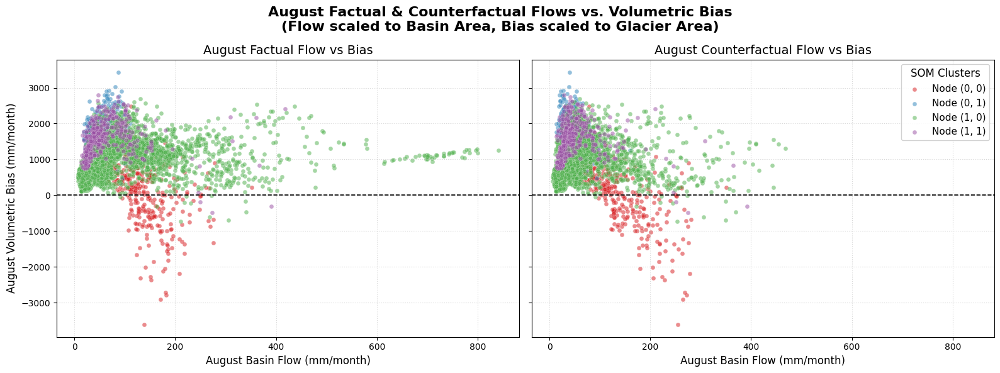


Loading climate data and calculating August metrics...
Successfully matched climate data for 3655 station-years.
Generating August Volumetric Bias vs Climate scatter plots...


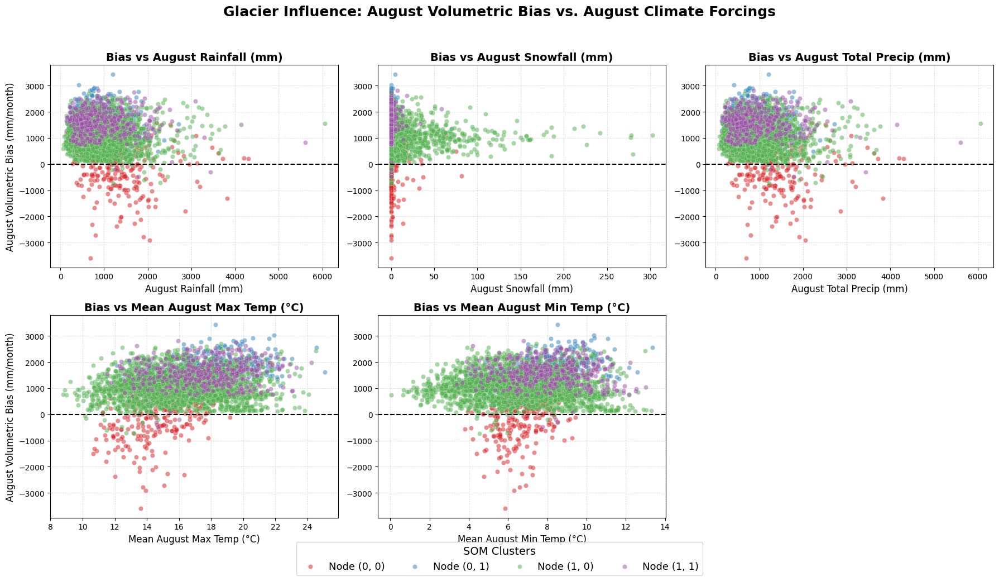

Generating Flow minus Precipitation vs. Volumetric Bias plots...


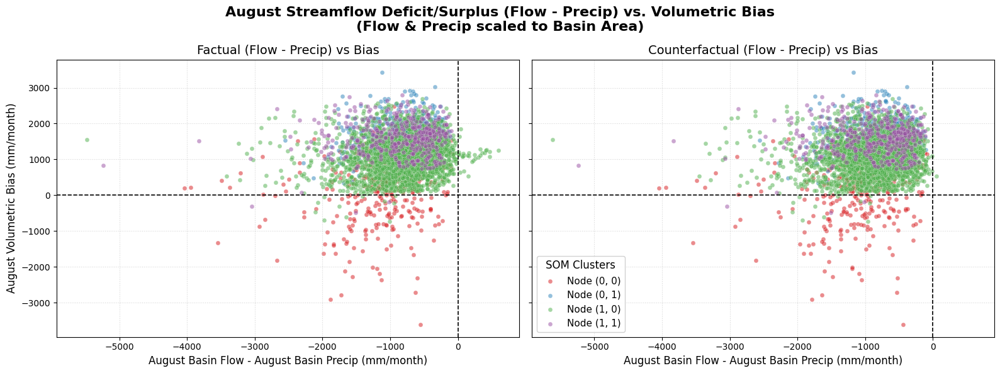

In [69]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings

from src.config import PROCESSED_DATA_DIR, RAW_DATA_DIR, CLIMATE_OUTPUT_DIR, OUTPUT_DATA_DIR

warnings.filterwarnings('ignore')

# =========================================================
# 1. Load Data & Calculate Ensemble Means
# =========================================================
print("Loading data and calculating ensemble means...")

with open(PROCESSED_DATA_DIR / "valid_glaciated_stations.txt", "r") as f:
    glac_stations = [line.strip() for line in f.readlines()]

ensemble_dir = OUTPUT_DATA_DIR / "phase_split"

# Load static attributes to get the glacier AND basin areas
df_attr = pd.read_csv(PROCESSED_DATA_DIR / "static_attributes.csv", index_col=0)

template = pd.read_csv(ensemble_dir / "phase-split_preds_member_0.csv", index_col=0, parse_dates=True)
test_dates = template.index
glac_stations = [s for s in glac_stations if s in template.columns]

pred_list, noglac_list = [], []
for i in range(10):
    pred_list.append(pd.read_csv(ensemble_dir / f"phase-split_preds_member_{i}.csv", index_col=0, parse_dates=True)[glac_stations])
    noglac_list.append(pd.read_csv(ensemble_dir / f"phase-split_preds_noglacier_member_{i}.csv", index_col=0, parse_dates=True)[glac_stations])

df_pred = sum(pred_list) / 10
df_noglac = sum(noglac_list) / 10

# =========================================================
# 2. Extract August Flow Metrics (Dual Unit Representation)
# =========================================================
print("Calculating August metrics in both Glacier and Basin units...")

years = np.unique(test_dates.year)
aug_start = 212  # Day 213 (August 1st in non-leap year)
aug_end = 243    # Day 244 (August 31st)

records = []

for year in years:
    mask = test_dates.year == year
    pred_year = df_pred[mask]
    noglac_year = df_noglac[mask]
    
    for stat in glac_stations:
        if stat not in df_attr.index: continue
        basin_area = df_attr.loc[stat, 'basin_area_km2']
        glac_area = df_attr.loc[stat, 'glacier_area_km2']
        
        if pd.isna(glac_area) or glac_area <= 0 or pd.isna(basin_area) or basin_area <= 0: 
            continue
            
        p_vals = pred_year[stat].values
        n_vals = noglac_year[stat].values
        
        if len(p_vals) == 366: p_vals = p_vals[:-1]
        if len(n_vals) == 366: n_vals = n_vals[:-1]
            
        if len(p_vals) == 365 and len(n_vals) == 365:
            # 1. BASIN UNITS (Raw model output)
            p_basin = p_vals
            n_basin = n_vals
            
            # 2. GLACIER UNITS (Scaled to glacier fraction)
            p_glac = p_vals * (basin_area / glac_area)
            n_glac = n_vals * (basin_area / glac_area)
            
            # Volumetric Bias is calculated in Glacier Units
            x_glac = p_glac - n_glac
            
            # Apply original sample exclusion filter
            if np.nanmax(x_glac) > 0.01:
                records.append({
                    'Station': stat,
                    'Year': year,
                    'aug_vol_bias': np.sum(x_glac[aug_start:aug_end]),
                    'aug_factual_flow_glac': np.sum(p_glac[aug_start:aug_end]),
                    'aug_counterfactual_flow_glac': np.sum(n_glac[aug_start:aug_end]),
                    'aug_factual_flow_basin': np.sum(p_basin[aug_start:aug_end]),
                    'aug_counterfactual_flow_basin': np.sum(n_basin[aug_start:aug_end])
                })

# Convert to dataframe for safe merging
df_flow = pd.DataFrame(records)
df_flow['Station'] = df_flow['Station'].astype(str).str.strip().str.upper()

# =========================================================
# 3. Load SOM Clusters & Merge with Flow Data
# =========================================================
print("Loading SOM clusters...")
df_clusters = pd.read_csv(PROCESSED_DATA_DIR / "som_bias_clusters_final.csv")
df_clusters['Station'] = df_clusters['Station'].astype(str).str.strip().str.upper()

# Merge flows with cluster assignments
plot_df = pd.merge(df_clusters, df_flow, on=['Station', 'Year'], how='inner')

cluster_colors = {
    0: '#d7191c',  1: '#2b83ba',  2: '#4daf4a',  3: '#984ea3'
}

# =========================================================
# 4. Factual & Counterfactual Flow vs. Volumetric Bias (August)
# =========================================================
print("Generating August Flow vs. Volumetric Bias plots...")

fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharex=True, sharey=True)
fig.suptitle("August Factual & Counterfactual Flows vs. Volumetric Bias\n(Flow scaled to Basin Area, Bias scaled to Glacier Area)", fontsize=16, fontweight='bold')

for i in range(4):
    subset = plot_df[plot_df['Cluster'] == i]
    qx, qy = i // 2, i % 2
    
    # UPDATE: Now plotting aug_factual_flow_basin
    axes[0].scatter(
        subset['aug_factual_flow_basin'], subset['aug_vol_bias'], 
        color=cluster_colors[i], alpha=0.5, edgecolors='white', linewidths=0.3, s=25,
        label=f'Node ({qx}, {qy})'
    )
    
    # UPDATE: Now plotting aug_counterfactual_flow_basin
    axes[1].scatter(
        subset['aug_counterfactual_flow_basin'], subset['aug_vol_bias'], 
        color=cluster_colors[i], alpha=0.5, edgecolors='white', linewidths=0.3, s=25,
        label=f'Node ({qx}, {qy})'
    )

for ax, title, xlabel in zip(axes, 
                             ["August Factual Flow vs Bias", "August Counterfactual Flow vs Bias"],
                             ["August Basin Flow (mm/month)", "August Basin Flow (mm/month)"]):
    ax.axhline(0, color='black', linewidth=1.2, linestyle='--')
    ax.set_title(title, fontsize=14)
    ax.set_xlabel(xlabel, fontsize=12)
    ax.grid(True, linestyle=':', alpha=0.5)

axes[0].set_ylabel("August Volumetric Bias (mm/month)", fontsize=12)
axes[1].legend(title="SOM Clusters", loc='best', fontsize=11, title_fontsize=12, framealpha=0.9)
plt.tight_layout()
plt.show()

# =========================================================
# 5. Extract and Aggregate August Climate Forcings
# =========================================================
print("\nLoading climate data and calculating August metrics...")

glac_stations = plot_df['Station'].unique().tolist() 

climate_files = {
    'daily_rainfall.csv': {'name': 'August Rainfall (mm)', 'agg': 'sum'},
    'daily_snowfall.csv': {'name': 'August Snowfall (mm)', 'agg': 'sum'},
    'daily_precipitation.csv': {'name': 'August Total Precip (mm)', 'agg': 'sum'},
    'daily_temp_max.csv': {'name': 'Mean August Max Temp (°C)', 'agg': 'mean'},
    'daily_temp_min.csv': {'name': 'Mean August Min Temp (°C)', 'agg': 'mean'}
}

climate_data_list = []

for file_name, props in climate_files.items():
    file_path = CLIMATE_OUTPUT_DIR / file_name
    
    if not file_path.exists():
        print(f"  -> Warning: {file_name} not found. Skipping.")
        continue
        
    df_clim = pd.read_csv(file_path, index_col=0, parse_dates=True)
    
    # Filter only for the glaciated stations we care about
    valid_cols = [c for c in df_clim.columns if str(c).strip().upper() in glac_stations]
    df_clim = df_clim[valid_cols]
    
    # FILTER FOR AUGUST ONLY
    df_august = df_clim[df_clim.index.month == 8]
    
    # Aggregate (Sum/Mean)
    if props['agg'] == 'sum':
        df_yearly = df_august.groupby(df_august.index.year).sum()
    else:
        df_yearly = df_august.groupby(df_august.index.year).mean()
        
    # Stack the dataframe
    df_stacked = df_yearly.stack().reset_index()
    df_stacked.columns = ['Year', 'Station', props['name']]
    df_stacked['Station'] = df_stacked['Station'].astype(str).str.strip().str.upper()
    
    climate_data_list.append(df_stacked)

if climate_data_list:
    df_climate_master = climate_data_list[0]
    for i in range(1, len(climate_data_list)):
        df_climate_master = pd.merge(df_climate_master, climate_data_list[i], on=['Year', 'Station'], how='outer')

    # Merge Climate Data with our existing plot_df
    plot_df = pd.merge(plot_df, df_climate_master, on=['Year', 'Station'], how='inner')
    print(f"Successfully matched climate data for {len(plot_df)} station-years.")
    
    # CALCULATION CORRECTION: Use BASIN flow units to subtract BASIN precipitation
    if 'August Total Precip (mm)' in plot_df.columns:
        plot_df['factual_minus_precip'] = plot_df['aug_factual_flow_basin'] - plot_df['August Total Precip (mm)']
        plot_df['counterfactual_minus_precip'] = plot_df['aug_counterfactual_flow_basin'] - plot_df['August Total Precip (mm)']
    else:
        print("Warning: 'August Total Precip (mm)' not found. Cannot calculate Flow - Precip metrics.")
else:
    raise FileNotFoundError("No climate files were processed successfully.")

# =========================================================
# 6. Plotting: August Volumetric Bias vs. Climate Forcings
# =========================================================
print("Generating August Volumetric Bias vs Climate scatter plots...")

available_clim_vars = [props['name'] for props in climate_files.values() if props['name'] in plot_df.columns]
num_vars = len(available_clim_vars)

cols = 3
rows = int(np.ceil(num_vars / cols))
fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows))
fig.suptitle("Glacier Influence: August Volumetric Bias vs. August Climate Forcings", fontsize=18, fontweight='bold', y=0.98)

if rows * cols == 1: axes = [axes]
else: axes = axes.flatten()

for i, var_name in enumerate(available_clim_vars):
    ax = axes[i]
    
    for cluster_id in range(4):
        subset = plot_df[plot_df['Cluster'] == cluster_id]
        qx, qy = cluster_id // 2, cluster_id % 2
        
        ax.scatter(
            subset[var_name], 
            subset['aug_vol_bias'], 
            color=cluster_colors[cluster_id], 
            alpha=0.5,           
            edgecolors='white', 
            linewidths=0.3,      
            s=35,                
            label=f'Node ({qx}, {qy})' if i == 0 else "" 
        )

    ax.axhline(0, color='black', linewidth=1.5, linestyle='--')
    ax.set_title(f"Bias vs {var_name}", fontsize=14, fontweight='bold')
    ax.set_xlabel(var_name, fontsize=12)
    
    if i % cols == 0:
        ax.set_ylabel("August Volumetric Bias (mm/month)", fontsize=12)
        
    ax.grid(True, linestyle=':', alpha=0.6)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.legend(title="SOM Clusters", loc='lower center', ncol=4, fontsize=13, title_fontsize=14, bbox_to_anchor=(0.5, -0.05))
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# =========================================================
# 7. Plotting: August Volumetric Bias vs. (Streamflow - Precipitation)
# =========================================================
if 'factual_minus_precip' in plot_df.columns:
    print("Generating Flow minus Precipitation vs. Volumetric Bias plots...")

    fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharex=True, sharey=True)
    fig.suptitle("August Streamflow Deficit/Surplus (Flow - Precip) vs. Volumetric Bias\n(Flow & Precip scaled to Basin Area)", fontsize=16, fontweight='bold')

    for i in range(4):
        subset = plot_df[plot_df['Cluster'] == i]
        qx, qy = i // 2, i % 2
        
        axes[0].scatter(
            subset['factual_minus_precip'], subset['aug_vol_bias'], 
            color=cluster_colors[i], alpha=0.5, edgecolors='white', linewidths=0.3, s=25,
            label=f'Node ({qx}, {qy})'
        )
        
        axes[1].scatter(
            subset['counterfactual_minus_precip'], subset['aug_vol_bias'], 
            color=cluster_colors[i], alpha=0.5, edgecolors='white', linewidths=0.3, s=25,
            label=f'Node ({qx}, {qy})'
        )

    for ax, title, xlabel in zip(axes, 
                                 ["Factual (Flow - Precip) vs Bias", "Counterfactual (Flow - Precip) vs Bias"],
                                 ["August Basin Flow - August Basin Precip (mm/month)", "August Basin Flow - August Basin Precip (mm/month)"]):
        
        ax.axhline(0, color='black', linewidth=1.2, linestyle='--')
        ax.axvline(0, color='black', linewidth=1.2, linestyle='--')
        
        ax.set_title(title, fontsize=14)
        ax.set_xlabel(xlabel, fontsize=12)
        ax.grid(True, linestyle=':', alpha=0.5)

    axes[0].set_ylabel("August Volumetric Bias (mm/month)", fontsize=12)
    axes[1].legend(title="SOM Clusters", loc='best', fontsize=11, title_fontsize=12, framealpha=0.9)
    plt.tight_layout()
    plt.show()

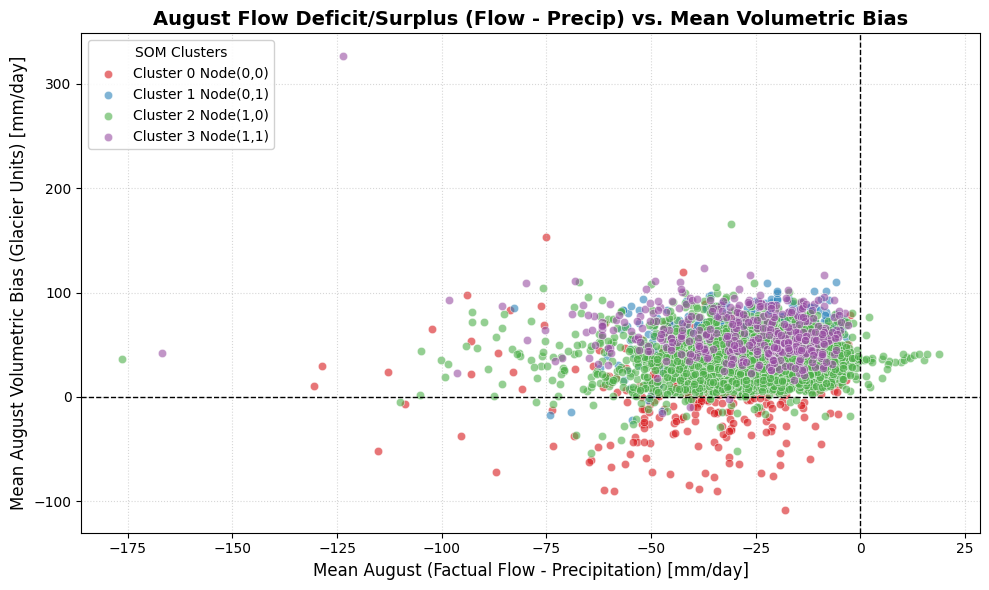

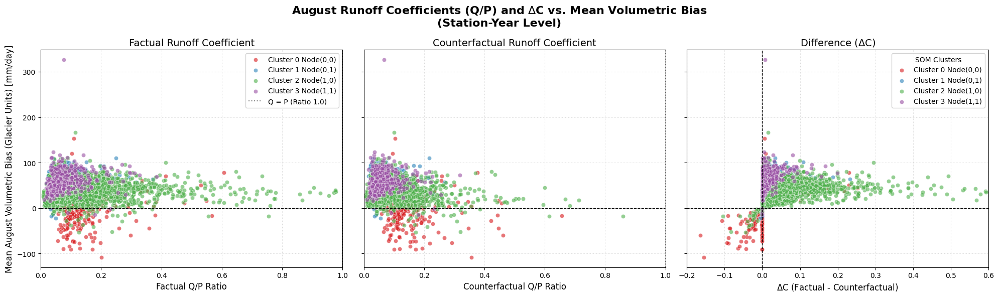

In [90]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from src.config import OUTPUT_DATA_DIR, CLIMATE_OUTPUT_DIR, PROCESSED_DATA_DIR

# =========================================================
# 1. Load Data
# =========================================================
q_glac = pd.read_csv(OUTPUT_DATA_DIR / "phase_split/phase-split_preds_member_0.csv", index_col=0, parse_dates=True)
q_noglac = pd.read_csv(OUTPUT_DATA_DIR / "phase_split/phase-split_preds_noglacier_member_0.csv", index_col=0, parse_dates=True)
precip = pd.read_csv(CLIMATE_OUTPUT_DIR / "daily_precipitation.csv", index_col=0, parse_dates=True)

static_atbs = pd.read_csv(PROCESSED_DATA_DIR / "static_attributes.csv", index_col=0)
static_atbs.index = static_atbs.index.astype(str).str.strip().str.upper()

delta_q = q_glac - q_noglac

# Align stations across datasets
station_list = delta_q.columns.tolist()
valid_precip_cols = [s for s in station_list if s in precip.columns]
precip = precip[valid_precip_cols]

# =========================================================
# 2. Filter for August & Aggregate by Station-Year
# =========================================================
# Filter to August only
q_glac_aug = q_glac[q_glac.index.month == 8]
q_noglac_aug = q_noglac[q_noglac.index.month == 8]
delta_q_aug = delta_q[delta_q.index.month == 8]
precip_aug = precip[precip.index.month == 8]

# Calculate the mean for each August, per year, then flatten into a tabular format
df_q = q_glac_aug.groupby(q_glac_aug.index.year).mean().stack().reset_index()
df_q.columns = ['Year', 'Station', 'q_glac_mean']

df_noglac = q_noglac_aug.groupby(q_noglac_aug.index.year).mean().stack().reset_index()
df_noglac.columns = ['Year', 'Station', 'q_noglac_mean']

df_delta = delta_q_aug.groupby(delta_q_aug.index.year).mean().stack().reset_index()
df_delta.columns = ['Year', 'Station', 'delta_q_mean']

df_precip = precip_aug.groupby(precip_aug.index.year).mean().stack().reset_index()
df_precip.columns = ['Year', 'Station', 'precip_mean']

# Merge all the yearly metrics together
df_yearly = pd.merge(df_q, df_noglac, on=['Year', 'Station'], how='inner')
df_yearly = pd.merge(df_yearly, df_delta, on=['Year', 'Station'], how='inner')
df_yearly = pd.merge(df_yearly, df_precip, on=['Year', 'Station'], how='inner')
df_yearly['Station'] = df_yearly['Station'].astype(str).str.strip().str.upper()

# =========================================================
# 3. Apply Static Attributes & Unit Conversions
# =========================================================
# Filter for glaciated stations only
is_glaciated = static_atbs[static_atbs['glacier_area_km2'] > 0]
df_yearly = df_yearly[df_yearly['Station'].isin(is_glaciated.index)]

# Map area attributes to the yearly dataframe
df_yearly['glacier_area'] = df_yearly['Station'].map(static_atbs['glacier_area_km2'])
df_yearly['basin_area'] = df_yearly['Station'].map(static_atbs['basin_area_km2'])

# Metrics: Flow minus Precipitation (Q - P)
df_yearly['q_minus_p'] = df_yearly['q_glac_mean'] - df_yearly['precip_mean']

# Metrics: Runoff Coefficients (Q / P) & Delta C
# Prevent division by zero if precipitation is exactly 0
df_yearly['precip_safe'] = df_yearly['precip_mean'].replace(0, np.nan)
df_yearly['runoff_coeff_factual'] = df_yearly['q_glac_mean'] / df_yearly['precip_safe']
df_yearly['runoff_coeff_counterfactual'] = df_yearly['q_noglac_mean'] / df_yearly['precip_safe']

# Delta C: Difference in runoff efficiency caused by the glacier
df_yearly['delta_c'] = df_yearly['runoff_coeff_factual'] - df_yearly['runoff_coeff_counterfactual']

# Scale delta Q by glacier area to get it in "glacier units"
df_yearly['delta_q_glac_units'] = df_yearly['delta_q_mean'] * (df_yearly['basin_area'] / df_yearly['glacier_area'])

# =========================================================
# 4. Load Clusters & Merge
# =========================================================
df_clusters = pd.read_csv(PROCESSED_DATA_DIR / "som_bias_clusters_final.csv")
df_clusters['Station'] = df_clusters['Station'].astype(str).str.strip().str.upper()

# Inner merge to attach the cluster labels to our Station-Year rows
plot_df = pd.merge(df_yearly, df_clusters, on=['Station', 'Year'], how='inner')

# =========================================================
# 5. Plotting
# =========================================================
cluster_colors = {
    0: '#d7191c',  
    1: '#2b83ba',  
    2: '#4daf4a',  
    3: '#984ea3'   
}

# --- PLOT 1: Flow Deficit/Surplus (Q - P) ---
plt.figure(figsize=(10, 6))

for cluster_id, color in cluster_colors.items():
    subset = plot_df[plot_df['Cluster'] == cluster_id]
    qx, qy = cluster_id // 2, cluster_id % 2
    
    plt.scatter(
        subset['q_minus_p'], 
        subset['delta_q_glac_units'], 
        color=color, 
        alpha=0.6, 
        edgecolors='white', 
        linewidths=0.5,
        label=f'Cluster {cluster_id} Node({qx},{qy})'
    )

plt.axhline(0, color='black', linestyle='--', linewidth=1)
plt.axvline(0, color='black', linestyle='--', linewidth=1)
plt.title("August Flow Deficit/Surplus (Flow - Precip) vs. Mean Volumetric Bias", fontsize=14, fontweight='bold')
plt.xlabel("Mean August (Factual Flow - Precipitation) [mm/day]", fontsize=12)
plt.ylabel("Mean August Volumetric Bias (Glacier Units) [mm/day]", fontsize=12)
plt.grid(True, linestyle=':', alpha=0.5)
plt.legend(title="SOM Clusters", loc='best', framealpha=0.9)
plt.tight_layout()
plt.show()

# --- PLOT 2: Runoff Coefficients (C) & Delta C ---
# Expanded to 3 subplots to include Delta C
fig, axes = plt.subplots(1, 3, figsize=(20, 6), sharey=True)
fig.suptitle("August Runoff Coefficients (Q/P) and $\Delta$C vs. Mean Volumetric Bias\n(Station-Year Level)", fontsize=16, fontweight='bold')

for cluster_id, color in cluster_colors.items():
    subset = plot_df[plot_df['Cluster'] == cluster_id]
    qx, qy = cluster_id // 2, cluster_id % 2
    
    # Factual (Glaciated) C
    axes[0].scatter(
        subset['runoff_coeff_factual'], 
        subset['delta_q_glac_units'], 
        color=color, alpha=0.6, edgecolors='white', linewidths=0.5,
        label=f'Cluster {cluster_id} Node({qx},{qy})'
    )
    
    # Counterfactual (No Glacier) C
    axes[1].scatter(
        subset['runoff_coeff_counterfactual'], 
        subset['delta_q_glac_units'], 
        color=color, alpha=0.6, edgecolors='white', linewidths=0.5,
        label=f'Cluster {cluster_id} Node({qx},{qy})'
    )

    # Delta C
    axes[2].scatter(
        subset['delta_c'], 
        subset['delta_q_glac_units'], 
        color=color, alpha=0.6, edgecolors='white', linewidths=0.5,
        label=f'Cluster {cluster_id} Node({qx},{qy})'
    )

for ax, title, xlabel in zip(axes, 
                             ["Factual Runoff Coefficient", "Counterfactual Runoff Coefficient", "Difference ($\Delta$C)"],
                             ["Factual Q/P Ratio", "Counterfactual Q/P Ratio", "$\Delta$C (Factual - Counterfactual)"]):
    
    ax.axhline(0, color='black', linestyle='--', linewidth=1)
    
    # Add vertical line at 1.0 for the raw coefficients (where Q = P)
    if ax in [axes[0], axes[1]]:
        ax.axvline(1, color='gray', linestyle=':', linewidth=1.5, label='Q = P (Ratio 1.0)' if ax == axes[0] else "")
    else:
        # For Delta C, add a line at 0 (No change in efficiency)
        ax.axvline(0, color='black', linestyle='--', linewidth=1)

    ax.set_title(title, fontsize=14)
    ax.set_xlabel(xlabel, fontsize=12)
    ax.grid(True, linestyle=':', alpha=0.5)

axes[0].set_ylabel("Mean August Volumetric Bias (Glacier Units) [mm/day]", fontsize=12)

# Keep legends tidy
axes[0].legend(loc='best', framealpha=0.9)
axes[2].legend(title="SOM Clusters", loc='best', framealpha=0.9)
axes[0].set_xlim(0,1)
axes[1].set_xlim(0,1)
axes[2].set_xlim(-0.2, 0.6)  # Focus on the range of Delta C values

plt.tight_layout()
plt.show()

Loading static attributes for glaciation data...
Successfully prepared 3655 records for the glaciation scatter plot.
Generating Volumetric Bias vs Glaciation Scatter Plot...


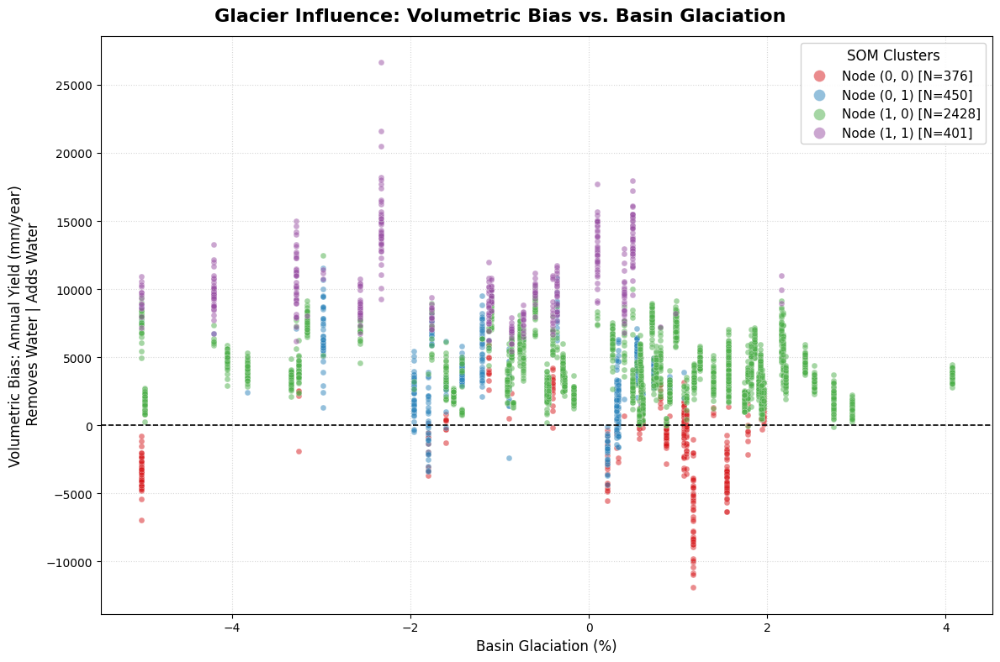

In [63]:
# =========================================================
# 6. Regime Shift Scatter Plot (Volume Bias vs. Glaciation)
# =========================================================
print("Loading static attributes for glaciation data...")

# 1. Load the static attributes and clean the index (Station IDs)
df_attr = pd.read_csv(PROCESSED_DATA_DIR / "static_attributes.csv", index_col=0)
df_attr.index = df_attr.index.astype(str).str.strip().str.upper()

# 2. Attach the dynamically calculated volume bias to the SOM dataframe
# (Assumes 'annual_vol_bias' was just calculated from np.sum(X, axis=1) above this)
df_clusters['annual_vol_bias'] = annual_vol_bias
df_clusters['Station'] = df_clusters['Station'].astype(str).str.strip().str.upper()

# 3. Merge df_clusters with just the 'glacier_pct' column from df_attr
plot_df = pd.merge(df_clusters, df_attr[['glacier_pct']], left_on='Station', right_index=True, how='inner')

# Drop missing data to ensure a clean plot
plot_df = plot_df.dropna(subset=['glacier_pct', 'annual_vol_bias', 'Cluster'])

print(f"Successfully prepared {len(plot_df)} records for the glaciation scatter plot.")

# =========================================================
# Plotting
# =========================================================
print("Generating Volumetric Bias vs Glaciation Scatter Plot...")

fig, ax = plt.subplots(figsize=(12, 8))
fig.suptitle("Glacier Influence: Volumetric Bias vs. Basin Glaciation", fontsize=16, fontweight='bold')

cluster_colors = {
    0: '#d7191c',  # Node (0, 0)
    1: '#2b83ba',  # Node (0, 1)
    2: '#4daf4a',  # Node (1, 0)
    3: '#984ea3'   # Node (1, 1)
}

# Plot each cluster iteratively
for i in range(4):
    subset = plot_df[plot_df['Cluster'] == i]
    
    qx = i // 2
    qy = i % 2
    
    ax.scatter(
        np.log(subset['glacier_pct']), 
        subset['annual_vol_bias'], 
        color=cluster_colors[i], 
        alpha=0.5,           # Semi-transparent for overlapping density
        edgecolors='white', 
        linewidths=0.3,      
        s=25,                # Small dots to match your timing scatter plot
        label=f'Node ({qx}, {qy}) [N={len(subset)}]'
    )

# Add baseline for 0 Volumetric Bias (Perfect Volume Conservation)
ax.axhline(0, color='black', linewidth=1.2, linestyle='--')

# Streamlined Axis Labels
ax.set_xlabel("Basin Glaciation (%)", fontsize=12)
ax.set_ylabel("Volumetric Bias: Annual Yield (mm/year)\n Removes Water | Adds Water", fontsize=12)

ax.grid(True, linestyle=':', alpha=0.5)

# Tighter legend to match your styling
ax.legend(title="SOM Clusters", loc='best', fontsize=11, title_fontsize=12, framealpha=0.9, markerscale=2)

plt.tight_layout()
plt.show()

Loading cluster metadata and static attributes...
Generating attribute stacked count plots...


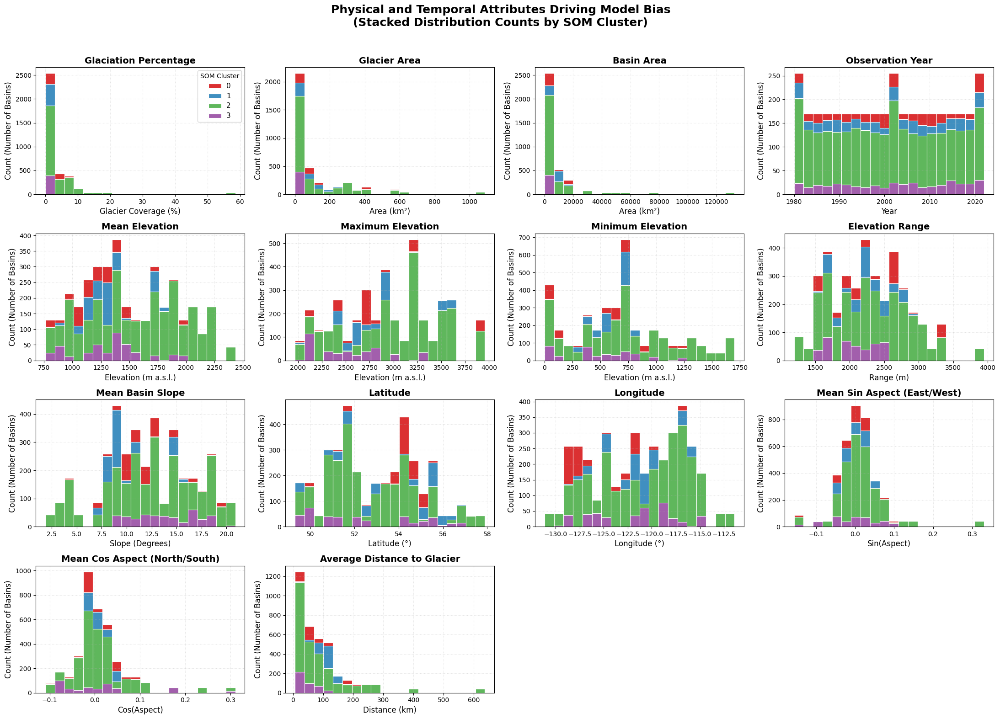

In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

from src.config import PROCESSED_DATA_DIR

warnings.filterwarnings('ignore')

# =========================================================
# 1. Load and Merge Data
# =========================================================
print("Loading cluster metadata and static attributes...")

try:
    df_meta = pd.read_csv(PROCESSED_DATA_DIR / "som_bias_metrics.csv")
except FileNotFoundError:
    df_meta = pd.read_csv(PROCESSED_DATA_DIR / "som_bias_clusters_final.csv")

df_attr = pd.read_csv(PROCESSED_DATA_DIR / "static_attributes.csv", index_col=0)
df_merged = df_meta.merge(df_attr, left_on='Station', right_index=True, how='left')

# Safely calculate Elevation Range if it doesn't explicitly exist in your CSV
if 'elev_range' not in df_merged.columns:
    if 'max_elevation' in df_merged.columns and 'min_elevation' in df_merged.columns:
        df_merged['elev_range'] = df_merged['max_elevation'] - df_merged['min_elevation']
    else:
        print("Warning: Could not calculate 'elev_range'. Missing min/max elevation columns.")

# =========================================================
# 2. Define Features for Plotting
# =========================================================
# Added the 5 new geographic and morphometric features
features_to_plot = [
    ('glacier_pct', 'Glaciation Percentage', 'Glacier Coverage (%)'),
    ('glacier_area_km2_x', 'Glacier Area', 'Area (km²)'),
    ('basin_area_km2', 'Basin Area', 'Area (km²)'),
    ('Year', 'Observation Year', 'Year'),
    ('mean_elev', 'Mean Elevation', 'Elevation (m a.s.l.)'),
    ('max_elev', 'Maximum Elevation', 'Elevation (m a.s.l.)'),
    ('min_elev', 'Minimum Elevation', 'Elevation (m a.s.l.)'),
    ('elev_range', 'Elevation Range', 'Range (m)'),
    ('mean_slope', 'Mean Basin Slope', 'Slope (Degrees)'),
    ('latitude', 'Latitude', 'Latitude (°)'),
    ('longitude', 'Longitude', 'Longitude (°)'),
    ('mean_sin_aspect', 'Mean Sin Aspect (East/West)', 'Sin(Aspect)'),
    ('mean_cos_aspect', 'Mean Cos Aspect (North/South)', 'Cos(Aspect)'),
    ('avg_glacier_dist_km', 'Average Distance to Glacier', 'Distance (km)')
]

cluster_palette = {
    0: '#d7191c',  1: '#2b83ba',  2: '#4daf4a',  3: '#984ea3'
}

# =========================================================
# 3. Plotting the Stacked Histograms
# =========================================================
print("Generating attribute stacked count plots...")

# Expanded to a 4x4 grid to fit all 13 features
fig, axes = plt.subplots(4, 4, figsize=(22, 16))
fig.suptitle("Physical and Temporal Attributes Driving Model Bias\n(Stacked Distribution Counts by SOM Cluster)", fontsize=18, fontweight='bold', y=0.98)

axes = axes.flatten()

for i, (col, title, xlabel) in enumerate(features_to_plot):
    ax = axes[i]
    
    if col not in df_merged.columns:
        ax.text(0.5, 0.5, f"Column '{col}' not found.", ha='center', va='center', fontsize=12, color='red')
        ax.set_title(title)
        continue

    plot_data = df_merged[['Cluster', col]].dropna()

    sns.histplot(
        data=plot_data, 
        x=col, 
        hue='Cluster', 
        palette=cluster_palette,
        multiple='stack',    # Stacks absolute counts
        stat='count',   
        alpha=0.9,           
        edgecolor='white',   
        linewidth=0.8,
        bins=20,             
        ax=ax,
        legend=(i == 0)      
    )
    
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(xlabel, fontsize=12)
    ax.set_ylabel("Count (Number of Basins)", fontsize=12) # Fixed to accurately reflect count
    ax.grid(True, linestyle=':', alpha=0.4)
    
    # Apply log scale to BOTH area features
    # if col in ['glacier_area_km2', 'basin_area_km2']:
    #     ax.set_xscale('log')
    #     ax.set_xlabel(xlabel + " (Log Scale)")

# Clean up the remaining empty subplots (indices 13, 14, 15)
for j in range(len(features_to_plot), len(axes)):
    fig.delaxes(axes[j])

if axes[0].get_legend():
    axes[0].get_legend().set_title("SOM Cluster")
    plt.setp(axes[0].get_legend().get_texts(), fontsize='11')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

Loading cluster metadata and static attributes...
Generating attribute stacked count plots with control group...


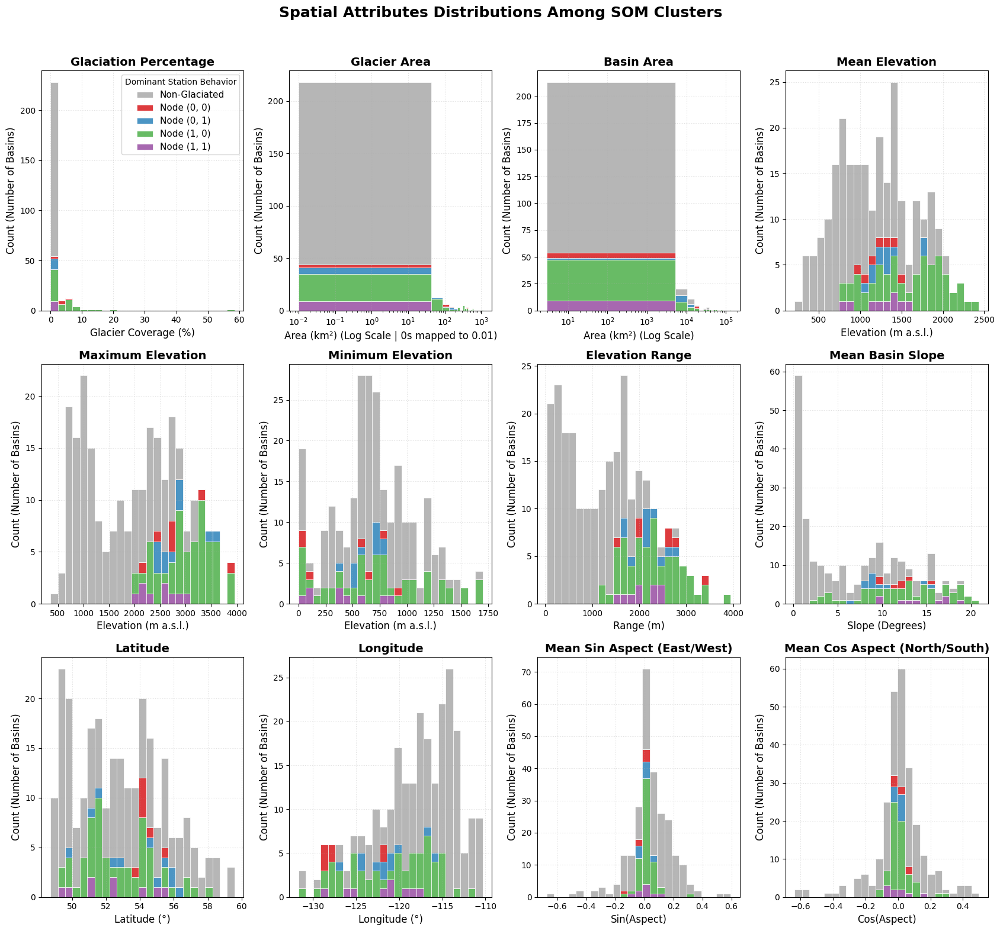

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

from src.config import PROCESSED_DATA_DIR

warnings.filterwarnings('ignore')

# =========================================================
# 1. Load and Merge Data
# =========================================================
print("Loading cluster metadata and static attributes...")

try:
    df_meta = pd.read_csv(PROCESSED_DATA_DIR / "som_bias_metrics.csv")
except FileNotFoundError:
    df_meta = pd.read_csv(PROCESSED_DATA_DIR / "som_bias_clusters_final.csv")

# Calculate the dominant (mode) cluster for each glaciated station
df_dominant = df_meta.groupby('Station')['Cluster'].agg(lambda x: x.mode()[0]).reset_index()
df_dominant['Station'] = df_dominant['Station'].astype(str).str.strip().str.upper()

# Load static attributes (Contains ALL stations, including non-glaciated)
df_attr = pd.read_csv(PROCESSED_DATA_DIR / "static_attributes.csv", index_col=0)
df_attr.index = df_attr.index.astype(str).str.strip().str.upper()

# --- THE FIX: Right Merge ---
# Merge using 'right' so we keep all stations present in df_attr
df_merged = df_dominant.merge(df_attr, left_on='Station', right_index=True, how='right')

# Assign explicit labels: Map the SOM numbers to Node strings, and catch the Non-Glaciated stations
def assign_label(row):
    if pd.notna(row['Cluster']):
        qx, qy = int(row['Cluster']) // 2, int(row['Cluster']) % 2
        return f'Node ({qx}, {qy})'
    elif row['glacier_pct'] == 0 or row['glacier_area_km2'] == 0:
        return 'Non-Glaciated'
    else:
        return np.nan # Catch-all for glaciated basins that were excluded from the SOM for missing data

df_merged['Cluster_Label'] = df_merged.apply(assign_label, axis=1)

# Drop any un-assigned rows 
df_merged = df_merged.dropna(subset=['Cluster_Label'])

# Safely calculate Elevation Range 
if 'elev_range' not in df_merged.columns:
    if 'max_elevation' in df_merged.columns and 'min_elevation' in df_merged.columns:
        df_merged['elev_range'] = df_merged['max_elevation'] - df_merged['min_elevation']
    else:
        print("Warning: Could not calculate 'elev_range'. Missing min/max elevation columns.")

# =========================================================
# 2. Define Features and Styling
# =========================================================
features_to_plot = [
    ('glacier_pct', 'Glaciation Percentage', 'Glacier Coverage (%)'),
    ('glacier_area_km2', 'Glacier Area', 'Area (km²)'),
    ('basin_area_km2', 'Basin Area', 'Area (km²)'),
    ('mean_elev', 'Mean Elevation', 'Elevation (m a.s.l.)'),
    ('max_elev', 'Maximum Elevation', 'Elevation (m a.s.l.)'),
    ('min_elev', 'Minimum Elevation', 'Elevation (m a.s.l.)'),
    ('elev_range', 'Elevation Range', 'Range (m)'),
    ('mean_slope', 'Mean Basin Slope', 'Slope (Degrees)'),
    ('latitude', 'Latitude', 'Latitude (°)'),
    ('longitude', 'Longitude', 'Longitude (°)'),
    ('mean_sin_aspect', 'Mean Sin Aspect (East/West)', 'Sin(Aspect)'),
    # ('avg_glacier_dist_km', 'Average Distance to Glacier', 'Distance (km)'),
    ('mean_cos_aspect', 'Mean Cos Aspect (North/South)', 'Cos(Aspect)')
]

# Explicit palette to match strings, rendering Non-Glaciated in a distinct gray
cluster_palette = {
    'Non-Glaciated': '#aaaaaa',  
    'Node (0, 0)': '#d7191c',  
    'Node (0, 1)': '#2b83ba',  
    'Node (1, 0)': '#4daf4a',  
    'Node (1, 1)': '#984ea3'   
}

# Hue order forces Gray to the bottom of the stack so colors rest clearly on top
hue_order = ['Non-Glaciated', 'Node (0, 0)', 'Node (0, 1)', 'Node (1, 0)', 'Node (1, 1)']

# =========================================================
# 3. Plotting the Stacked Histograms
# =========================================================
print("Generating attribute stacked count plots with control group...")

fig, axes = plt.subplots(3, 4, figsize=(17, 16))
fig.suptitle("Spatial Attributes Distributions Among SOM Clusters", fontsize=18, fontweight='bold', y=0.98)

axes = axes.flatten()

for i, (col, title, xlabel) in enumerate(features_to_plot):
    ax = axes[i]
    
    if col not in df_merged.columns:
        ax.text(0.5, 0.5, f"Column '{col}' not found.", ha='center', va='center', fontsize=12, color='red')
        ax.set_title(title)
        continue

    plot_data = df_merged[['Cluster_Label', col]].dropna()

    # Log Scale safe-handling: A non-glaciated basin has 0 glacier area. 
    # Because log(0) breaks plots, we shift 0s slightly off the axis boundary so they bin correctly.
    if col == 'glacier_area_km2':
        plot_data[col] = plot_data[col].replace(0, 0.01)

    sns.histplot(
        data=plot_data, 
        x=col, 
        hue='Cluster_Label', 
        palette=cluster_palette,
        hue_order=hue_order, # Enforce stacking order
        multiple='stack',    
        stat='count',   
        alpha=0.85,           
        edgecolor='white',   
        linewidth=0.5,
        bins=25,             # Increased slightly due to larger overall N
        ax=ax,
        legend=(i == 0)      
    )
    
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.set_xlabel(xlabel, fontsize=12)
    
    # Handle the specific x-axis scaling formats
    if col in ['glacier_area_km2', 'basin_area_km2']:
        ax.set_xscale('log')
        if col == 'glacier_area_km2':
            ax.set_xlabel(xlabel + " (Log Scale | 0s mapped to 0.01)")
        else:
            ax.set_xlabel(xlabel + " (Log Scale)")
            
    ax.set_ylabel("Count (Number of Basins)", fontsize=12)
    ax.grid(True, linestyle=':', alpha=0.4)

# Clean up empty subplots
for j in range(len(features_to_plot), len(axes)):
    fig.delaxes(axes[j])

if axes[0].get_legend():
    axes[0].get_legend().set_title("Dominant Station Behavior")
    plt.setp(axes[0].get_legend().get_texts(), fontsize='11')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

Loading cluster metadata and static attributes...
Preparing and scaling features for PCA...
Fitting Principal Component Analysis...
Generating PCA Biplot...


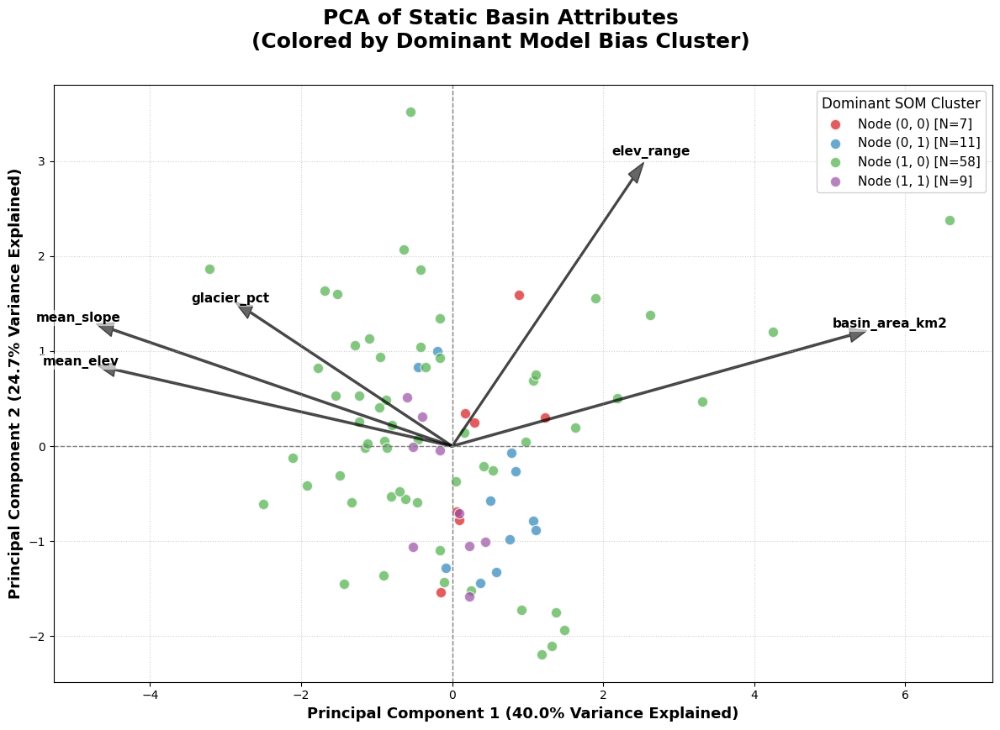

In [97]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import warnings

from src.config import PROCESSED_DATA_DIR

warnings.filterwarnings('ignore')

# =========================================================
# 1. Load Data & Find Dominant Cluster per Station
# =========================================================
print("Loading cluster metadata and static attributes...")

# Load metadata
try:
    df_meta = pd.read_csv(PROCESSED_DATA_DIR / "som_bias_metrics.csv")
except FileNotFoundError:
    df_meta = pd.read_csv(PROCESSED_DATA_DIR / "som_bias_clusters_final.csv")

# Calculate the dominant (mode) cluster for each station to prevent duplicating static points
df_dominant = df_meta.groupby('Station')['Cluster'].agg(lambda x: x.mode()[0]).reset_index()
df_dominant['Station'] = df_dominant['Station'].astype(str).str.strip().str.upper()

# Load static attributes
df_attr = pd.read_csv(PROCESSED_DATA_DIR / "static_attributes.csv", index_col=0)
df_attr.index = df_attr.index.astype(str).str.strip().str.upper()

# Merge
df_merged = df_dominant.merge(df_attr, left_on='Station', right_index=True, how='inner').set_index('Station')

# Safely calculate Elevation Range if missing
if 'elev_range' not in df_merged.columns:
    if 'max_elevation' in df_merged.columns and 'min_elevation' in df_merged.columns:
        df_merged['elev_range'] = df_merged['max_elevation'] - df_merged['min_elevation']
    else:
        print("Warning: Could not calculate 'elev_range'. Missing min/max elevation columns.")

# =========================================================
# 2. Prepare Data for PCA
# =========================================================
print("Preparing and scaling features for PCA...")

# The static features we want to analyze
features_for_pca = [
    'glacier_pct', 
    'mean_elev', 
    'elev_range', 
    'mean_slope',
    'basin_area_km2'
]

# Ensure all requested features exist in the dataframe
available_features = [f for f in features_for_pca if f in df_merged.columns]

# Drop any rows with NaNs in our specific feature set
df_pca = df_merged[['Cluster'] + available_features].dropna()

# Standardize the features (Crucial for PCA so large magnitude variables like Area don't dominate)
X = df_pca[available_features]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# =========================================================
# 3. Fit PCA
# =========================================================
print("Fitting Principal Component Analysis...")

pca = PCA(n_components=2)
pcs = pca.fit_transform(X_scaled)

df_pca['PC1'] = pcs[:, 0]
df_pca['PC2'] = pcs[:, 1]

# Extract variance explained
var_pc1 = pca.explained_variance_ratio_[0] * 100
var_pc2 = pca.explained_variance_ratio_[1] * 100

# =========================================================
# 4. Plotting: The PCA Biplot
# =========================================================
print("Generating PCA Biplot...")

fig, ax = plt.subplots(figsize=(12, 9))
fig.suptitle("PCA of Static Basin Attributes\n(Colored by Dominant Model Bias Cluster)", fontsize=18, fontweight='bold', y=0.96)

cluster_palette = {
    0: '#d7191c',  # Node (0, 0)
    1: '#2b83ba',  # Node (0, 1)
    2: '#4daf4a',  # Node (1, 0)
    3: '#984ea3'   # Node (1, 1)
}

# --- 1. Scatter the Points ---
for cluster_id in range(4):
    subset = df_pca[df_pca['Cluster'] == cluster_id]
    
    qx = cluster_id // 2
    qy = cluster_id % 2
    
    ax.scatter(
        subset['PC1'], 
        subset['PC2'], 
        color=cluster_palette.get(cluster_id, 'gray'), 
        alpha=0.7, 
        edgecolor='white', 
        s=80, 
        label=f'Node ({qx}, {qy}) [N={len(subset)}]'
    )

# --- 2. Overlay the Feature Vectors (Loadings) ---
# We scale the vectors by the maximum variance of the PCs so they span the plot nicely
loadings = pca.components_.T
scale_x = np.max(np.abs(df_pca['PC1'])) / np.max(np.abs(loadings[:, 0])) * 0.8
scale_y = np.max(np.abs(df_pca['PC2'])) / np.max(np.abs(loadings[:, 1])) * 0.8

for i, feature in enumerate(available_features):
    # Vector arrow
    ax.arrow(0, 0, loadings[i, 0] * scale_x, loadings[i, 1] * scale_y, 
             color='black', alpha=0.6, width=0.02, head_width=0.15)
    
    # Feature Text Label
    ax.text(loadings[i, 0] * scale_x * 1.1, loadings[i, 1] * scale_y * 1.1, 
            feature, color='black', ha='center', va='center', fontsize=11, 
            fontweight='bold', bbox=dict(facecolor='white', alpha=0.6, edgecolor='none', pad=1))

# --- 3. Formatting ---
ax.axhline(0, color='gray', linestyle='--', linewidth=1)
ax.axvline(0, color='gray', linestyle='--', linewidth=1)

ax.set_xlabel(f"Principal Component 1 ({var_pc1:.1f}% Variance Explained)", fontsize=13, fontweight='bold')
ax.set_ylabel(f"Principal Component 2 ({var_pc2:.1f}% Variance Explained)", fontsize=13, fontweight='bold')

ax.grid(True, linestyle=':', alpha=0.6)
ax.legend(title="Dominant SOM Cluster", fontsize=11, title_fontsize=12, loc='best', framealpha=0.9)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

Loading SOM clusters and metadata...
Loading basin boundaries from GeoPackages...
  -> Successfully loaded MDA_ADP_05.gpkg (1740 basins)
  -> Successfully loaded MDA_ADP_07.gpkg (476 basins)
  -> Successfully loaded MDA_ADP_08.gpkg (2180 basins)
Successfully matched and sorted 85 basin polygons.
Fetching geographic boundaries...
Rendering map...


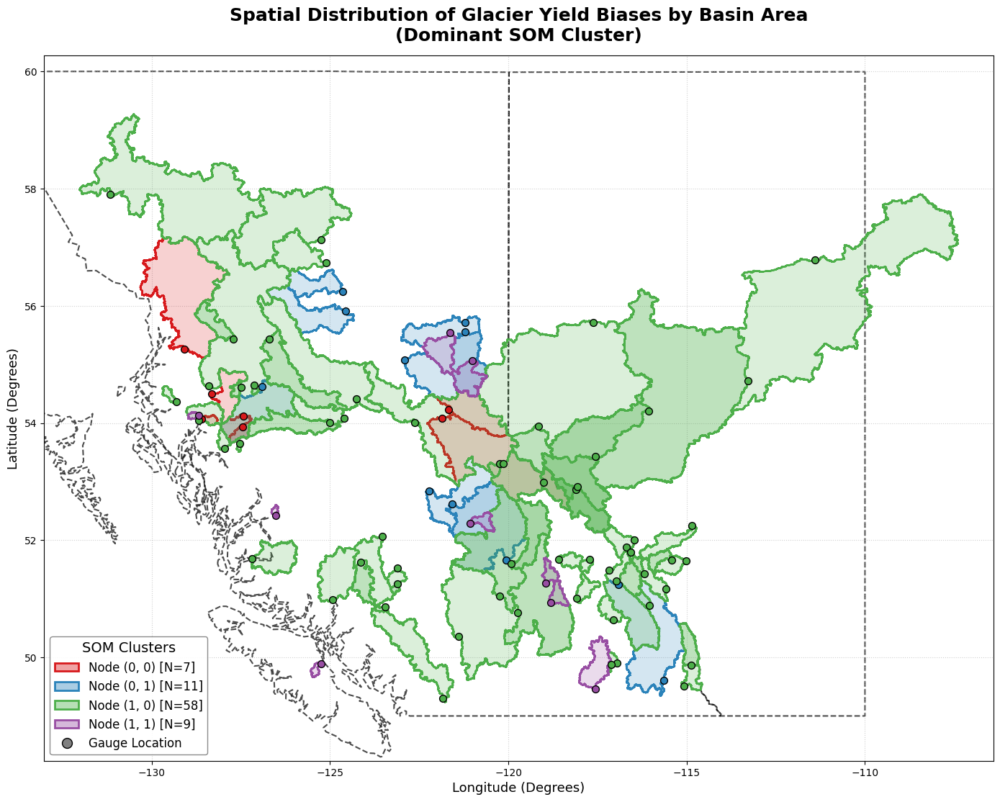

In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import warnings
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

from src.config import PROCESSED_DATA_DIR, RAW_DATA_DIR

warnings.filterwarnings('ignore')

# =========================================================
# 1. Load Station Metadata and SOM Clusters
# =========================================================
print("Loading SOM clusters and metadata...")

df_clusters = pd.read_csv(PROCESSED_DATA_DIR / "som_bias_clusters_final.csv")
df_dominant = df_clusters.groupby('Station')['Cluster'].agg(lambda x: x.mode()[0]).reset_index()
df_dominant['Station'] = df_dominant['Station'].astype(str).str.strip().str.upper()

df_geo = pd.read_csv(RAW_DATA_DIR / "station_metadata.csv", index_col=0)
df_geo.index = df_geo.index.astype(str).str.strip().str.upper()

# Merge to get Lat/Lon points for the clusters
df_map = pd.merge(df_dominant, df_geo, left_on='Station', right_index=True, how='inner')

# Create a GeoDataFrame for the Gauge Points
gdf_points = gpd.GeoDataFrame(
    df_map, 
    geometry=gpd.points_from_xy(df_map['Longitude'], df_map['Latitude']),
    crs="EPSG:4326"
)

# =========================================================
# 2. Load and Combine Basin Geometries (GeoPackages)
# =========================================================
print("Loading basin boundaries from GeoPackages...")

gpkg_files = ["MDA_ADP_05.gpkg", "MDA_ADP_07.gpkg", "MDA_ADP_08.gpkg"]
gdfs = []

for file_name in gpkg_files:
    file_path = RAW_DATA_DIR / "drainage_areas" / file_name
    try:
        gdf_part = gpd.read_file(file_path)
        gdfs.append(gdf_part)
        print(f"  -> Successfully loaded {file_name} ({len(gdf_part)} basins)")
    except Exception as e:
        print(f"  -> ⚠️ Failed to load {file_name}: {e}")

if not gdfs:
    raise FileNotFoundError("Could not load any basin geometries. Please check the file paths.")

gdf_basins = gpd.GeoDataFrame(pd.concat(gdfs, ignore_index=True), crs=gdfs[0].crs)

possible_cols = ['station_id', 'station', 'id', 'station_number', 'stationnum']
station_col = next((c for c in gdf_basins.columns if c.lower() in possible_cols), None)

if station_col:
    gdf_basins[station_col] = gdf_basins[station_col].astype(str).str.strip().str.upper()
else:
    raise ValueError("Could not find a station ID column in your basin shapefiles.")

# Merge the polygons with the cluster assignments
gdf_cluster_basins = gdf_basins.merge(df_map, left_on=station_col, right_on='Station', how='inner')

# --- NEW: Calculate area and sort so smallest basins plot on top ---
# We temporarily project to a meter-based CRS (Web Mercator) to get an accurate area metric
gdf_cluster_basins['calc_area'] = gdf_cluster_basins.to_crs("EPSG:3857").geometry.area
gdf_cluster_basins = gdf_cluster_basins.sort_values(by='calc_area', ascending=False)

# Reproject to WGS 84 (Degrees) for the final plot
gdf_cluster_basins = gdf_cluster_basins.to_crs("EPSG:4326")
print(f"Successfully matched and sorted {len(gdf_cluster_basins)} basin polygons.")

# =========================================================
# 3. Fetch Province Boundaries (BC and Alberta)
# =========================================================
print("Fetching geographic boundaries...")
try:
    url_provinces = "https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/canada.geojson"
    canada = gpd.read_file(url_provinces)
    bc_ab = canada[canada['name'].isin(['British Columbia', 'Alberta'])]
    bc_ab = bc_ab.to_crs("EPSG:4326")
except Exception as e:
    print(f"⚠️ Could not load province boundaries from web: {e}")
    bc_ab = None

# =========================================================
# 4. Plotting
# =========================================================
print("Rendering map...")

fig, ax = plt.subplots(figsize=(14, 12))

# Plot Provinces (Background Context)
if bc_ab is not None:
    bc_ab.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1.5, linestyle='--', alpha=0.7, zorder=1)

cluster_colors = {
    0: '#d7191c',  # Red
    1: '#2b83ba',  # Blue
    2: '#4daf4a',  # Green
    3: '#984ea3'   # Purple
}

legend_elements = []

# Plot Basins and Gauge Points per cluster
for cluster_id, color in cluster_colors.items():
    qx = cluster_id // 2
    qy = cluster_id % 2
    label_text = f'Node ({qx}, {qy})'
    
    subset_poly = gdf_cluster_basins[gdf_cluster_basins['Cluster'] == cluster_id]
    
    if not subset_poly.empty:
        # --- NEW: Faint face color, prominent solid edge color ---
        # Convert the hex color to an RGBA tuple with 20% opacity for the fill
        fill_color = mcolors.to_rgba(color, alpha=0.20)
        
        subset_poly.plot(
            ax=ax, 
            facecolor=fill_color, 
            edgecolor=color,     # Keep the border 100% solid color
            linewidth=1.8,       # Thicker, prominent outline
            zorder=2
        )
        
    subset_pts = gdf_points[gdf_points['Cluster'] == cluster_id]
    if not subset_pts.empty:
        subset_pts.plot(
            ax=ax, 
            color=color, 
            markersize=50,       
            edgecolor='black',   
            linewidth=1.0, 
            zorder=3
        )
        
        legend_elements.append(
            Patch(facecolor=mcolors.to_rgba(color, alpha=0.4), edgecolor=color, linewidth=2, label=f"{label_text} [N={len(subset_poly)}]")
        )

legend_elements.append(Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', markersize=10, markeredgecolor='black', label='Gauge Location'))

# Formatting
ax.set_title("Spatial Distribution of Glacier Yield Biases by Basin Area\n(Dominant SOM Cluster)", fontsize=18, fontweight='bold', pad=15)
ax.set_xlabel("Longitude (Degrees)", fontsize=13)
ax.set_ylabel("Latitude (Degrees)", fontsize=13)

if not gdf_cluster_basins.empty:
    minx, miny, maxx, maxy = gdf_cluster_basins.total_bounds
    ax.set_xlim(minx - 1.0, maxx + 1.0)
    ax.set_ylim(miny - 1.0, maxy + 1.0)

ax.grid(True, linestyle=':', alpha=0.6)
ax.legend(handles=legend_elements, title="SOM Clusters", loc='lower left', fontsize=12, title_fontsize=14, framealpha=0.9, edgecolor='gray')

plt.tight_layout()
plt.show()

Extracting hypsometry from DEM...
DEM CRS: EPSG:3857
Processing Node 0, 0 (7 basins)...


Processing Node 0, 1 (11 basins)...


Processing Node 1, 0 (58 basins)...


Processing Node 1, 1 (9 basins)...


Calculating normalized hypsometric curves...
Rendering plots...


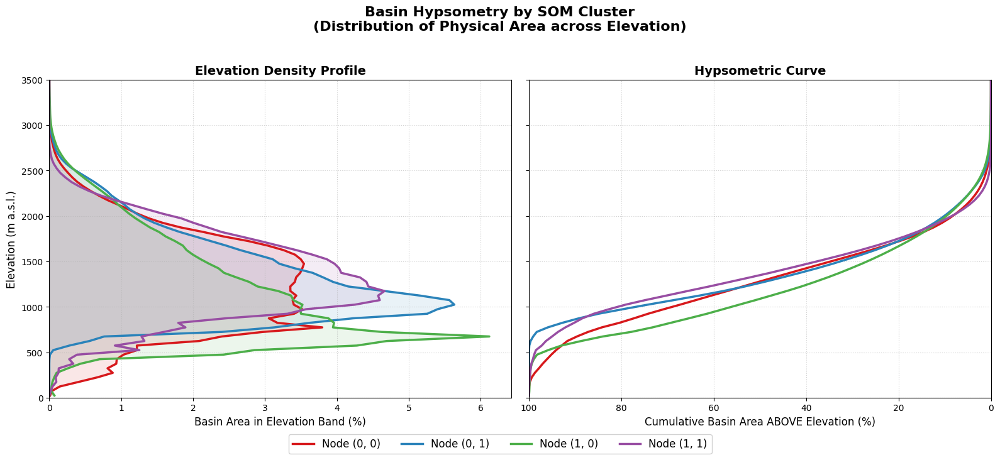

In [9]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import rasterio
from rasterio.mask import mask
import warnings
from pathlib import Path
from tqdm import tqdm  # For a progress bar!
from src.config import RAW_DATA_DIR

warnings.filterwarnings('ignore')

# --- Assuming gdf_cluster_basins is already in your workspace from the previous script ---
# If running fresh, you'll need to reload and merge your basins and clusters here.

DEM_PATH = RAW_DATA_DIR / "dem_data/western_canada_dem.tif"

# =========================================================
# 1. Process DEM Data (Memory-Safe Accumulation)
# =========================================================
print("Extracting hypsometry from DEM...")

# Define elevation bins (0m to 4000m in 50m increments)
elev_bins = np.arange(0, 4200, 50)
bin_centers = (elev_bins[:-1] + elev_bins[1:]) / 2

# Dictionary to hold the accumulated pixel counts per cluster
cluster_histograms = {
    0: np.zeros(len(elev_bins) - 1),
    1: np.zeros(len(elev_bins) - 1),
    2: np.zeros(len(elev_bins) - 1),
    3: np.zeros(len(elev_bins) - 1)
}

with rasterio.open(DEM_PATH) as src:
    dem_crs = src.crs
    print(f"DEM CRS: {dem_crs}")
    
    # CRITICAL: Reproject basins to perfectly match the DEM's coordinate system
    gdf_basins_proj = gdf_cluster_basins.to_crs(dem_crs)
    
    nodata_val = src.nodata if src.nodata is not None else -9999
    
    for cluster_id in range(4):
        # Get all basin polygons for this cluster
        geoms = gdf_basins_proj[gdf_basins_proj['Cluster'] == cluster_id].geometry.tolist()
        
        if not geoms:
            continue
            
        print(f"Processing Node {cluster_id // 2}, {cluster_id % 2} ({len(geoms)} basins)...")
        
        # Process basin by basin to prevent RAM overload
        for geom in tqdm(geoms, leave=False):
            try:
                # Crop the DEM to the exact polygon boundary
                out_image, out_transform = mask(src, [geom], crop=True)
                data = out_image[0]
                
                # Filter out NoData and mathematically impossible values
                valid_mask = (data != nodata_val) & ~np.isnan(data) & (data > -50) & (data < 6000)
                valid_elevs = data[valid_mask]
                
                if len(valid_elevs) > 0:
                    # Calculate histogram and accumulate
                    counts, _ = np.histogram(valid_elevs, bins=elev_bins)
                    cluster_histograms[cluster_id] += counts
            except ValueError:
                # This happens if a basin polygon falls completely outside the DEM bounds
                pass

# =========================================================
# 2. Calculate Hypsometric Statistics
# =========================================================
print("Calculating normalized hypsometric curves...")

cluster_pdfs = {}
cluster_cdfs = {}

for cluster_id, counts in cluster_histograms.items():
    total_pixels = np.sum(counts)
    
    if total_pixels > 0:
        # Probability Density Function (Area percentage per elevation band)
        pdf = counts / total_pixels
        cluster_pdfs[cluster_id] = pdf * 100  # Convert to %
        
        # Cumulative Distribution Function (Hypsometric Curve)
        # We calculate it from top to bottom (highest elevation to lowest)
        # so X-axis shows "Percentage of basin area ABOVE this elevation"
        cdf = np.cumsum(counts[::-1])[::-1] / total_pixels
        cluster_cdfs[cluster_id] = cdf * 100
    else:
        cluster_pdfs[cluster_id] = np.zeros(len(bin_centers))
        cluster_cdfs[cluster_id] = np.zeros(len(bin_centers))

# =========================================================
# 3. Plotting
# =========================================================
print("Rendering plots...")

cluster_colors = {
    0: '#d7191c',  # Node (0, 0)
    1: '#2b83ba',  # Node (0, 1)
    2: '#4daf4a',  # Node (1, 0)
    3: '#984ea3'   # Node (1, 1)
}

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7), sharey=True)
fig.suptitle("Basin Hypsometry by SOM Cluster\n(Distribution of Physical Area across Elevation)", fontsize=16, fontweight='bold', y=0.98)

# --- Subplot 1: Area-Elevation Distribution (PDF) ---
for cluster_id in range(4):
    qx = cluster_id // 2
    qy = cluster_id % 2
    
    if np.sum(cluster_pdfs[cluster_id]) > 0:
        ax1.plot(cluster_pdfs[cluster_id], bin_centers, color=cluster_colors[cluster_id], linewidth=2.5, 
                 label=f'Node ({qx}, {qy})')
        ax1.fill_betweenx(bin_centers, 0, cluster_pdfs[cluster_id], color=cluster_colors[cluster_id], alpha=0.1)

ax1.set_title("Elevation Density Profile", fontsize=14, fontweight='bold')
ax1.set_ylabel("Elevation (m a.s.l.)", fontsize=12)
ax1.set_xlabel("Basin Area in Elevation Band (%)", fontsize=12)
ax1.grid(True, linestyle=':', alpha=0.6)
ax1.set_ylim(0, 3500)
ax1.set_xlim(left=0)

# --- Subplot 2: Classic Hypsometric Curve (CDF) ---
for cluster_id in range(4):
    if np.sum(cluster_pdfs[cluster_id]) > 0:
        ax2.plot(cluster_cdfs[cluster_id], bin_centers, color=cluster_colors[cluster_id], linewidth=2.5)

ax2.set_title("Hypsometric Curve", fontsize=14, fontweight='bold')
ax2.set_xlabel("Cumulative Basin Area ABOVE Elevation (%)", fontsize=12)
ax2.grid(True, linestyle=':', alpha=0.6)
ax2.set_xlim(0, 100)
ax2.invert_xaxis()  # Standard practice: 100% on left, 0% on right

# Custom Legend
handles, labels = ax1.get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=4, fontsize=12, bbox_to_anchor=(0.5, -0.05), framealpha=0.9)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

Loading and downsampling DEM data...
Original shape: 33280x39936 | New shape: 1664x1996
Rendering spatial map...


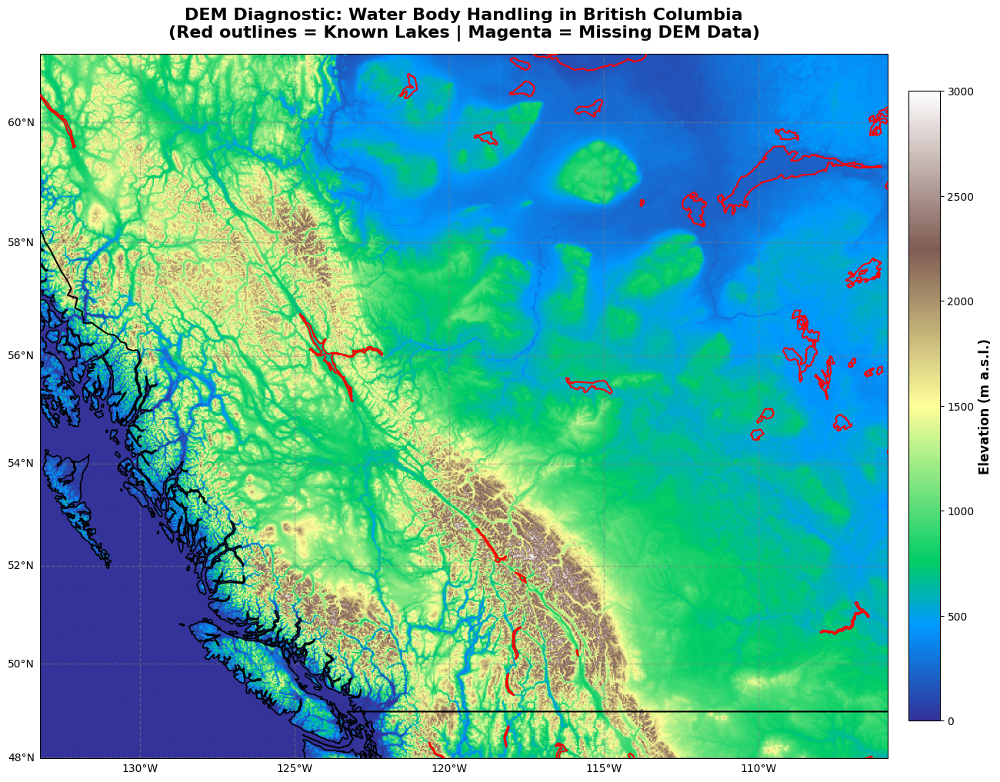

In [93]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import rasterio
from rasterio.enums import Resampling # <--- NEW IMPORT
from rasterio.warp import transform_bounds
import numpy as np
from pathlib import Path
import warnings
from src.config import RAW_DATA_DIR

warnings.filterwarnings('ignore')

# =========================================================
# 1. Configuration (Update this path!)
# =========================================================
# Point this to your actual DEM file (e.g., .tif)
DEM_PATH = Path(RAW_DATA_DIR / "dem_data\western_canada_dem.tif") 

if not DEM_PATH.exists():
    raise FileNotFoundError(f"Please update DEM_PATH. Could not find: {DEM_PATH}")

# =========================================================
# 2. Load DEM and Transform Coordinates (Memory Safe)
# =========================================================
print("Loading and downsampling DEM data...")

# We will scale the 1.3 billion pixel image down to 5% of its original dimensions
scale_factor = 0.05 

with rasterio.open(DEM_PATH) as src:
    
    # Calculate new smaller dimensions
    new_height = int(src.height * scale_factor)
    new_width = int(src.width * scale_factor)
    
    # Read the data, telling rasterio to resample it BEFORE loading it into RAM
    dem_data = src.read(
        1,
        out_shape=(new_height, new_width),
        resampling=Resampling.bilinear
    )
    
    # 1. Get the native boundaries (in Meters)
    bounds = src.bounds
    native_extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
    
    # 2. Convert native boundaries to Lat/Lon (Degrees) for the map camera
    lon_min, lat_min, lon_max, lat_max = transform_bounds(src.crs, 'EPSG:4326', *bounds)
    ll_extent = [lon_min, lon_max, lat_min, lat_max]
    
    # 3. Extract the exact EPSG code
    epsg_code = src.crs.to_epsg()
    
    # Handle NoData masks
    nodata_val = src.nodata
    if nodata_val is not None:
        dem_data = np.where(dem_data == nodata_val, np.nan, dem_data)

print(f"Original shape: {src.height}x{src.width} | New shape: {new_height}x{new_width}")

# =========================================================
# 3. Setup Cartopy Map
# =========================================================
print("Rendering spatial map...")
fig = plt.figure(figsize=(14, 12))

ax = fig.add_subplot(1, 1, 1, projection=ccrs.Mercator())

# Set map camera using the converted Lat/Lon extent
ax.set_extent(ll_extent, crs=ccrs.PlateCarree())

# =========================================================
# 4. Plot the DEM
# =========================================================
cmap = plt.cm.terrain.copy()
cmap.set_bad(color='magenta')

# Tell Cartopy to use the raster's native EPSG to project the image onto the Mercator map
dem_transform = ccrs.epsg(epsg_code) if epsg_code else ccrs.PlateCarree()

img = ax.imshow(
    dem_data, 
    origin='upper', 
    extent=native_extent,        # Feed it the raw meter boundaries
    transform=dem_transform,     # Tell it exactly what coordinate system those meters belong to
    cmap=cmap, 
    vmin=0, 
    vmax=3000, 
    zorder=1
)

cbar = plt.colorbar(img, ax=ax, orientation='vertical', shrink=0.7, pad=0.02)
cbar.set_label('Elevation (m a.s.l.)', fontsize=12, fontweight='bold')

# =========================================================
# 5. Overlay Lake Boundaries
# =========================================================
lakes = cfeature.NaturalEarthFeature(
    category='physical', 
    name='lakes', 
    scale='10m', 
    edgecolor='red',     
    facecolor='none',    
    linewidth=1.5
)

ax.add_feature(lakes, zorder=3)
ax.add_feature(cfeature.BORDERS.with_scale('10m'), linestyle='-', edgecolor='black', linewidth=1.5, zorder=4)
ax.add_feature(cfeature.COASTLINE.with_scale('10m'), edgecolor='black', linewidth=1.2, zorder=4)

ax.set_title("DEM Diagnostic: Water Body Handling in British Columbia\n(Red outlines = Known Lakes | Magenta = Missing DEM Data)", fontsize=16, fontweight='bold', pad=15)

gl = ax.gridlines(draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False

plt.tight_layout()
plt.show()

In [ ]:
# 05DA009 station (12.5% glaciation)
# test date row 13695, column AS
d_base = -19.45
d_ice = -21.5
d_stream = -20.16

flow_f = 24.55
flow_cf = 12

# flow_f = 3.48
# flow_cf = 1.51

f_ice = (d_stream - d_base) / (d_ice - d_base)
print(f_ice)
print((flow_f - flow_cf) / flow_f)

0.6761904761904766
0.5112016293279023


Troubleshooting zero glacier melt basins

In [16]:
import geopandas as gpd
import pandas as pd
import warnings
from src.config import DRAINAGE_FILES, GLACIER_SHP_PATH, MASS_BALANCE_PATH, PROCESSED_DATA_DIR

CANADA_ALBERS_CRS = "+proj=aea +lat_1=50 +lat_2=70 +lat_0=40 +lon_0=-96 +x_0=0 +y_0=0 +datum=NAD83 +units=m +no_defs"

print("⏳ Loading data...")

# 1. Get the exact subset of stations
df_flow = pd.read_csv(PROCESSED_DATA_DIR / "combined_streamflow.csv", index_col="Date", parse_dates=True)
stations = df_flow.columns.tolist()
# Ensure they are strings to match the shapefile IDs
requested_stations = set([str(s).strip() for s in stations]) 

# 2. Load Mass Balance Data
mb_df = pd.read_csv(MASS_BALANCE_PATH, index_col=0)
known_glaciers = set(mb_df.index)

# 3. Load and Filter Basins
print("⏳ Loading and filtering basins...")
basins_list = []
for path in DRAINAGE_FILES:
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=RuntimeWarning)
        gdf = gpd.read_file(path, layer='DrainageBasin_BassinDeDrainage')
        id_col = next((c for c in gdf.columns if c.lower() in ['stationnum', 'id', 'station_id']), None)
        if id_col:
            gdf = gdf[[id_col, 'geometry']].rename(columns={id_col: 'station_id'})
            basins_list.append(gdf)

gdf_basins = pd.concat(basins_list, ignore_index=True)
gdf_basins['station_id'] = gdf_basins['station_id'].astype(str).str.strip()

# FILTER BASINS HERE to drastically reduce workload before any spatial math
gdf_basins = gdf_basins[gdf_basins['station_id'].isin(requested_stations)].copy()
gdf_basins = gdf_basins.to_crs(CANADA_ALBERS_CRS)
print(f"✅ Filtered down to {len(gdf_basins)} active basins.")

# 4. Load Glaciers and Convert to Points (The massive speedup!)
print("⏳ Loading glaciers and converting to centroids...")
gdf_glaciers = gpd.read_file(GLACIER_SHP_PATH)
rgi_col = next((c for c in gdf_glaciers.columns if 'rgiid' in c.lower()), 'RGIId')
gdf_glaciers = gdf_glaciers.rename(columns={rgi_col: 'RGIId'})
gdf_glaciers = gdf_glaciers.to_crs(CANADA_ALBERS_CRS)

# Pre-calculate the exact area in km2 BEFORE changing the shapes to points
gdf_glaciers['exact_area_km2'] = gdf_glaciers.geometry.area / 1e6

# Convert polygons to centroids (points)
gdf_glaciers['geometry'] = gdf_glaciers.geometry.centroid

# 5. Fast Point-in-Polygon Spatial Join
print("⏳ Performing Point-in-Polygon spatial join...")
# This instantly checks which basin polygon contains which glacier center-point
joined = gpd.sjoin(
    gdf_glaciers[['RGIId', 'exact_area_km2', 'geometry']],
    gdf_basins[['station_id', 'geometry']],
    how='inner',
    predicate='within' 
)

# 6. Diagnostics & Missing RGI Extraction
print("🔍 Analyzing missing data...")
joined['has_mb_data'] = joined['RGIId'].isin(known_glaciers)

total_glacier_area = joined.groupby('station_id')['exact_area_km2'].sum()
valid_glacier_area = joined[joined['has_mb_data']].groupby('station_id')['exact_area_km2'].sum()

diag_df = pd.DataFrame({
    'Total_Glacier_Area_km2': total_glacier_area,
    'Valid_MB_Area_km2': valid_glacier_area
}).fillna(0)

diag_df['Missing_Area_km2'] = diag_df['Total_Glacier_Area_km2'] - diag_df['Valid_MB_Area_km2']
diag_df['Pct_Area_Missing'] = (diag_df['Missing_Area_km2'] / diag_df['Total_Glacier_Area_km2']) * 100

# --- NEW: Extracting the missing RGI IDs ---
# Filter for glaciers that dropped out of the mass balance dataset
missing_glaciers = joined[~joined['has_mb_data']]

# Group the missing RGI IDs by basin and map them back to the main dataframe
missing_rgis_per_basin = missing_glaciers.groupby('station_id')['RGIId'].apply(lambda x: list(x.unique()))

# Use a lambda to ensure basins with 0 missing glaciers get an empty list instead of NaN
diag_df['Missing_RGI_IDs'] = diag_df.index.map(missing_rgis_per_basin).map(lambda x: x if isinstance(x, list) else [])

# Sort to find the worst offenders
problem_basins = diag_df[diag_df['Missing_Area_km2'] > 0].sort_values('Pct_Area_Missing', ascending=False)

print(f"\n🚨 Found {len(problem_basins)} basins with missing mass balance data!")
print(f"🧊 Total unique missing glaciers across all basins: {missing_glaciers['RGIId'].nunique()}")
print("-" * 60)

# Display the high-level overview (excluding the massive ID lists for readability)
display(problem_basins[['Total_Glacier_Area_km2', 'Missing_Area_km2', 'Pct_Area_Missing']].head(20).round(2))

# Print the exact IDs for the top 5 worst basins
print("\n--- Exact Missing RGIs for Top 5 Worst Basins ---")
for basin_id in problem_basins.head(5).index:
    rgis = problem_basins.loc[basin_id, 'Missing_RGI_IDs']
    
    # Cap the printout at 10 IDs per basin so it doesn't flood your notebook
    display_rgis = rgis[:10] 
    suffix = "..." if len(rgis) > 10 else ""
    
    print(f"Basin {basin_id} ({len(rgis)} missing glaciers):")
    print(f"  {', '.join(display_rgis)}{suffix}\n")

⏳ Loading data...
⏳ Loading and filtering basins...
✅ Filtered down to 269 active basins.
⏳ Loading glaciers and converting to centroids...
⏳ Performing Point-in-Polygon spatial join...
🔍 Analyzing missing data...

🚨 Found 8 basins with missing mass balance data!
🧊 Total unique missing glaciers across all basins: 147
------------------------------------------------------------


,Total_Glacier_Area_km2,Missing_Area_km2,Pct_Area_Missing
station_id,,,
08MH016,7.78,7.78,100.00
08MH056,1.97,1.97,100.00
08MH103,8.37,8.37,100.00
08NL007,0.41,0.41,100.00
08NL069,0.25,0.25,100.00
08NL038,0.41,0.41,100.00
08NL070,0.16,0.16,100.00
05AD003,3.43,3.33,97.07



--- Exact Missing RGIs for Top 5 Worst Basins ---
Basin 08MH016 (53 missing glaciers):
  RGI60-02.17494, RGI60-02.17498, RGI60-02.17501, RGI60-02.17505, RGI60-02.17506, RGI60-02.17508, RGI60-02.17509, RGI60-02.17510, RGI60-02.17511, RGI60-02.17515...

Basin 08MH056 (22 missing glaciers):
  RGI60-02.17444, RGI60-02.17537, RGI60-02.17550, RGI60-02.17625, RGI60-02.17626, RGI60-02.17629, RGI60-02.17630, RGI60-02.17631, RGI60-02.17632, RGI60-02.17633...

Basin 08MH103 (67 missing glaciers):
  RGI60-02.17443, RGI60-02.17494, RGI60-02.17498, RGI60-02.17501, RGI60-02.17505, RGI60-02.17506, RGI60-02.17508, RGI60-02.17509, RGI60-02.17510, RGI60-02.17511...

Basin 08NL007 (13 missing glaciers):
  RGI60-02.17446, RGI60-02.17665, RGI60-02.17666, RGI60-02.17667, RGI60-02.17668, RGI60-02.17705, RGI60-02.17711, RGI60-02.17712, RGI60-02.17713, RGI60-02.17714...

Basin 08NL069 (8 missing glaciers):
  RGI60-02.17705, RGI60-02.17711, RGI60-02.17712, RGI60-02.17713, RGI60-02.17714, RGI60-02.17715, RGI60-0

In [17]:
# =========================================================
# SAVE VALID STATIONS TO FILE
# =========================================================
# Filter for basins that actually have glaciers, but 0 missing area
valid_glaciated_df = diag_df[(diag_df['Total_Glacier_Area_km2'] > 0) & (diag_df['Missing_Area_km2'] == 0)]
valid_stations = valid_glaciated_df.index.tolist()

# Save as a simple text list
output_file = PROCESSED_DATA_DIR / "valid_glaciated_stations.txt"
with open(output_file, 'w') as f:
    for stat in valid_stations:
        f.write(f"{stat}\n")

print(f"\n✅ Saved {len(valid_stations)} fully valid glaciated stations to {output_file.name}")


✅ Saved 85 fully valid glaciated stations to valid_glaciated_stations.txt


🗺️ Generating diagnostic map in Lat/Lon...


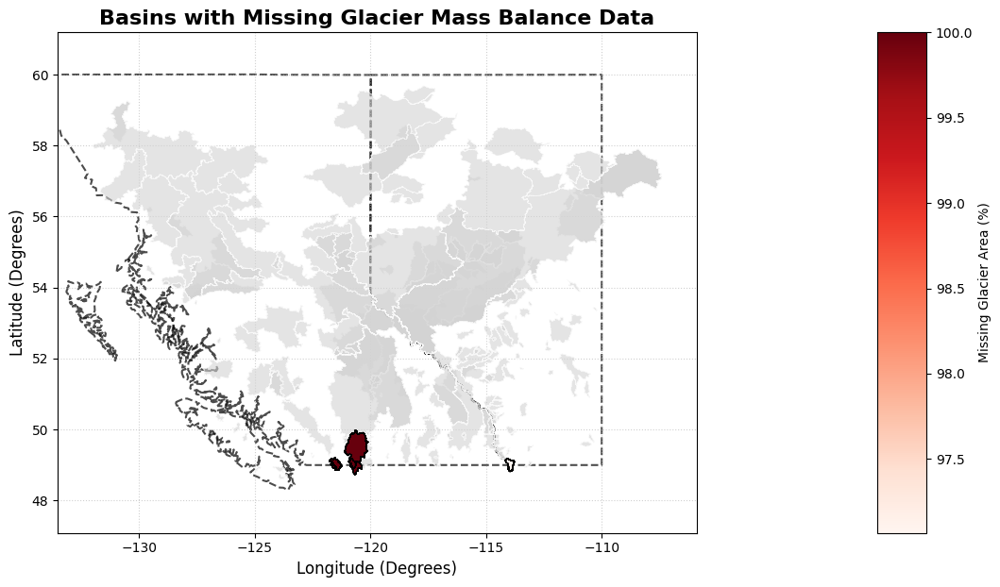

In [4]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import geopandas as gpd

print("🗺️ Generating diagnostic map in Lat/Lon...")

# 1. Fetch Province Boundaries (BC and Alberta)
# We pull a lightweight, standard GeoJSON of Canada directly from the web
try:
    url_provinces = "https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/canada.geojson"
    canada = gpd.read_file(url_provinces)
    bc_ab = canada[canada['name'].isin(['British Columbia', 'Alberta'])]
    bc_ab = bc_ab.to_crs("EPSG:4326") # Ensure it is in degrees
except Exception as e:
    print(f"⚠️ Could not load province boundaries from web: {e}")
    bc_ab = None

# 2. Prepare the basin geometries
problem_geoms = gdf_basins[gdf_basins['station_id'].isin(problem_basins.index)].copy()
problem_geoms = problem_geoms.merge(
    problem_basins[['Pct_Area_Missing']], 
    left_on='station_id', 
    right_index=True
)

# REPROJECT to EPSG:4326 (WGS 84) to convert Easting/Northing into Lat/Lon Degrees
gdf_basins_wgs = gdf_basins.to_crs("EPSG:4326")
problem_geoms_wgs = problem_geoms.to_crs("EPSG:4326")

# 3. Setup the plot
fig, ax = plt.subplots(figsize=(12, 10))

# Plot Provinces (Background Context)
if bc_ab is not None:
    bc_ab.plot(
        ax=ax,
        facecolor='none',       # Transparent fill so we can see the grid
        edgecolor='black',      # Dark border
        linewidth=1.5,
        linestyle='--',
        alpha=0.7,
        zorder=1
    )

# Plot ALL active basins as a background context (Light Gray)
gdf_basins_wgs.plot(
    ax=ax, 
    facecolor='lightgray', 
    edgecolor='white', 
    linewidth=0.5,
    alpha=0.6,
    zorder=2
)

# 4. Plot the Problematic Basins on top, colored by severity (Reds)
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.1)

problem_geoms_wgs.plot(
    ax=ax,
    column='Pct_Area_Missing',
    cmap='Reds',
    edgecolor='black',
    linewidth=0.8,
    legend=True,
    cax=cax,
    zorder=3,
    legend_kwds={'label': 'Missing Glacier Area (%)'}
)

# 5. Formatting
ax.set_title("Basins with Missing Glacier Mass Balance Data", fontsize=16, fontweight='bold')
ax.set_xlabel("Longitude (Degrees)", fontsize=12)
ax.set_ylabel("Latitude (Degrees)", fontsize=12)

# Smart Zoom: BC and AB go very far north. To prevent the map from zooming out 
# too far, we lock the camera to the boundaries of your actual basins + a 1 degree buffer.
minx, miny, maxx, maxy = gdf_basins_wgs.total_bounds
ax.set_xlim(minx - 1.5, maxx + 1.5)
ax.set_ylim(miny - 1.5, maxy + 1.5)

# Add gridlines for readability
ax.grid(True, linestyle=':', alpha=0.6)

plt.tight_layout()
plt.show()

Stations that don't have any ground truth melt data are those that have headwaters in the US. These are fine to keep in the streamflow testing pool but should be removed from the glacier correlation dataset.

--- AVAILABLE GLACIATED STATIONS ---
[00] Station: 05AD003
[01] Station: 05BA001
[02] Station: 05BB001
[03] Station: 05CA004
[04] Station: 05CA009
[05] Station: 05DA007
[06] Station: 05DA009
[07] Station: 05DA010
[08] Station: 05DB006
[09] Station: 07AA001
[10] Station: 07AA002
[11] Station: 07AD002
[12] Station: 07AE001
[13] Station: 07BE001
[14] Station: 07DA001
[15] Station: 07EA004
[16] Station: 07EA005
[17] Station: 07EC002
[18] Station: 07EC003
[19] Station: 07EE007
[20] Station: 07FB001
[21] Station: 07FB002
[22] Station: 07FB003
[23] Station: 07FB006
[24] Station: 07GA001
[25] Station: 07GJ001
[26] Station: 08CE001
[27] Station: 08DB001
[28] Station: 08EB004
[29] Station: 08EC013
[30] Station: 08ED001
[31] Station: 08ED002
[32] Station: 08EE004
[33] Station: 08EE008
[34] Station: 08EE020
[35] Station: 08EF001
[36] Station: 08EF005
[37] Station: 08EG012
[38] Station: 08FA002
[39] Station: 08FB004
[40] Station: 08FE003
[41] Station: 08FF001
[42] Station: 08FF002
[43] Station: 08F

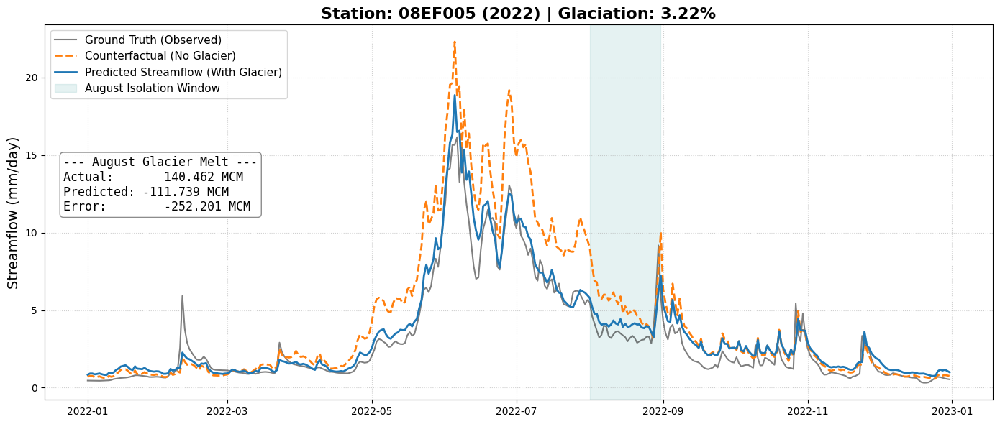

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
from src.config import PROCESSED_DATA_DIR, OUTPUT_DATA_DIR

warnings.filterwarnings('ignore')

# =========================================================
# 1. Load Initial Setup & Print Station List
# =========================================================
df_attr = pd.read_csv(PROCESSED_DATA_DIR / "static_attributes.csv", index_col=0)
df_mb = -pd.read_csv(PROCESSED_DATA_DIR / "glacier_volume_change.csv", index_col=0, parse_dates=True) 

# Get template for test dates/stations
df_test_template = pd.read_csv(OUTPUT_DATA_DIR / "test_set_predictions.csv", index_col=0, parse_dates=True)
test_dates = df_test_template.index

glaciated_stations = df_attr[df_attr['glacier_pct'] > 0].index
common_stations = glaciated_stations.intersection(df_test_template.columns).intersection(df_mb.columns)
stations_list = common_stations.tolist()

print("--- AVAILABLE GLACIATED STATIONS ---")
for i, stat in enumerate(stations_list):
    print(f"[{i:02d}] Station: {stat}")
print("-" * 36)

# =========================================================
# 2. User Input (Prompts will appear below the cell)
# =========================================================
try:
    stat_idx = int(input("Enter the Index number of the station you want to plot: "))
    target_year = int(input(f"Enter the Year (e.g., 2013 - 2022): "))
    
    target_station = stations_list[stat_idx]
except (ValueError, IndexError):
    print("\n[!] Invalid input. Please run the cell again and enter valid numbers.")
    raise

print(f"\nLoading data for Station {target_station} in {target_year}...")

# =========================================================
# 3. Load ONLY the specific station from the Ensemble
# =========================================================
ensemble_dir = OUTPUT_DATA_DIR / "phase_split"
list_pred_series, list_noglac_series = [], []

for i in range(10):
    # Only pull the exact column we need from the CSV to save memory and time
    pred = pd.read_csv(ensemble_dir / f"phase-split_preds_member_{i}.csv", index_col=0, parse_dates=True)[target_station]
    noglac = pd.read_csv(ensemble_dir / f"phase-split_preds_noglacier_member_{i}.csv", index_col=0, parse_dates=True)[target_station]
    
    list_pred_series.append(pred.loc[test_dates])
    list_noglac_series.append(noglac.loc[test_dates])

# Calculate Ensemble Means for this one station
pred_series = sum(list_pred_series) / 10
noglac_series = sum(list_noglac_series) / 10

# Load Ground Truth
df_obs = pd.read_csv(PROCESSED_DATA_DIR / "combined_streamflow.csv", index_col='Date', parse_dates=True)
obs_series = df_obs.loc[test_dates, target_station].copy()

# Convert Obs to mm/day
basin_area = df_attr.loc[target_station, 'basin_area_km2']
obs_series = obs_series * (86.4 / basin_area)

# =========================================================
# 4. Calculate August Volumes & Plot
# =========================================================
# Slice the timeseries for the selected year
obs_year = obs_series.loc[str(target_year)]
pred_year = pred_series.loc[str(target_year)]
noglac_year = noglac_series.loc[str(target_year)]

# Calculate August Melt Volumes (MCM)
aug_pred = pred_year[pred_year.index.month == 8].sum()
aug_noglac = noglac_year[noglac_year.index.month == 8].sum()

pred_melt_mcm = (aug_pred - aug_noglac) * basin_area * 0.001
act_melt_mcm = df_mb.loc[f"{target_year}-08", target_station].sum()

# --- Plotting ---
fig, ax = plt.subplots(figsize=(14, 6))

ax.plot(obs_year.index, obs_year.values, color='black', alpha=0.5, label='Ground Truth (Observed)', linewidth=1.5)
ax.plot(noglac_year.index, noglac_year.values, color='tab:orange', linestyle='--', label='Counterfactual (No Glacier)', linewidth=2)
ax.plot(pred_year.index, pred_year.values, color='tab:blue', label='Predicted Streamflow (With Glacier)', linewidth=2)

# Highlight August
august_start = pd.to_datetime(f"{target_year}-08-01")
august_end = pd.to_datetime(f"{target_year}-08-31")
ax.axvspan(august_start, august_end, color='teal', alpha=0.1, label='August Isolation Window')

# Formatting
glac_pct = df_attr.loc[target_station, 'glacier_pct']
ax.set_title(f"Station: {target_station} ({target_year}) | Glaciation: {glac_pct:.2f}%", fontsize=16, fontweight='bold')
ax.set_ylabel("Streamflow (mm/day)", fontsize=14)
ax.grid(True, linestyle=':', alpha=0.6)
ax.legend(loc='upper left', fontsize=11)

# Text Box with August Volumes
text_str = (
    f"--- August Glacier Melt ---\n"
    f"Actual:       {act_melt_mcm:>7.3f} MCM\n"
    f"Predicted: {pred_melt_mcm:>7.3f} MCM\n"
    f"Error:        {(pred_melt_mcm - act_melt_mcm):>7.3f} MCM"
)
props = dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='gray')
ax.text(0.02, 0.65, text_str, transform=ax.transAxes, fontsize=12, family='monospace',
        verticalalignment='top', bbox=props)

plt.tight_layout()
plt.show()

Loading data and filtering for valid stations...
Calculating Pearson correlations for all 10 ensemble members...
Aggregating uncertainty bounds...


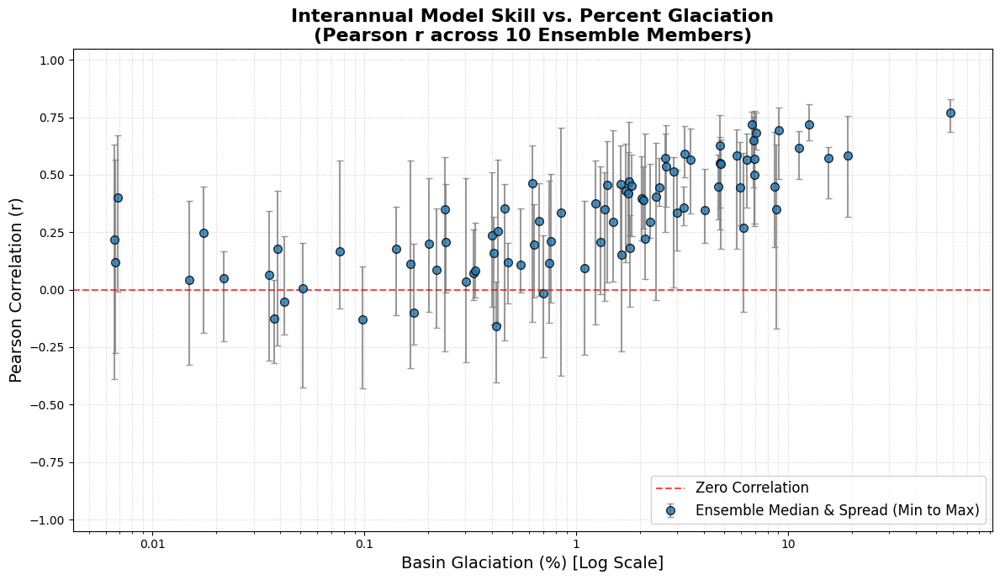

In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
import warnings
from src.config import PROCESSED_DATA_DIR, OUTPUT_DATA_DIR

warnings.filterwarnings('ignore')

# =========================================================
# 1. Load Valid Stations & Static Data
# =========================================================
print("Loading data and filtering for valid stations...")

# Load the verified stations you saved from the spatial script
with open(PROCESSED_DATA_DIR / "valid_glaciated_stations.txt", "r") as f:
    valid_stations = [line.strip() for line in f.readlines()]

df_attr = pd.read_csv(PROCESSED_DATA_DIR / "static_attributes.csv", index_col=0)
df_mb = -pd.read_csv(PROCESSED_DATA_DIR / "glacier_volume_change.csv", index_col=0, parse_dates=True) # Native MCM

# Ensure we only use valid stations that also have attributes and MB data
common_stations = df_attr.index.intersection(df_mb.columns).intersection(valid_stations)

df_mb_full = df_mb[common_stations].copy()
basin_areas = df_attr.loc[common_stations, 'basin_area_km2']
glac_pct = df_attr.loc[common_stations, 'glacier_pct']

# Calculate Actual August MCM per year (1980-2022)
df_act_mcm = df_mb_full[df_mb_full.index.month == 8].groupby(df_mb_full[df_mb_full.index.month == 8].index.year).sum()
df_act_mcm = df_act_mcm[(df_act_mcm.index >= 1980) & (df_act_mcm.index <= 2022)]

# =========================================================
# 2. Calculate Pearson Correlation Per Ensemble Member
# =========================================================
print("Calculating Pearson correlations for all 10 ensemble members...")
ensemble_dir = OUTPUT_DATA_DIR / "phase_split"

# Dictionary to hold the 10 correlation scores for each station
station_corrs = {stat: [] for stat in common_stations}

for i in range(10):
    # Load specific member predictions
    pred = pd.read_csv(ensemble_dir / f"phase-split_preds_member_{i}.csv", index_col=0, parse_dates=True)[common_stations]
    noglac = pd.read_csv(ensemble_dir / f"phase-split_preds_noglacier_member_{i}.csv", index_col=0, parse_dates=True)[common_stations]
    
    # Calculate August Predicted MCM for this specific member
    diff_mm = pred - noglac
    diff_aug_mm = diff_mm[diff_mm.index.month == 8].groupby(diff_mm[diff_mm.index.month == 8].index.year).sum()
    pred_mcm = diff_aug_mm * basin_areas * 0.001
    pred_mcm = pred_mcm[(pred_mcm.index >= 1980) & (pred_mcm.index <= 2022)]
    
    # Align years perfectly with actual data
    common_years = df_act_mcm.index.intersection(pred_mcm.index)
    act_aligned = df_act_mcm.loc[common_years]
    pred_aligned = pred_mcm.loc[common_years]
    
    # Calculate Pearson Correlation for each station over the 42 years
    for stat in common_stations:
        act_series = act_aligned[stat].values
        pred_series = pred_aligned[stat].values
        
        # Only calculate if there is actual variance to avoid flatline math errors
        if np.std(act_series) > 0.0001 and np.std(pred_series) > 0.0001:
            r, _ = stats.pearsonr(act_series, pred_series)
            station_corrs[stat].append(r)
        else:
            station_corrs[stat].append(np.nan)

# =========================================================
# 3. Aggregate Ensemble Uncertainty
# =========================================================
print("Aggregating uncertainty bounds...")

# Calculate Median, Min, and Max correlation for error bars
records = []
for stat, corrs in station_corrs.items():
    if len(corrs) > 0 and not np.all(np.isnan(corrs)):
        med_r = np.nanmedian(corrs)
        min_r = np.nanmin(corrs)
        max_r = np.nanmax(corrs)
        records.append({
            'Station': stat,
            'Glacier_Pct': glac_pct[stat],
            'Median_R': med_r,
            'Error_Lower': med_r - min_r, # Distance from median to min
            'Error_Upper': max_r - med_r  # Distance from median to max
        })

df_plot = pd.DataFrame(records).sort_values(by='Glacier_Pct')

# =========================================================
# 4. Plotting Scatter with Error Bars
# =========================================================
fig, ax = plt.subplots(figsize=(12, 7))

# Plot the individual station dots with Ensemble Error Bars
ax.errorbar(df_plot['Glacier_Pct'], df_plot['Median_R'], 
            yerr=[df_plot['Error_Lower'], df_plot['Error_Upper']], 
            fmt='o', color='tab:blue', ecolor='gray', elinewidth=1.5, capsize=3, alpha=0.8,
            markeredgecolor='black', markersize=7, label='Ensemble Median & Spread (Min to Max)')

# Formatting
ax.axhline(0, color='red', linestyle='--', alpha=0.7, linewidth=1.5, label='Zero Correlation')
ax.set_title('Interannual Model Skill vs. Percent Glaciation\n(Pearson r across 10 Ensemble Members)', fontsize=16, fontweight='bold')
ax.set_xlabel('Basin Glaciation (%) [Log Scale]', fontsize=14)
ax.set_ylabel("Pearson Correlation (r)", fontsize=14)

# Set X-axis to Log Scale to prevent clustering on the left edge
ax.set_xscale('log')

# Custom X-ticks so the log scale is readable
import matplotlib.ticker as ticker
ax.xaxis.set_major_formatter(ticker.FuncFormatter(lambda y, _: '{:g}'.format(y)))

# Add a subtle grid
ax.grid(True, linestyle=':', alpha=0.6, which='both')
ax.set_ylim(-1.05, 1.05)
ax.legend(loc='lower right', fontsize=12, framealpha=0.9)

plt.tight_layout()
plt.show()

Loading data and filtering for valid stations...
Calculating ensemble mean predictions (1980-2022)...
Flattening dataset and computing metrics...


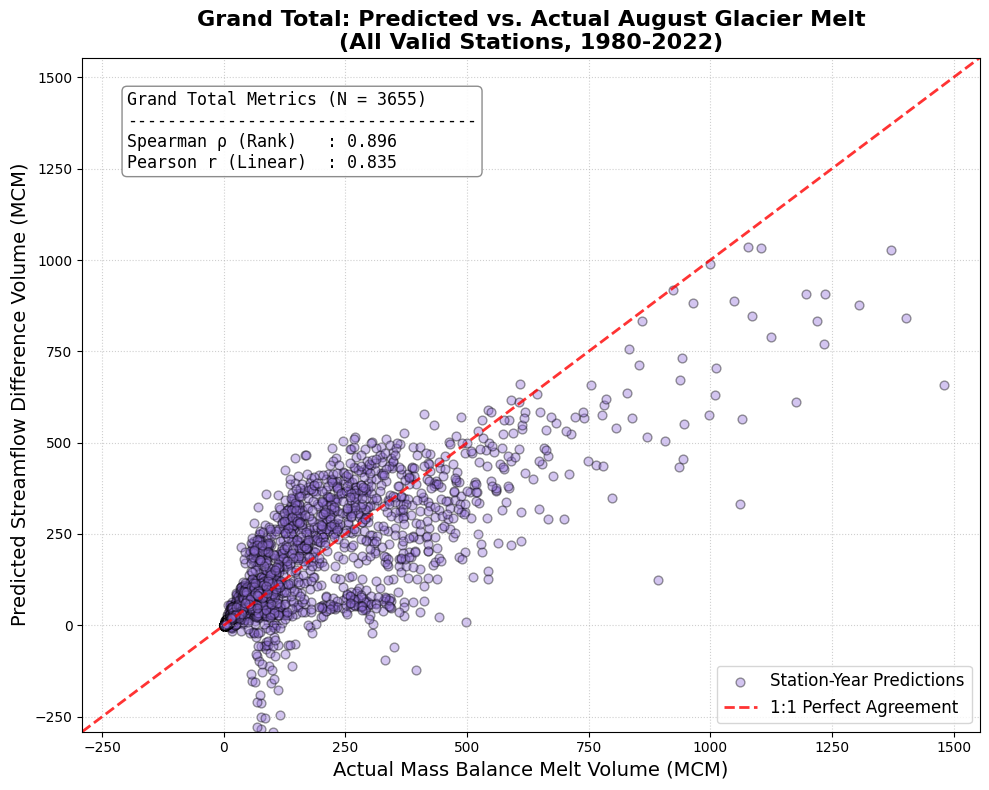

In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
import warnings
from src.config import PROCESSED_DATA_DIR, OUTPUT_DATA_DIR

warnings.filterwarnings('ignore')

# =========================================================
# 1. Load Valid Stations & Static Data
# =========================================================
print("Loading data and filtering for valid stations...")

# Load the verified stations saved from the spatial script
with open(PROCESSED_DATA_DIR / "valid_glaciated_stations.txt", "r") as f:
    valid_stations = [line.strip() for line in f.readlines()]

df_attr = pd.read_csv(PROCESSED_DATA_DIR / "static_attributes.csv", index_col=0)
df_mb = -pd.read_csv(PROCESSED_DATA_DIR / "glacier_volume_change.csv", index_col=0, parse_dates=True) # Native MCM

common_stations = df_attr.index.intersection(df_mb.columns).intersection(valid_stations)

df_mb_full = df_mb[common_stations].copy()
basin_areas = df_attr.loc[common_stations, 'basin_area_km2']

# Calculate Actual August MCM per year (1980-2022)
df_act_mcm = df_mb_full[df_mb_full.index.month == 8].groupby(df_mb_full[df_mb_full.index.month == 8].index.year).sum()
df_act_mcm = df_act_mcm[(df_act_mcm.index >= 1980) & (df_act_mcm.index <= 2022)]

# =========================================================
# 2. Calculate Ensemble Mean Predictions
# =========================================================
print("Calculating ensemble mean predictions (1980-2022)...")
ensemble_dir = OUTPUT_DATA_DIR / "phase_split"

# Get full date index from a template
template = pd.read_csv(ensemble_dir / "phase-split_preds_member_0.csv", index_col=0, parse_dates=True)
full_dates = template.index

df_pred_sum = pd.DataFrame(0.0, index=full_dates, columns=common_stations)
df_noglac_sum = pd.DataFrame(0.0, index=full_dates, columns=common_stations)

for i in range(10):
    pred = pd.read_csv(ensemble_dir / f"phase-split_preds_member_{i}.csv", index_col=0, parse_dates=True)[common_stations]
    noglac = pd.read_csv(ensemble_dir / f"phase-split_preds_noglacier_member_{i}.csv", index_col=0, parse_dates=True)[common_stations]
    df_pred_sum += pred
    df_noglac_sum += noglac

df_pred_mean = df_pred_sum / 10
df_noglac_mean = df_noglac_sum / 10

# Calculate daily difference (mm/day)
df_diff_mm = df_pred_mean - df_noglac_mean

# Isolate August and calculate monthly sum (mm/month)
df_diff_aug_mm = df_diff_mm[df_diff_mm.index.month == 8].groupby(df_diff_mm[df_diff_mm.index.month == 8].index.year).sum()

# Convert predicted depth to volume (MCM)
df_pred_mcm = df_diff_aug_mm * basin_areas * 0.001
df_pred_mcm = df_pred_mcm[(df_pred_mcm.index >= 1980) & (df_pred_mcm.index <= 2022)]

# =========================================================
# 3. Flatten Data and Calculate Grand Total Correlation
# =========================================================
print("Flattening dataset and computing metrics...")

# Align years perfectly
common_years = df_act_mcm.index.intersection(df_pred_mcm.index)
act_aligned = df_act_mcm.loc[common_years].values.flatten()
pred_aligned = df_pred_mcm.loc[common_years].values.flatten()

# Remove NaNs to compute clean correlations
valid_mask = ~(np.isnan(act_aligned) | np.isnan(pred_aligned))
act_clean = act_aligned[valid_mask]
pred_clean = pred_aligned[valid_mask]

# Calculate Metrics
pearson_r, _ = stats.pearsonr(act_clean, pred_clean)
spearman_rho, _ = stats.spearmanr(act_clean, pred_clean)

# =========================================================
# 4. Plotting
# =========================================================
fig, ax = plt.subplots(figsize=(10, 8))

# Scatter Plot
ax.scatter(act_clean, pred_clean, color='mediumpurple', alpha=0.4, edgecolor='k', s=40, label='Station-Year Predictions')

# 1:1 Reference Line
max_val = max(act_clean.max(), pred_clean.max())
min_val = min(min(act_clean), min(pred_clean), 0) # Account for any negative predictions
ax.plot([min_val, max_val * 1.05], [min_val, max_val * 1.05], 'r--', linewidth=2, alpha=0.8, label='1:1 Perfect Agreement')

# Formatting
ax.set_title('Grand Total: Predicted vs. Actual August Glacier Melt\n(All Valid Stations, 1980-2022)', fontsize=16, fontweight='bold')
ax.set_xlabel('Actual Mass Balance Melt Volume (MCM)', fontsize=14)
ax.set_ylabel('Predicted Streamflow Difference Volume (MCM)', fontsize=14)

# Set axes limits to start neatly at the minimum value
ax.set_xlim(min_val, max_val * 1.05)
ax.set_ylim(min_val, max_val * 1.05)

# Text Box with Metrics
text_str = (
    f"Grand Total Metrics (N = {len(act_clean)})\n"
    f"-----------------------------------\n"
    f"Spearman ρ (Rank)   : {spearman_rho:.3f}\n"
    f"Pearson r (Linear)  : {pearson_r:.3f}"
)
props = dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='gray')
ax.text(0.05, 0.95, text_str, transform=ax.transAxes, fontsize=12, family='monospace',
        verticalalignment='top', bbox=props)

ax.grid(True, linestyle=':', alpha=0.6)
ax.legend(loc='lower right', fontsize=12)

plt.tight_layout()
plt.show()

Loading static attributes and mass balance...
Calculating ensemble statistics (mean, median, std) over the dataset...
Scanning for negative predicted glacier melt anomalies...

[!] Found 182 occurrences of negative predicted glacier melt.
Generating plots for the Top 10 most extreme negative occurrences...



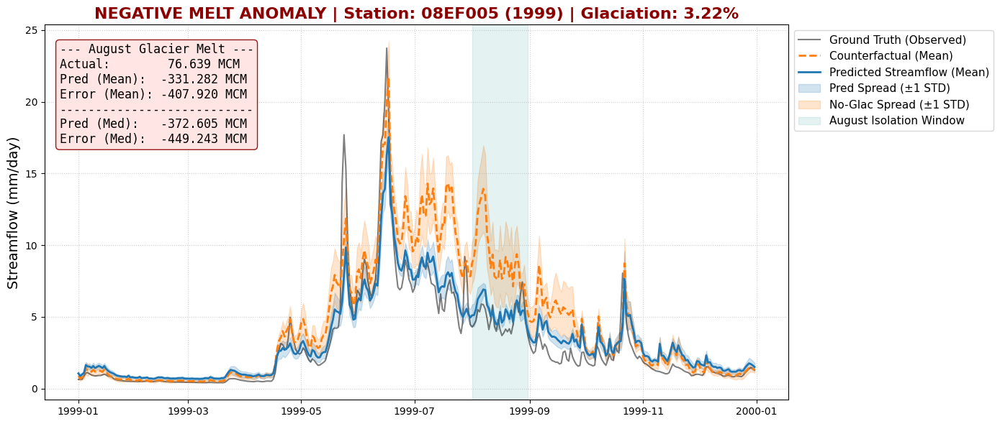

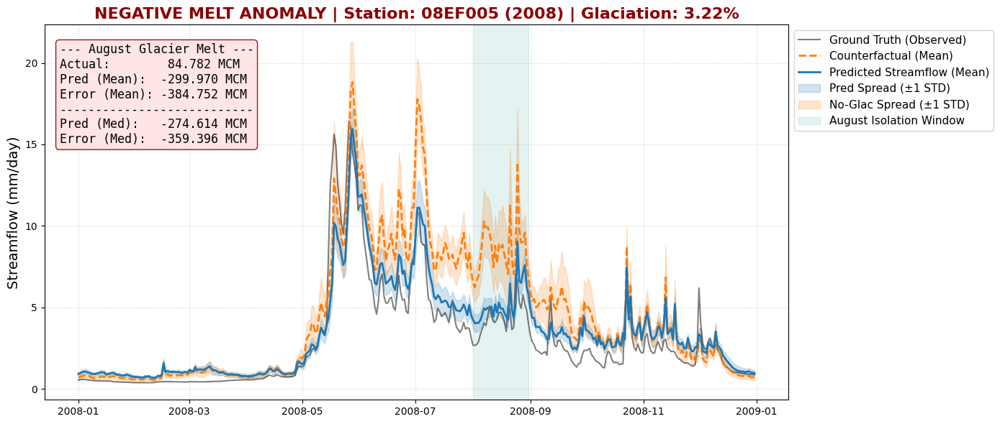

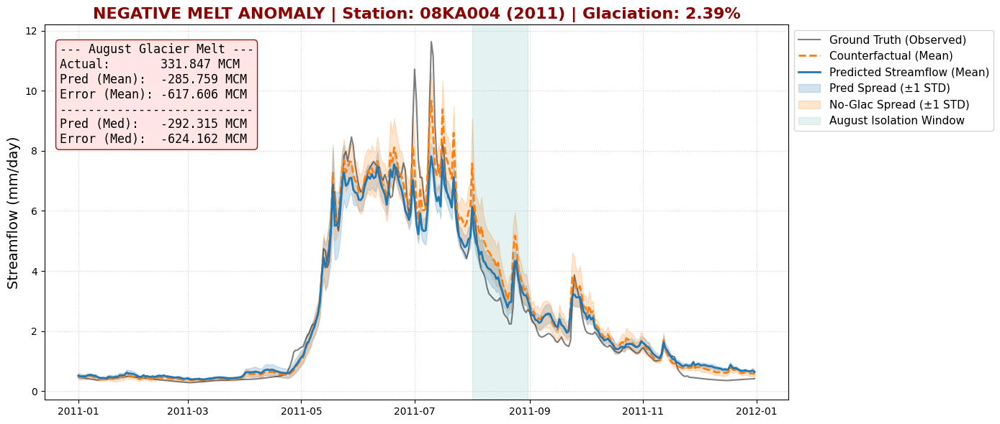

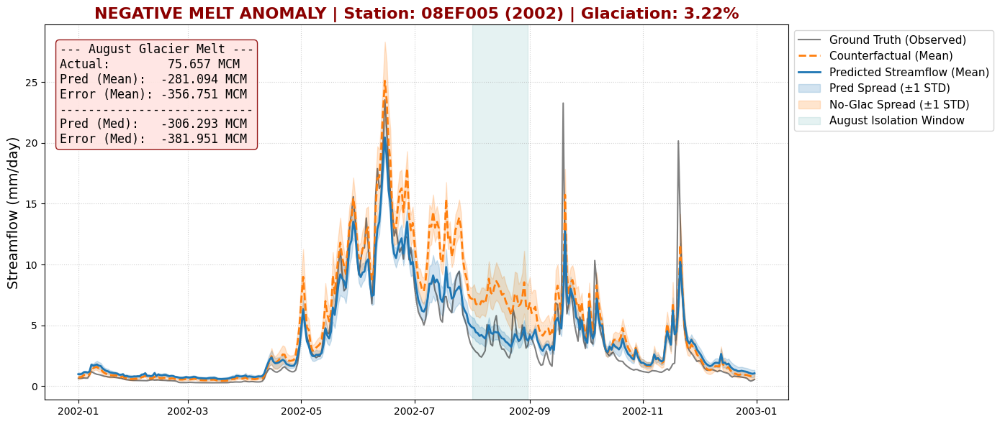

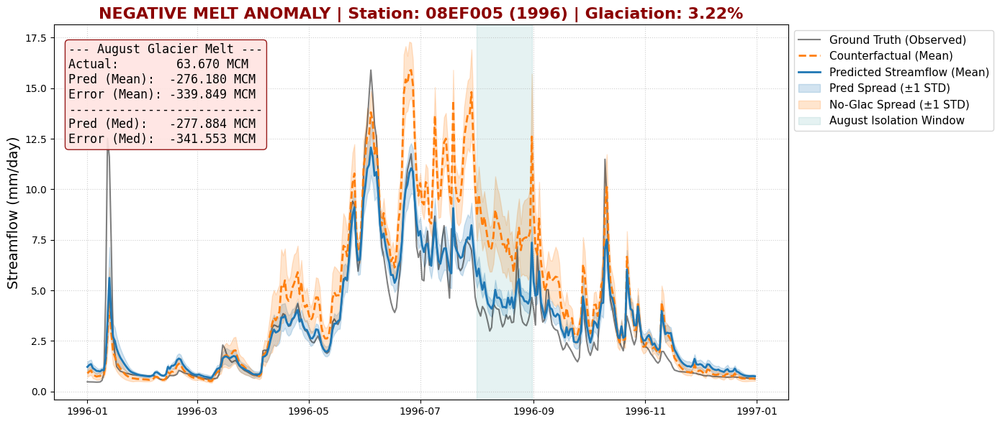

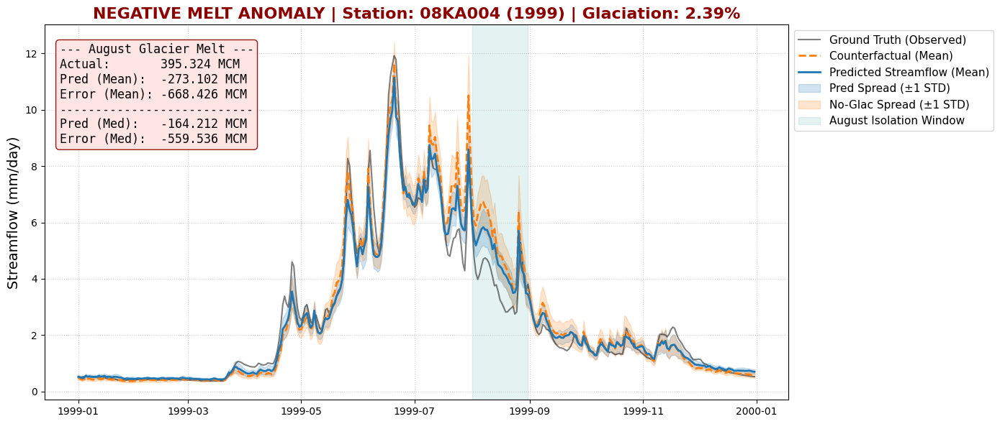

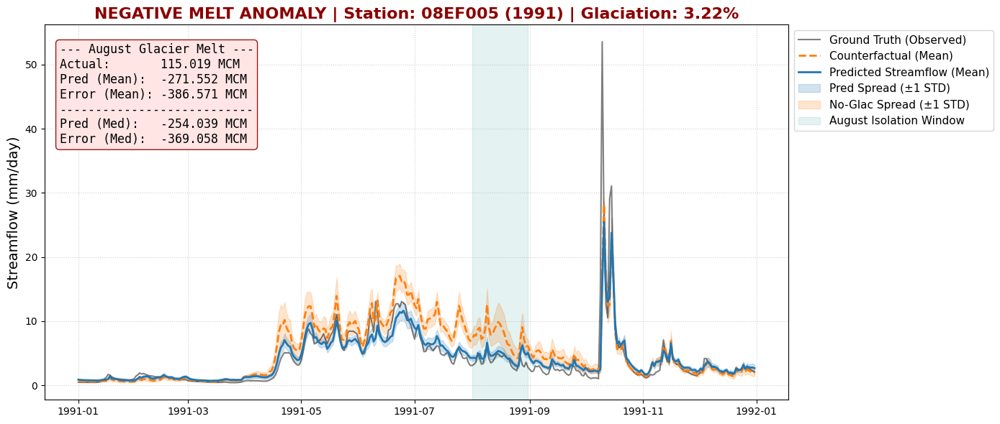

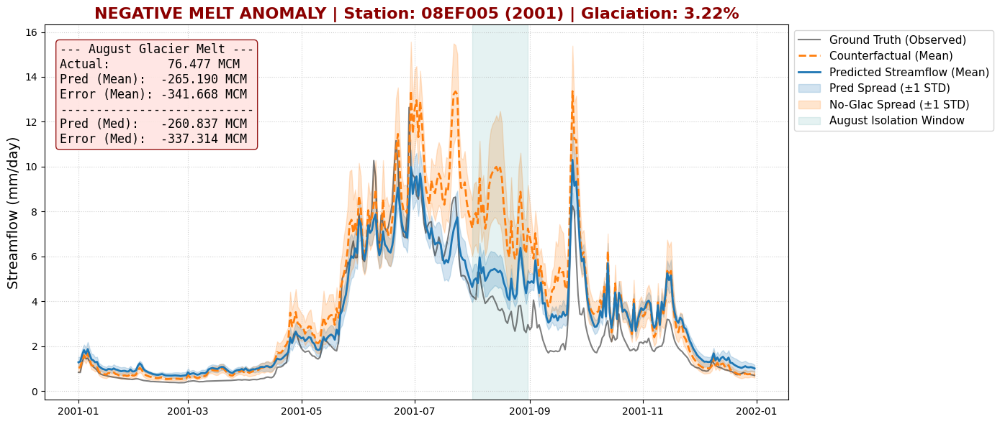

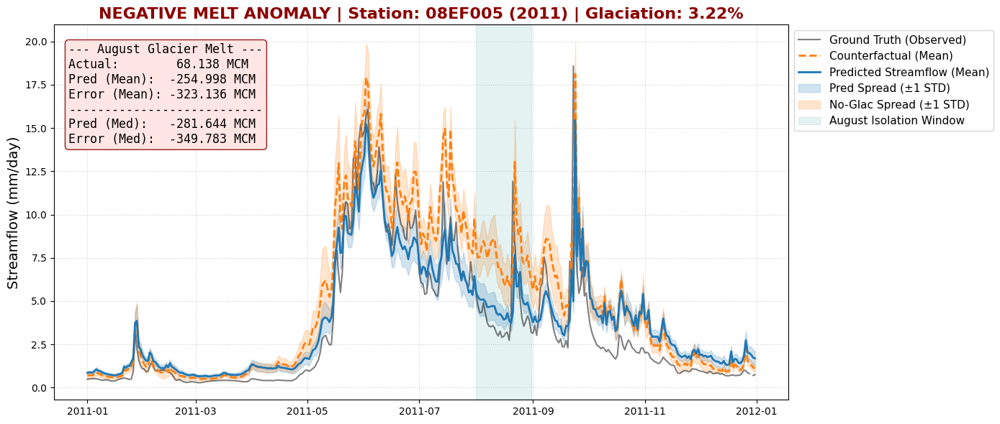

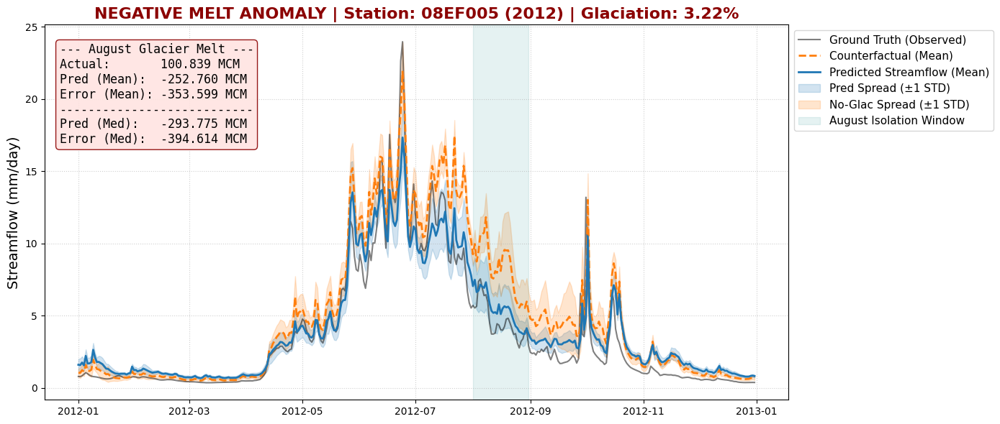

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
from src.config import PROCESSED_DATA_DIR, OUTPUT_DATA_DIR

warnings.filterwarnings('ignore')

# =========================================================
# 1. Load Setup & Identify Glaciated Stations
# =========================================================
print("Loading static attributes and mass balance...")
df_attr = pd.read_csv(PROCESSED_DATA_DIR / "static_attributes.csv", index_col=0)
df_mb = -pd.read_csv(PROCESSED_DATA_DIR / "glacier_volume_change.csv", index_col=0, parse_dates=True) 

glaciated_stations = df_attr[df_attr['glacier_pct'] > 0].index

template = pd.read_csv(OUTPUT_DATA_DIR / "topographic" / "topographic_preds_member_0.csv", index_col=0, parse_dates=True)
common_stations = glaciated_stations.intersection(template.columns).intersection(df_mb.columns)
full_dates = template.index

df_mb_full = df_mb[common_stations].copy()
basin_areas = df_attr.loc[common_stations, 'basin_area_km2']

# =========================================================
# 2. Calculate Full Ensemble Means, Medians & Spread
# =========================================================
print("Calculating ensemble statistics (mean, median, std) over the dataset...")
ensemble_dir = OUTPUT_DATA_DIR / "topographic"

preds_list = []
noglacs_list = []

for i in range(10):
    pred = pd.read_csv(ensemble_dir / f"topographic_preds_member_{i}.csv", index_col=0, parse_dates=True)[common_stations]
    noglac = pd.read_csv(ensemble_dir / f"topographic_preds_noglacier_member_{i}.csv", index_col=0, parse_dates=True)[common_stations]
    
    preds_list.append(pred)
    noglacs_list.append(noglac)

# Convert lists to 3D arrays (shape: 10, dates, stations) for vectorized stats
preds_arr = np.array(preds_list)
noglacs_arr = np.array(noglacs_list)

# Calculate Mean
df_pred_mean = pd.DataFrame(np.mean(preds_arr, axis=0), index=full_dates, columns=common_stations)
df_noglac_mean = pd.DataFrame(np.mean(noglacs_arr, axis=0), index=full_dates, columns=common_stations)

# Calculate Standard Deviation (Spread)
df_pred_std = pd.DataFrame(np.std(preds_arr, axis=0), index=full_dates, columns=common_stations)
df_noglac_std = pd.DataFrame(np.std(noglacs_arr, axis=0), index=full_dates, columns=common_stations)

# Calculate Median
df_pred_median = pd.DataFrame(np.median(preds_arr, axis=0), index=full_dates, columns=common_stations)
df_noglac_median = pd.DataFrame(np.median(noglacs_arr, axis=0), index=full_dates, columns=common_stations)

# Load Ground Truth and convert to mm/day
df_obs = pd.read_csv(PROCESSED_DATA_DIR / "combined_streamflow.csv", index_col='Date', parse_dates=True)
df_obs_full = df_obs.loc[df_pred_mean.index.intersection(df_obs.index), common_stations].copy()

for stat in common_stations:
    df_obs_full[stat] = df_obs_full[stat] * (86.4 / basin_areas[stat])

# =========================================================
# 3. Scan for Negative Melt Anomalies (MEAN & MEDIAN Pipelines)
# =========================================================
print("Scanning for negative predicted glacier melt anomalies...")

def calculate_august_mcm(df_glacier, df_no_glacier):
    """Helper to calculate August MCM volumes from daily mm streamflow."""
    df_diff_mm = df_glacier - df_no_glacier
    df_diff_aug_mm = df_diff_mm[df_diff_mm.index.month == 8].groupby(df_diff_mm[df_diff_mm.index.month == 8].index.year).sum()
    df_mcm = df_diff_aug_mm * basin_areas * 0.001
    df_mcm.index.name = 'Year'
    return df_mcm

# Calculate MCM volumes for both Mean and Median
df_pred_mcm_yearly_mean = calculate_august_mcm(df_pred_mean, df_noglac_mean)
df_pred_mcm_yearly_median = calculate_august_mcm(df_pred_median, df_noglac_median)

# Melt the 'Mean' dataframe to find anomalies
df_long = df_pred_mcm_yearly_mean.reset_index().melt(id_vars='Year', var_name='Station', value_name='Predicted_MCM')
anomalies = df_long[df_long['Predicted_MCM'] < 0].sort_values(by='Predicted_MCM')

print(f"\n[!] Found {len(anomalies)} occurrences of negative predicted glacier melt.")

# =========================================================
# 4. Plot Anomalies
# =========================================================
MAX_PLOTS = 10 

if len(anomalies) > 0:
    plots_to_show = min(len(anomalies), MAX_PLOTS)
    print(f"Generating plots for the Top {plots_to_show} most extreme negative occurrences...\n")
    
    for idx, row in anomalies.head(plots_to_show).iterrows():
        target_year = int(row['Year'])
        target_station = row['Station']
        pred_melt_mcm_mean = row['Predicted_MCM']
        pred_melt_mcm_median = df_pred_mcm_yearly_median.loc[target_year, target_station]
        
        # Slice the timeseries for the selected year
        obs_year = df_obs_full.loc[str(target_year), target_station]
        
        pred_year = df_pred_mean.loc[str(target_year), target_station]
        pred_std_year = df_pred_std.loc[str(target_year), target_station]
        
        noglac_year = df_noglac_mean.loc[str(target_year), target_station]
        noglac_std_year = df_noglac_std.loc[str(target_year), target_station]
        
        # Get actual melt (safe fetch)
        try:
            act_melt_mcm = df_mb_full.loc[f"{target_year}-08", target_station].sum()
        except KeyError:
            act_melt_mcm = np.nan
            
        # --- Plotting ---
        fig, ax = plt.subplots(figsize=(14, 6))

        # Plot Means
        ax.plot(obs_year.index, obs_year.values, color='black', alpha=0.5, label='Ground Truth (Observed)', linewidth=1.5)
        ax.plot(noglac_year.index, noglac_year.values, color='tab:orange', linestyle='--', label='Counterfactual (Mean)', linewidth=2)
        ax.plot(pred_year.index, pred_year.values, color='tab:blue', label='Predicted Streamflow (Mean)', linewidth=2)

        # Plot Ensemble Spread (±1 Standard Deviation)
        ax.fill_between(pred_year.index, 
                        pred_year.values - pred_std_year.values, 
                        pred_year.values + pred_std_year.values, 
                        color='tab:blue', alpha=0.2, label='Pred Spread (±1 STD)')
        
        ax.fill_between(noglac_year.index, 
                        noglac_year.values - noglac_std_year.values, 
                        noglac_year.values + noglac_std_year.values, 
                        color='tab:orange', alpha=0.2, label='No-Glac Spread (±1 STD)')

        # Highlight August
        august_start = pd.to_datetime(f"{target_year}-08-01")
        august_end = pd.to_datetime(f"{target_year}-08-31")
        ax.axvspan(august_start, august_end, color='teal', alpha=0.1, label='August Isolation Window')

        # Formatting
        glac_pct = df_attr.loc[target_station, 'glacier_pct']
        ax.set_title(f"NEGATIVE MELT ANOMALY | Station: {target_station} ({target_year}) | Glaciation: {glac_pct:.2f}%", fontsize=16, fontweight='bold', color='darkred')
        ax.set_ylabel("Streamflow (mm/day)", fontsize=14)
        ax.grid(True, linestyle=':', alpha=0.6)
        
        # Move legend outside to prevent covering data
        ax.legend(loc='upper left', bbox_to_anchor=(1, 1), fontsize=11)

        # Text Box with Mean vs Median Comparison
        text_str = (
            f"--- August Glacier Melt ---\n"
            f"Actual:       {act_melt_mcm:>7.3f} MCM\n"
            f"Pred (Mean):  {pred_melt_mcm_mean:>7.3f} MCM\n"
            f"Error (Mean): {(pred_melt_mcm_mean - act_melt_mcm):>7.3f} MCM\n"
            f"---------------------------\n"
            f"Pred (Med):   {pred_melt_mcm_median:>7.3f} MCM\n"
            f"Error (Med):  {(pred_melt_mcm_median - act_melt_mcm):>7.3f} MCM"
        )
        props = dict(boxstyle='round', facecolor='mistyrose', alpha=0.9, edgecolor='darkred')
        ax.text(0.02, 0.95, text_str, transform=ax.transAxes, fontsize=12, family='monospace',
                verticalalignment='top', bbox=props)

        plt.tight_layout()
        plt.show()
else:
    print("No negative predicted melt occurrences found in the dataset!")